# Copula를 이용한 척도 비교 / Sample = 1827 개씩 500번 시뮬레이션 시행 , epoch = 30 

# 패키지 , 데이터 불러오기

In [1]:
import os
import pickle 
import sdv.metrics
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings

warnings.filterwarnings(action='ignore')

In [3]:
# 한글 폰트 사용을 위해서 세팅
from matplotlib import font_manager, rc
font_path = "C:/Windows/Fonts/malgun.TTF"
font = font_manager.FontProperties(fname=font_path).get_name()
rc('font', family=font)

# 평가척도를 위한 패키지 불러오기

In [4]:
from sdmetrics.single_column import KSComplement
from sdmetrics.column_pairs import CorrelationSimilarity
from sdmetrics.single_column import RangeCoverage
from sdmetrics.single_column import StatisticSimilarity
from sdmetrics.single_column import BoundaryAdherence
from sdmetrics.single_column import CSTest
from sdmetrics.single_table import NewRowSynthesis
from sdv.metadata import SingleTableMetadata # 싱글 메타 데이터의 경우에만! 멀티 메타 데이터의 경우에는 패키지를 다르게 불러와야함
from sdmetrics.reports.single_table import QualityReport 
from sdmetrics.reports.single_table import DiagnosticReport
from sdv.evaluation.single_table import evaluate_quality # Use this function to evaluate the quality of your synthetic data in terms of column shapes and correlations.
from sdv.evaluation.single_table import run_diagnostic # Check to see if the synthetic rows are pure copies of the real data
from sdv.evaluation.single_table import get_column_plot # Use this function to visualize a real column against the same synthetic column

# 서버에서 돌린 데이터 불러오기

In [5]:
path = "C:/Users/dnflv/Desktop/data"

In [6]:
os.chdir(path)

In [7]:
dir_list = os.listdir(path)

In [8]:
print(dir_list)

['all_rho1_data.pkl', 'all_rho1_mvn.pkl', 'all_rho2_data.pkl', 'all_rho2_mvn.pkl', 'all_rho3_data.pkl', 'all_rho3_mvn.pkl', 'all_rho4_data.pkl', 'all_rho4_mvn.pkl', 'all_rho5_data.pkl', 'all_rho5_mvn.pkl', 'CG', 'non_rho1_data.pkl', 'non_rho1_mvn.pkl', 'non_rho2_data.pkl', 'non_rho2_mvn.pkl', 'non_rho3_data.pkl', 'non_rho3_mvn.pkl', 'non_rho4_data.pkl', 'non_rho4_mvn.pkl', 'non_rho5_data.pkl', 'non_rho5_mvn.pkl']


In [9]:
def load_pickle(file_name) : 
    with open(file_name , 'rb') as f:
        return pickle.load(f)

### 경상소득(포함) 다변량 정규분포 불러오기

In [10]:
all_rho1_mvn = load_pickle(dir_list[1])
all_rho2_mvn = load_pickle(dir_list[3])
all_rho3_mvn = load_pickle(dir_list[5])
all_rho4_mvn = load_pickle(dir_list[7])
all_rho5_mvn = load_pickle(dir_list[9])

### 경상소득(미포함) 다변량 정규분포 불러오기

In [11]:
non_rho1_mvn = load_pickle(dir_list[12])
non_rho2_mvn = load_pickle(dir_list[14])
non_rho3_mvn = load_pickle(dir_list[16])
non_rho4_mvn = load_pickle(dir_list[18])
non_rho5_mvn = load_pickle(dir_list[20])

### 경상소득(포함) 다변량 정규분포의 재현자료 불러오기

In [12]:
path = "C:/Users/dnflv/Desktop/data/CG"

In [13]:
os.chdir(path)

In [14]:
dir_list = os.listdir(path)

In [15]:
print(dir_list)

['CG_all_rho1_data.pkl', 'CG_all_rho2_data.pkl', 'CG_all_rho3_data.pkl', 'CG_all_rho4_data.pkl', 'CG_all_rho5_data.pkl', 'CG_non_rho1_data.pkl', 'CG_non_rho2_data.pkl', 'CG_non_rho3_data.pkl', 'CG_non_rho4_data.pkl', 'CG_non_rho5_data.pkl']


In [16]:
ori_all_rho1_data = load_pickle(dir_list[0])
ori_all_rho2_data = load_pickle(dir_list[1])
ori_all_rho3_data = load_pickle(dir_list[2])
ori_all_rho4_data = load_pickle(dir_list[3])
ori_all_rho5_data = load_pickle(dir_list[4])

### 경상소득(미포함) 다변량 정규분포 재현자료 불러오기

In [17]:
ori_non_rho1_data = load_pickle(dir_list[5])
ori_non_rho2_data = load_pickle(dir_list[6])
ori_non_rho3_data = load_pickle(dir_list[7])
ori_non_rho4_data = load_pickle(dir_list[8])
ori_non_rho5_data = load_pickle(dir_list[9])

### 미포함 자료에 대한 경상소득(조사) 열 만들기

In [18]:
def sum_income(data) : 
    
    for i in range(500):
        data[i]['경상소득(조사)'] = data[i].iloc[:,1:6].sum(axis = 1)
        

In [19]:
sum_income(non_rho1_mvn)
sum_income(non_rho2_mvn)
sum_income(non_rho3_mvn)
sum_income(non_rho4_mvn)
sum_income(non_rho5_mvn)

In [20]:
sum_income(ori_non_rho1_data)
sum_income(ori_non_rho2_data)
sum_income(ori_non_rho3_data)
sum_income(ori_non_rho4_data)
sum_income(ori_non_rho5_data)

In [77]:
ori_non_rho1_data[0]

,MD제공용_가구고유번호,경상소득_근로소득(조사),경상소득_사업소득(조사),경상소득_재산소득(조사),경상소득_공적이전소득(조사),경상소득_사적이전소득(조사),경상소득(조사)
0,0,5938.763895,45.807763,-1697.648535,2427.676367,-279.637526,6434.961964
1,1,-1551.452402,4643.239446,-896.755454,394.519882,-425.648377,2163.903095
2,2,10357.315354,-1055.617337,1908.835433,1269.433346,50.577696,12530.544492
3,3,2538.578134,27.102877,-1765.806402,-1022.140891,-286.140770,-508.407052
4,4,10873.079890,5924.394716,3642.557395,-1856.526751,-95.836912,18487.668338
...,...,...,...,...,...,...,...
1822,1822,-717.613492,2780.566530,-1110.638956,1925.257487,248.472075,3126.043644
1823,1823,6563.257606,-1520.982750,1856.130979,714.345455,142.183254,7754.934544
1824,1824,2197.415612,2031.421363,770.268605,-1359.373482,279.360848,3919.092945
1825,1825,3042.370068,8809.615295,1844.172120,-156.440469,-799.686989,12740.030024


## 편차 구해주고 평균 , 표준편차 구해주고 데이터프레임으로 만들어주는 함수

In [21]:
def unbiased(variable, synthetic_data, mvn_data, iteration):
    
    diffs = np.zeros((iteration, 7))  

    for i in range(iteration):
        diffs[i, 0] = synthetic_data[i][variable].mean() - mvn_data[i][variable].mean()
        diffs[i, 1] = synthetic_data[i][variable].std() - mvn_data[i][variable].std()
        diffs[i, 2] = np.quantile(synthetic_data[i][variable], q=0.25) - np.quantile(mvn_data[i][variable], q=0.25)
        diffs[i, 3] = np.quantile(synthetic_data[i][variable], q=0.50) - np.quantile(mvn_data[i][variable], q=0.50)
        diffs[i, 4] = np.quantile(synthetic_data[i][variable], q=0.75) - np.quantile(mvn_data[i][variable], q=0.75)
        diffs[i, 5] = np.quantile(synthetic_data[i][variable], q=0.90) - np.quantile(mvn_data[i][variable], q=0.90)
        diffs[i, 6] = np.quantile(synthetic_data[i][variable], q=0.99) - np.quantile(mvn_data[i][variable], q=0.99)

    # 평균과 표준편차 계산
    mean_diff = np.mean(diffs, axis=0)
    std_diff = np.std(diffs, axis=0)

    # 결과 DataFrame 생성
    result = pd.DataFrame({'Bias의 평균': mean_diff, 'Bias의 표준편차': std_diff},
                          index=['평균', '표준편차', '25%', '50%', '75%', '90%', '99%'])
    
    return result


### 경상소득(조사) 포함 안된 것에 대한 데이터프레임

In [30]:
a1 = unbiased('경상소득(조사)' , ori_non_rho1_data , non_rho1_mvn , 500)
a2 = unbiased('경상소득(조사)' , ori_non_rho2_data , non_rho2_mvn , 500)
a3 = unbiased('경상소득(조사)' , ori_non_rho3_data , non_rho3_mvn , 500)
a4 = unbiased('경상소득(조사)' , ori_non_rho4_data , non_rho4_mvn , 500)
a5 = unbiased('경상소득(조사)' , ori_non_rho5_data , non_rho5_mvn , 500)

In [31]:
pd.concat([a1,a2,a3,a4,a5] , axis = 1)

,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차
평균,177.981544,2359.933886,32.590520,2432.778354,-35.260852,2416.420432,-7.021661,2233.108380,80.035574,1925.401097
표준편차,1259.361839,503.584980,537.336163,490.147148,-122.355335,535.252861,-456.719038,546.122713,-654.609866,604.634318
25%,-752.300508,2444.626198,-422.862706,2541.160882,-70.130656,2512.395458,157.913876,2350.315621,332.884206,2049.862920
50%,174.144035,2458.930062,20.942808,2542.745553,-48.169612,2517.853936,-23.230480,2358.846870,61.984360,2036.227777
75%,1108.379445,2447.707050,489.311664,2497.131185,-14.710149,2489.057748,-181.899667,2332.391165,-175.855218,2060.730369
90%,1873.712348,2387.516578,842.785918,2450.429581,-74.690356,2480.462564,-429.851609,2279.061002,-574.784211,2052.919723
99%,2819.078457,2338.430624,949.597115,2307.376960,-568.553379,2347.378503,-1529.104049,2196.352787,-2042.862868,2029.330241


### 경상소득(조사) 포함 된 것에 대한 데이터프레임

In [32]:
b1 = unbiased('경상소득(조사)' , ori_all_rho1_data , all_rho1_mvn , 500)
b2 = unbiased('경상소득(조사)' , ori_all_rho2_data , all_rho2_mvn , 500)
b3 = unbiased('경상소득(조사)' , ori_all_rho3_data , all_rho3_mvn , 500)
b4 = unbiased('경상소득(조사)' , ori_all_rho4_data , all_rho4_mvn , 500)
b5 = unbiased('경상소득(조사)' , ori_all_rho5_data , all_rho5_mvn , 500)

In [33]:
pd.concat([b1,b2,b3,b4,b5] , axis = 1)

,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차,Bias의 평균,Bias의 표준편차
평균,234.933554,2535.459811,-118.594658,2615.627119,-37.930505,2411.975194,-29.599260,2273.097760,-101.405859,2018.759647
표준편차,1531.639070,393.843145,1479.398153,395.220290,1487.790306,385.182241,1496.344382,350.035800,1581.651379,390.926000
25%,-931.783061,2650.210387,-1235.642925,2703.770969,-1177.665935,2502.399253,-1183.246505,2332.339994,-1331.022382,2104.800102
50%,250.907218,2800.136752,-133.918936,2867.952459,-56.150357,2646.578186,-47.044191,2483.415834,-119.689831,2203.102569
75%,1400.082869,2641.270411,990.189791,2755.036897,1072.440358,2535.785745,1102.630481,2411.381520,1108.023193,2121.919138
90%,2366.607741,2502.651750,1948.049088,2598.492766,2072.410265,2434.880866,2081.821302,2318.973809,2109.980464,2062.162936
99%,3092.837112,1733.118134,2790.581717,1817.147200,2830.412630,1689.375696,2881.094801,1661.112267,3060.271244,1620.285980


## 상자그림 한꺼번에 보여주는 함수 (평균 ,표준편차 , 25% , 50% , 75% , 90% , 99%)

## 수정한 함수

### 검정통계량 모두 모아놓기

In [110]:
def boxplot_using_numpy(variable , mvn_data , synthetic_data , iteration):
    
    results = np.zeros((2 , iteration , 7))  
    
    for i in range(iteration) : 
        
        # 첫번째는 평균
        
        results[0, i, 0] = mvn_data[i][variable].mean()
        results[1, i, 0] = synthetic_data[i][variable].mean() 
        
        # 두번째는 sd 
        
        results[0, i, 1] = mvn_data[i][variable].std()
        results[1, i, 1] = synthetic_data[i][variable].std() 
        
        # 세번째에서 다섯번째까지는 사분위수
        
        results[0, i, 2] = np.quantile(mvn_data[i][variable], q=0.25)
        results[1, i, 2] = np.quantile(synthetic_data[i][variable], q=0.25)
        
        results[0, i, 3] = np.quantile(mvn_data[i][variable], q=0.50)
        results[1, i, 3] = np.quantile(synthetic_data[i][variable], q=0.50)
        
        results[0, i, 4] = np.quantile(mvn_data[i][variable], q=0.75)
        results[1, i, 4] = np.quantile(synthetic_data[i][variable], q=0.75)
        
        results[0, i, 5] = np.quantile(mvn_data[i][variable], q=0.90)
        results[1, i, 5] = np.quantile(synthetic_data[i][variable], q=0.90)
        
        results[0, i, 6] = np.quantile(mvn_data[i][variable], q=0.99)
        results[1, i, 6] = np.quantile(synthetic_data[i][variable], q=0.99)
        
        result = pd.DataFrame({'mean_original': results[0][:,0] ,'mean_syndata': results[1][:,0],'std_original': results[0][:,1],'std_syndata': results[1][:,1],
        'qu_ori_25': results[0][:,2],'qu_syn_25': results[1][:,2],'qu_ori_50': results[0][:,3],'qu_syn_50': results[1][:,3],'qu_ori_75': results[0][:,4],'qu_syn_75': results[1][:,4],
        'qu_ori_90': results[0][:,5],'qu_syn_90': results[1][:,5],'qu_ori_99': results[0][:,6],'qu_syn_99': results[0][:,6],})
    
    return result
    

In [112]:
non_result1 = boxplot_using_numpy('경상소득(조사)' , non_rho1_mvn , ori_non_rho1_data , 500)
non_result2 = boxplot_using_numpy('경상소득(조사)' , non_rho2_mvn , ori_non_rho2_data , 500)
non_result3 = boxplot_using_numpy('경상소득(조사)' , non_rho3_mvn , ori_non_rho3_data , 500)
non_result4 = boxplot_using_numpy('경상소득(조사)' , non_rho4_mvn , ori_non_rho4_data , 500)
non_result5 = boxplot_using_numpy('경상소득(조사)' , non_rho5_mvn , ori_non_rho5_data , 500)

In [113]:
all_result1 = boxplot_using_numpy('경상소득(조사)' , all_rho1_mvn , ori_all_rho1_data , 500)
all_result2 = boxplot_using_numpy('경상소득(조사)' , all_rho2_mvn , ori_all_rho2_data , 500)
all_result3 = boxplot_using_numpy('경상소득(조사)' , all_rho3_mvn , ori_all_rho3_data , 500)
all_result4 = boxplot_using_numpy('경상소득(조사)' , all_rho4_mvn , ori_all_rho4_data , 500)
all_result5 = boxplot_using_numpy('경상소득(조사)' , all_rho5_mvn , ori_all_rho5_data , 500)

In [102]:
def all_boxplot(statistic_data) : 
    plt.rcParams['figure.figsize'] = (15, 15)
    plt.rcParams['font.size'] = 10
    fig, ax = plt.subplots()  
    label = statistic_data.columns
    ax.boxplot(statistic_data , labels = label)
    ax.set_xlabel('Data Type')
    ax.set_ylabel('Value')
    plt.title('statistic_boxplot')  
    plt.show()

### 경상소득이 포함되지 않은 자료에 대한 상자그림

#### $\rho$ = 0.1

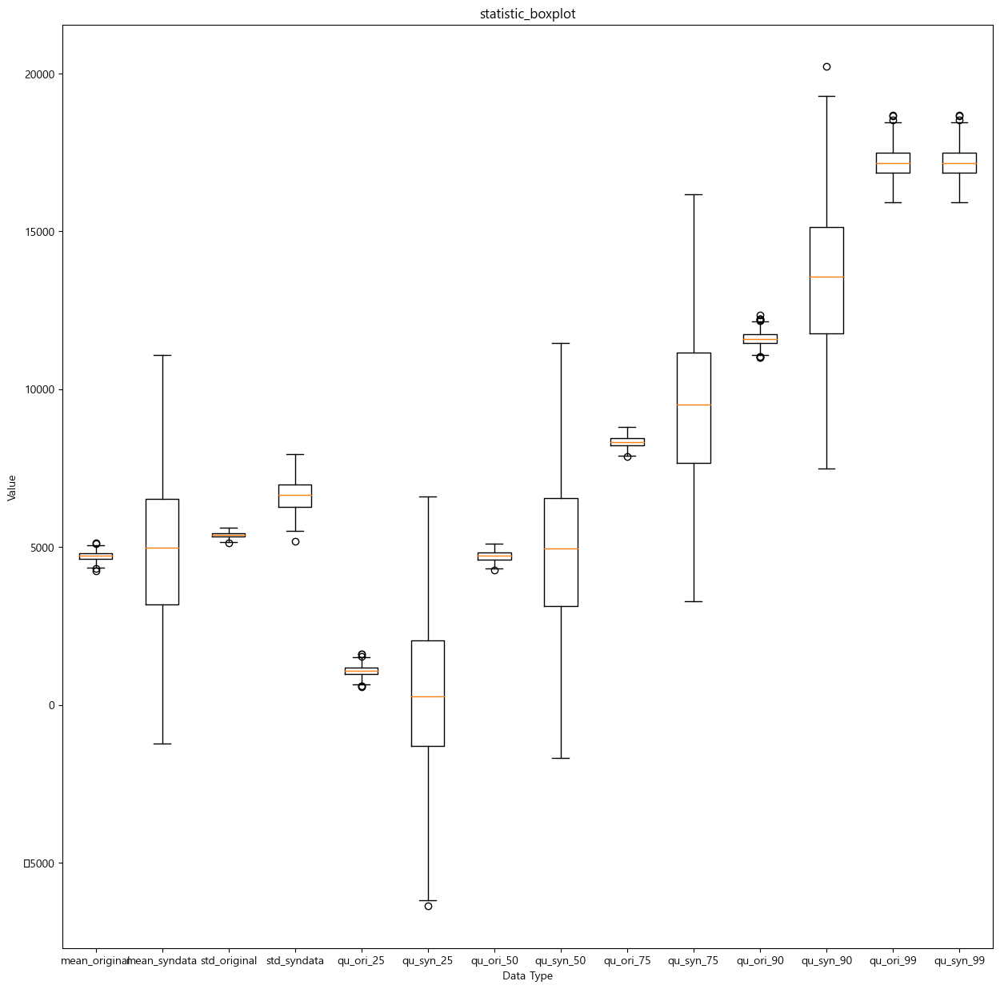

In [114]:
all_boxplot(non_result1)

#### $\rho$ = 0.3

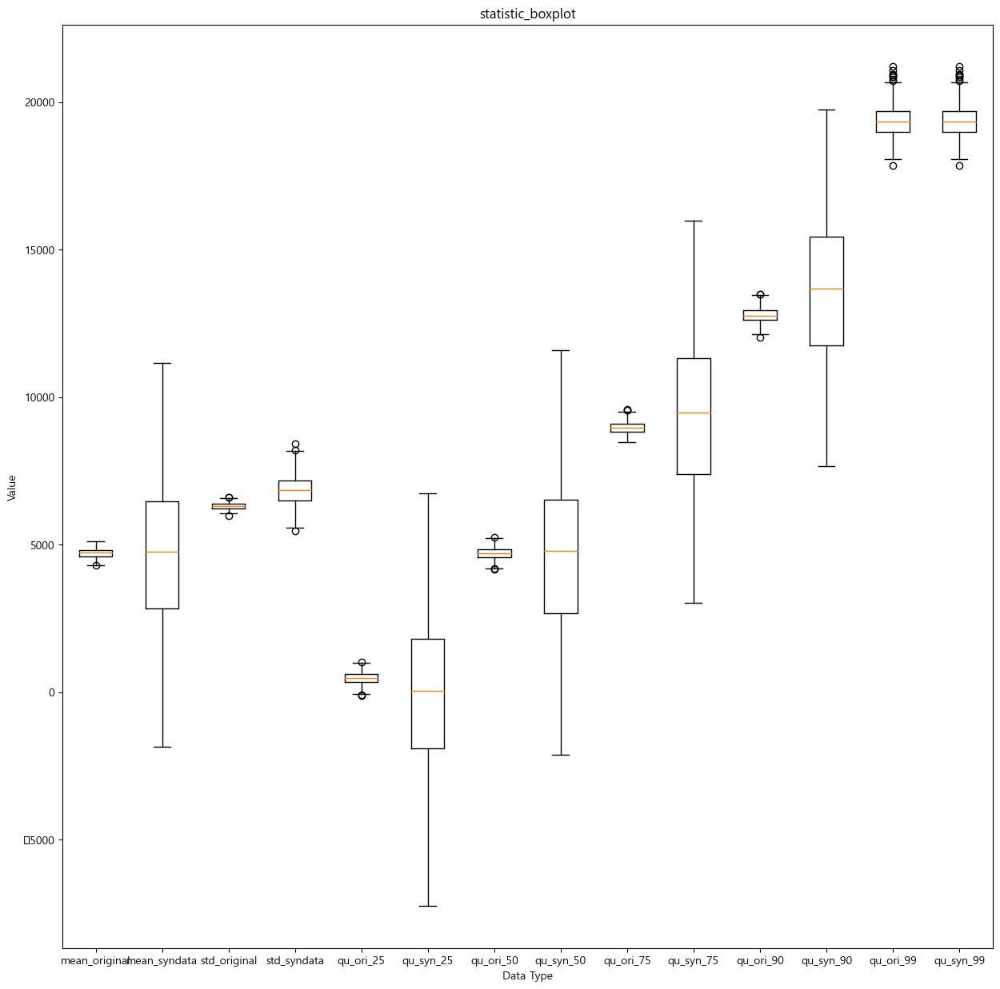

In [115]:
all_boxplot(non_result2)

#### $\rho$ = 0.5

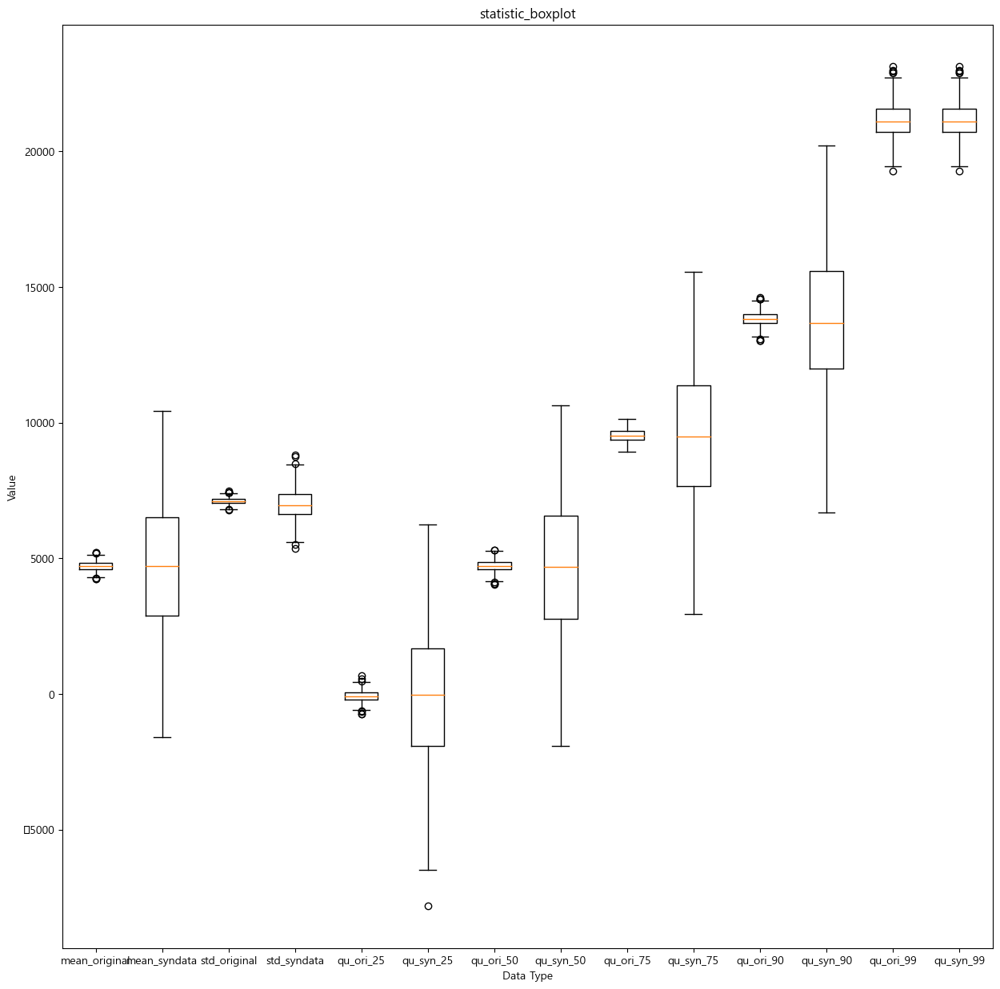

In [116]:
all_boxplot(non_result3)

#### $\rho$ = 0.7

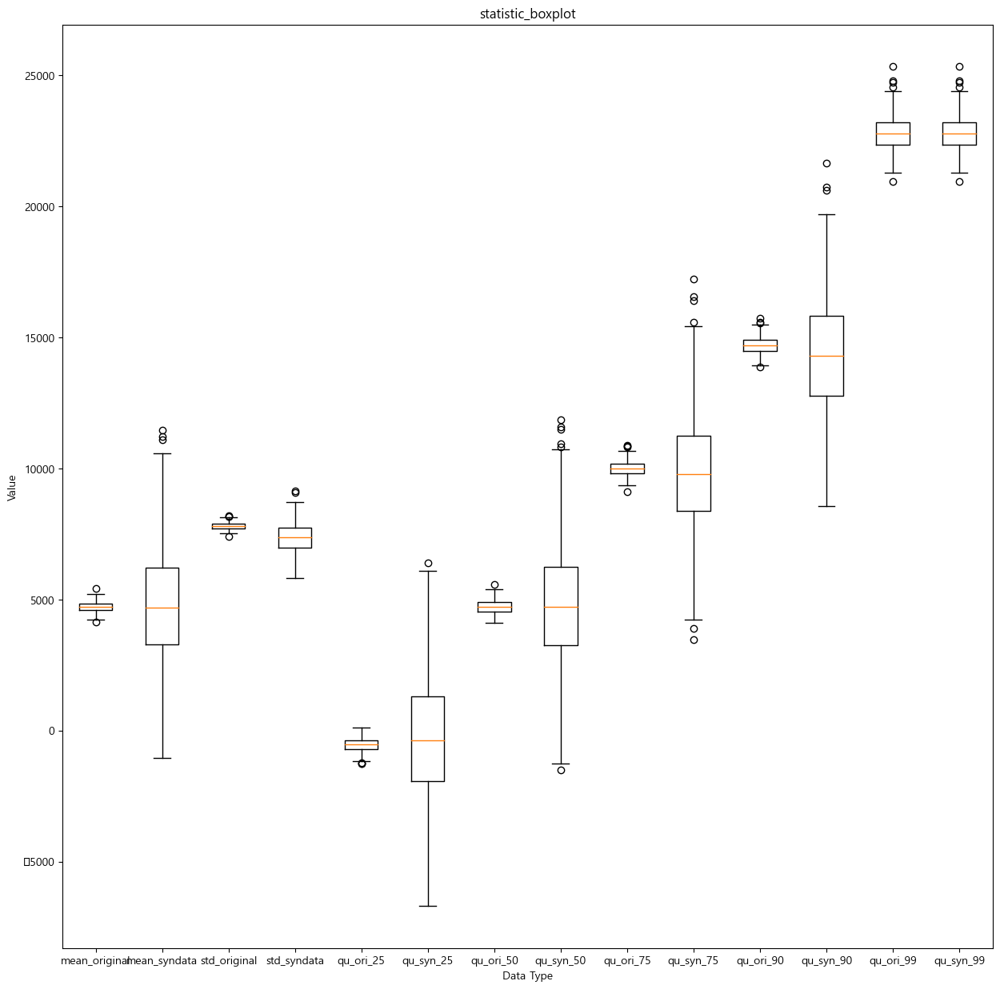

In [117]:
all_boxplot(non_result4)

#### $\rho$ = 0.9

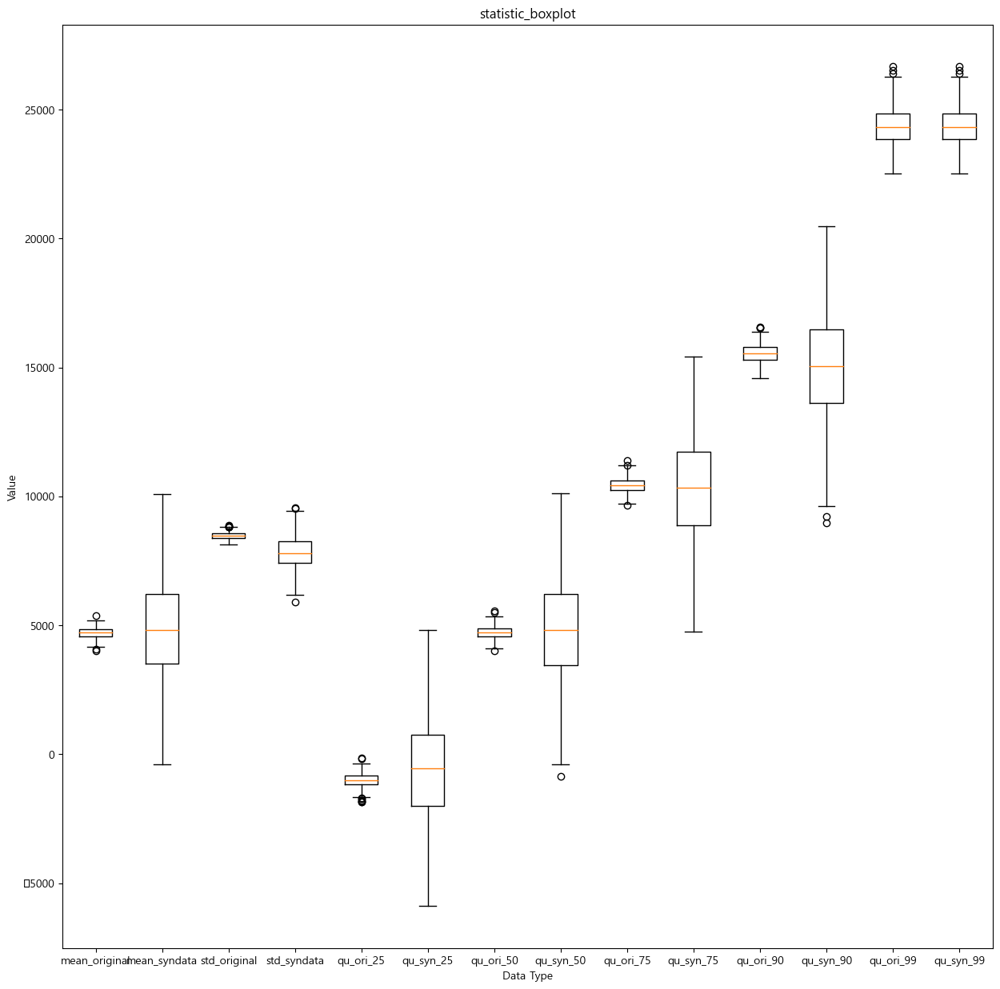

In [118]:
all_boxplot(non_result5)

### 경상소득이 포함된 자료에 대한 상자그림

#### $\rho$ = 0.1

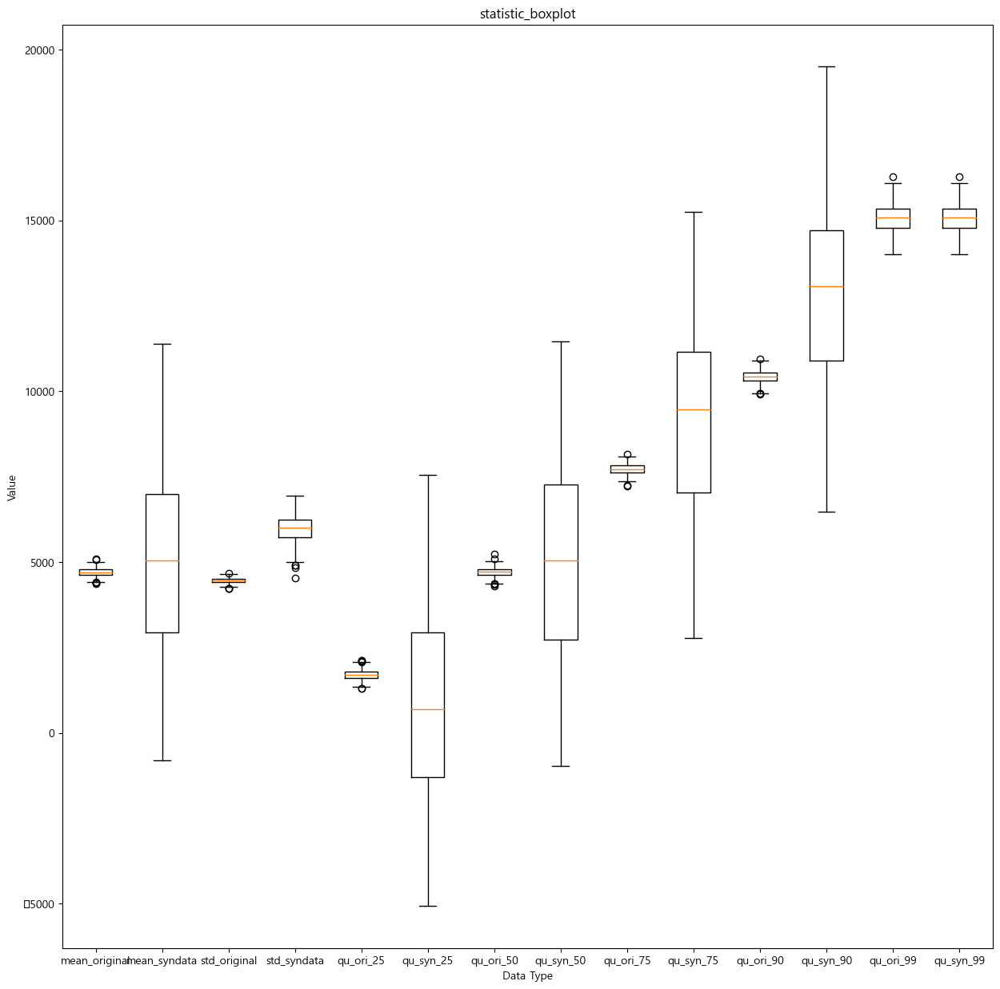

In [119]:
all_boxplot(all_result1)

#### $\rho$ = 0.3

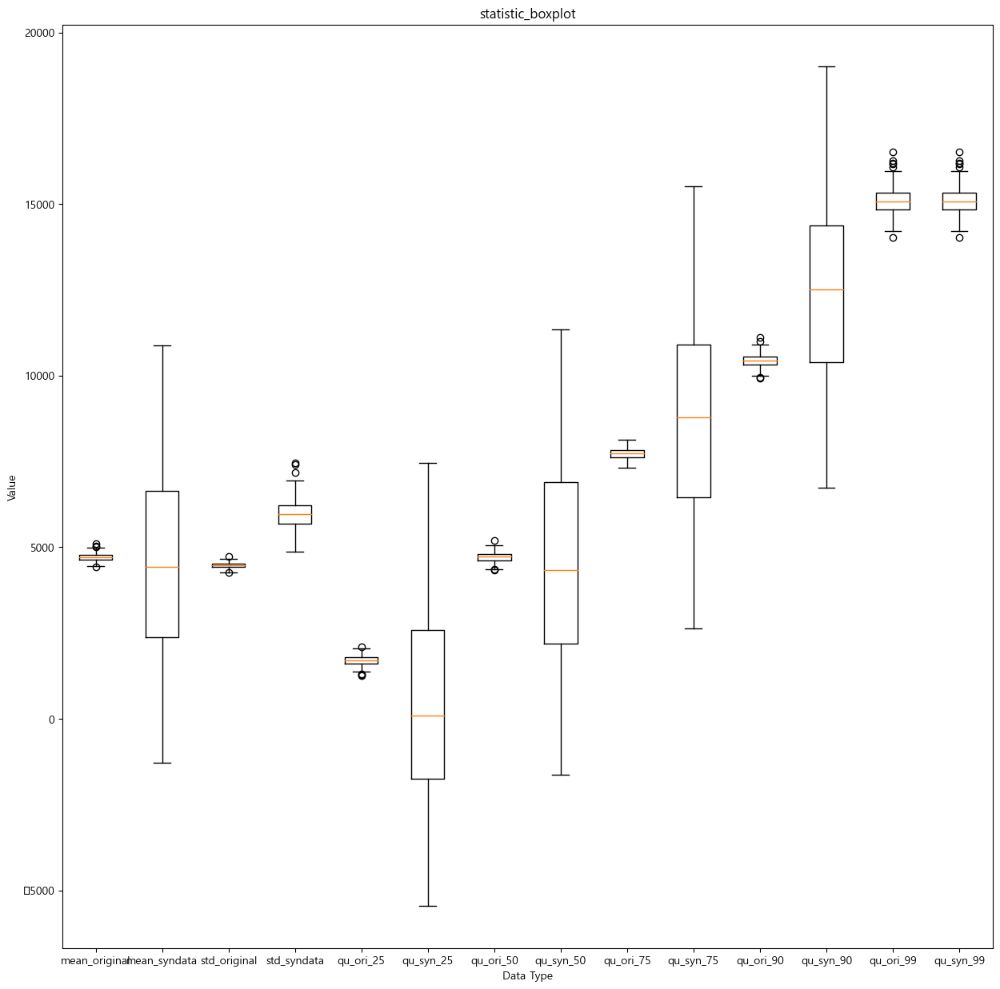

In [120]:
all_boxplot(all_result2)

#### $\rho$ = 0.5

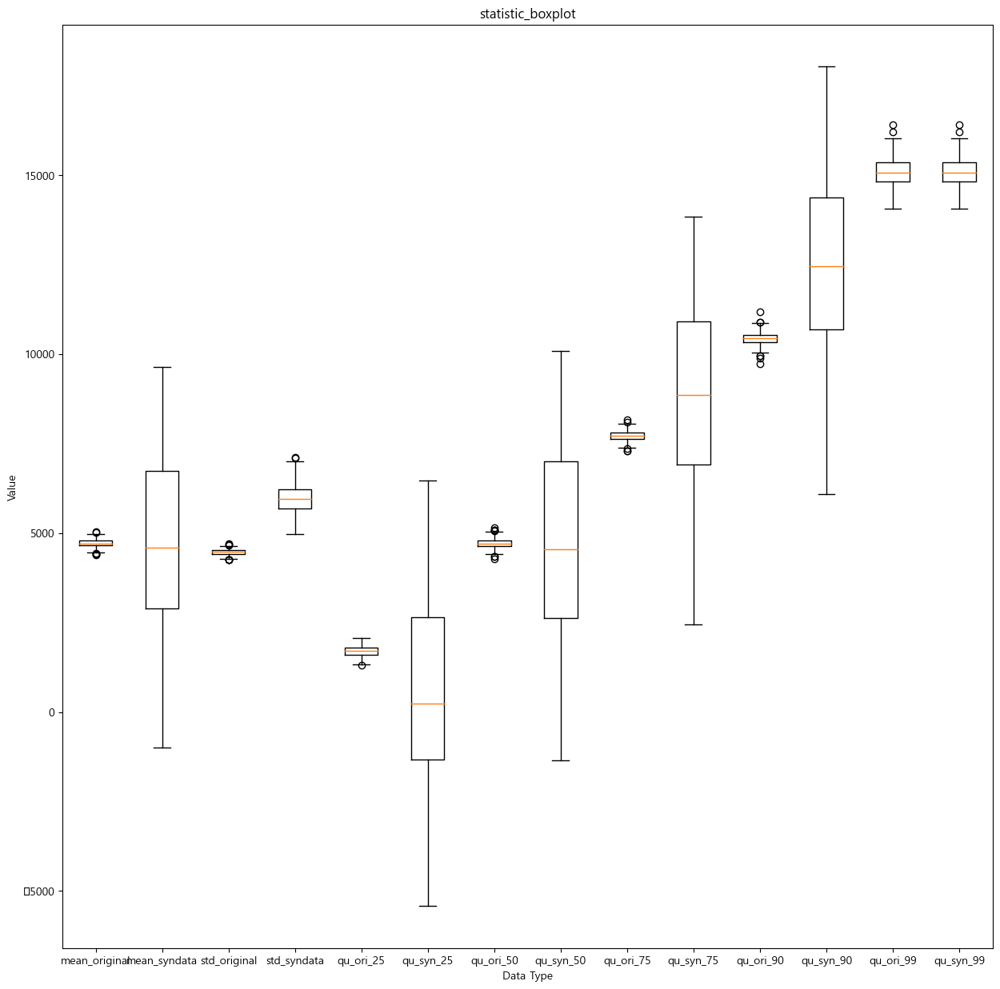

In [121]:
all_boxplot(all_result3)

#### $\rho$ = 0.7

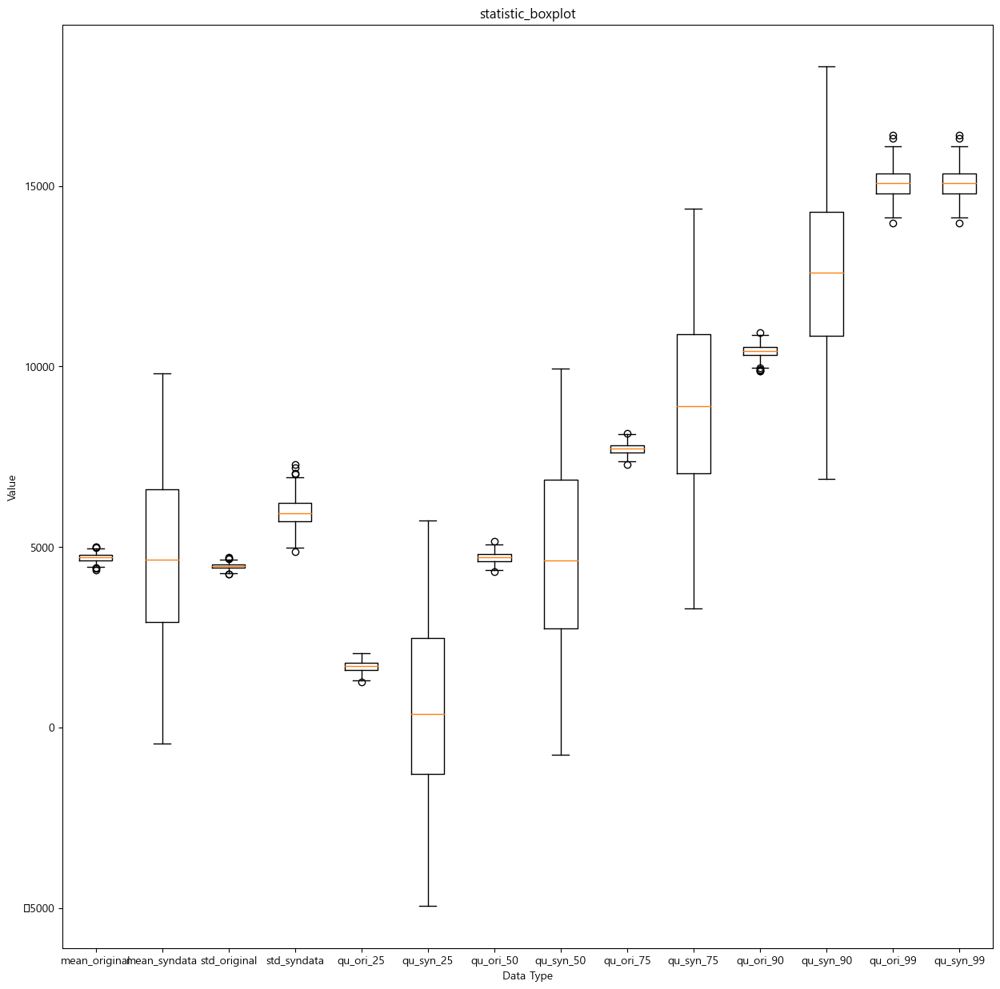

In [122]:
all_boxplot(all_result4)

#### $\rho$ = 0.9

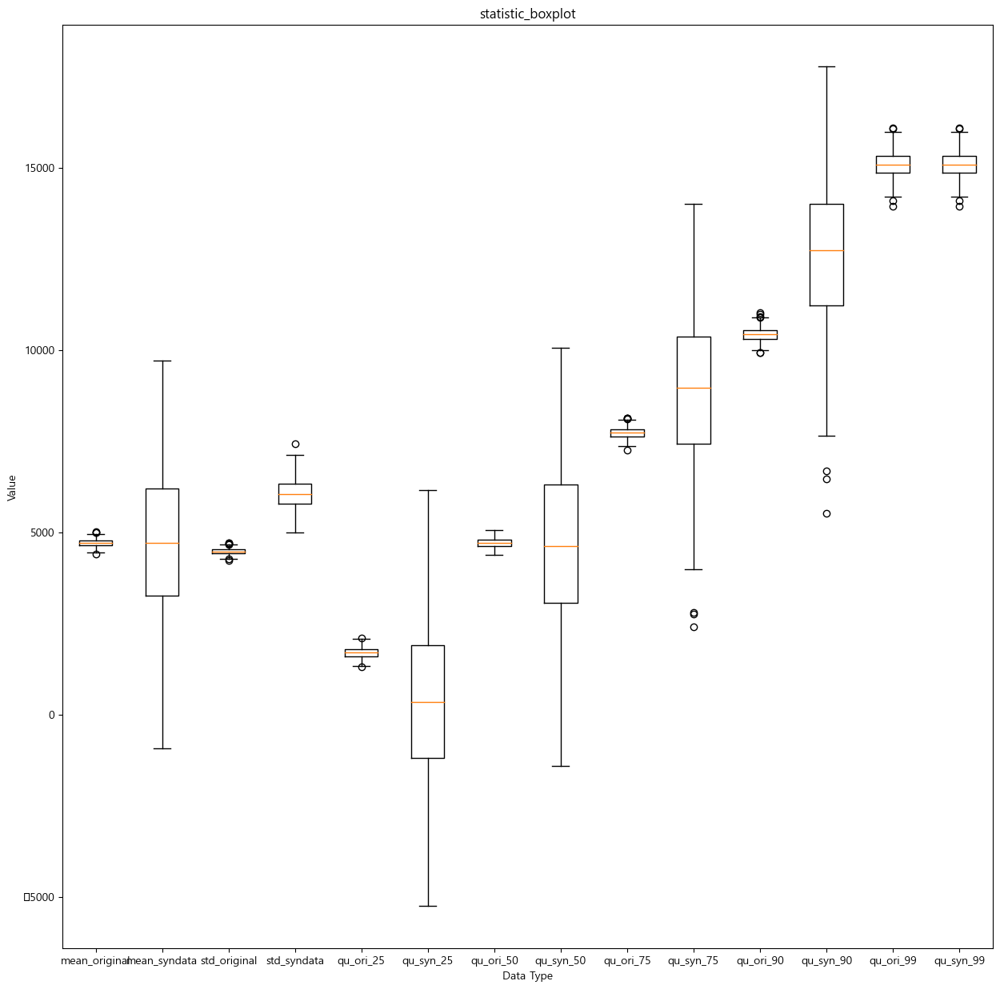

In [123]:
all_boxplot(all_result5)

In [129]:
def scatterplot(data , syn_data , variable1 , variable2) : 

    plt.rcParams["figure.figsize"] = (20,20)
    plt.rcParams['font.size'] = 10

    plt.subplot(1,2,1)
    plt.scatter(data[0][variable1] , data[0][variable2] , color = 'purple' , alpha = 0.3 , label = '원자료')
    plt.xlabel(variable1)
    plt.ylabel(variable2)
    plt.xlim([-150000, 300000])    
    plt.legend()

    plt.subplot(1,2,2)
    plt.scatter(syn_data[0][variable1] , syn_data[0][variable2] , color = 'purple' , alpha = 0.3 , label = '재현자료')
    plt.xlabel(variable1)
    plt.ylabel(variable2)
    plt.xlim([-150000, 300000])      
    plt.legend()

# 경상소득이 포함되지 않은 자료

## $\rho = 0.1$에 대하여 첫번째 자료를 이용한 비교

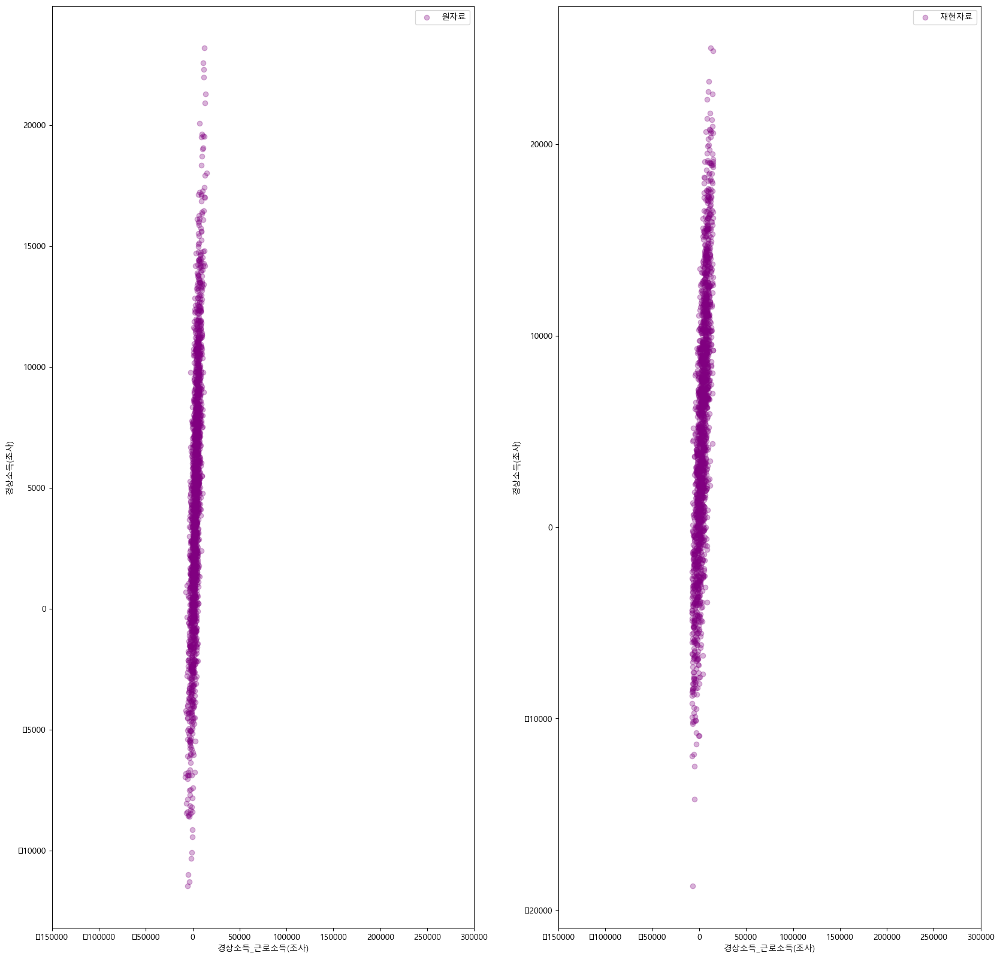

In [130]:
scatterplot(non_rho1_mvn , ori_non_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

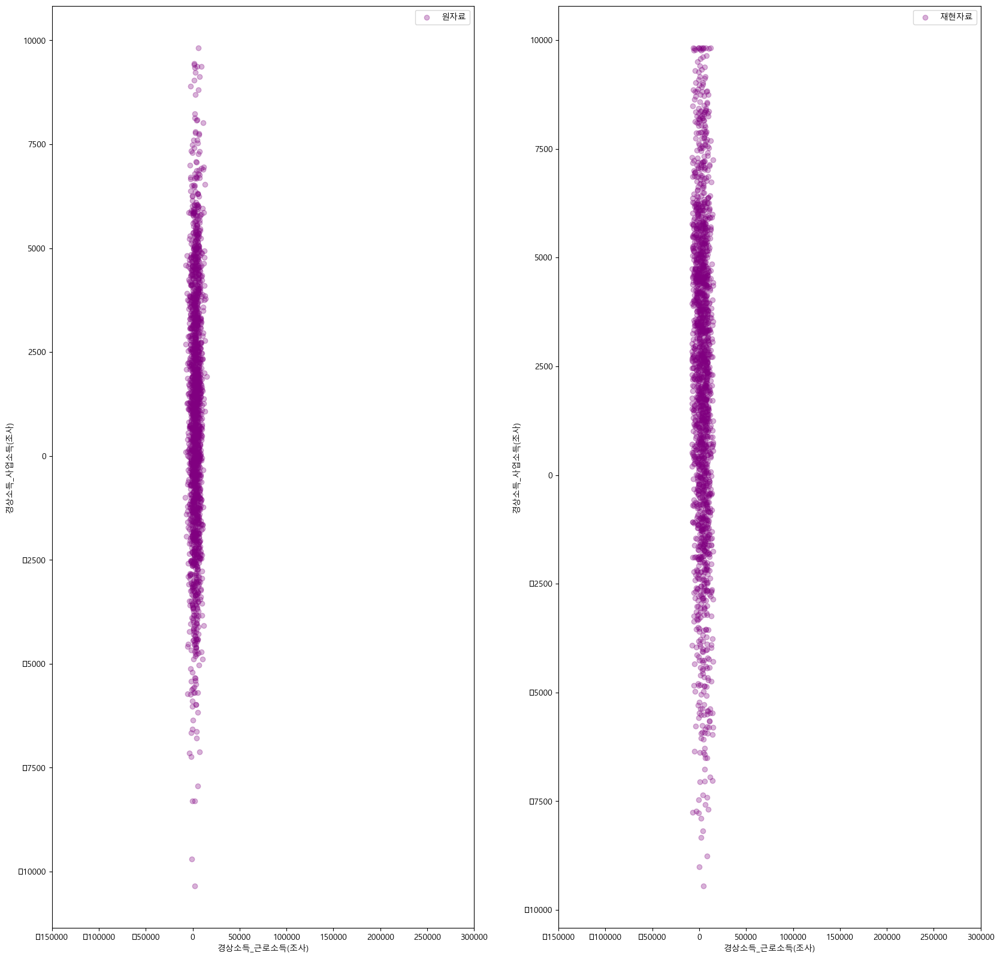

In [131]:
scatterplot(non_rho1_mvn , ori_non_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

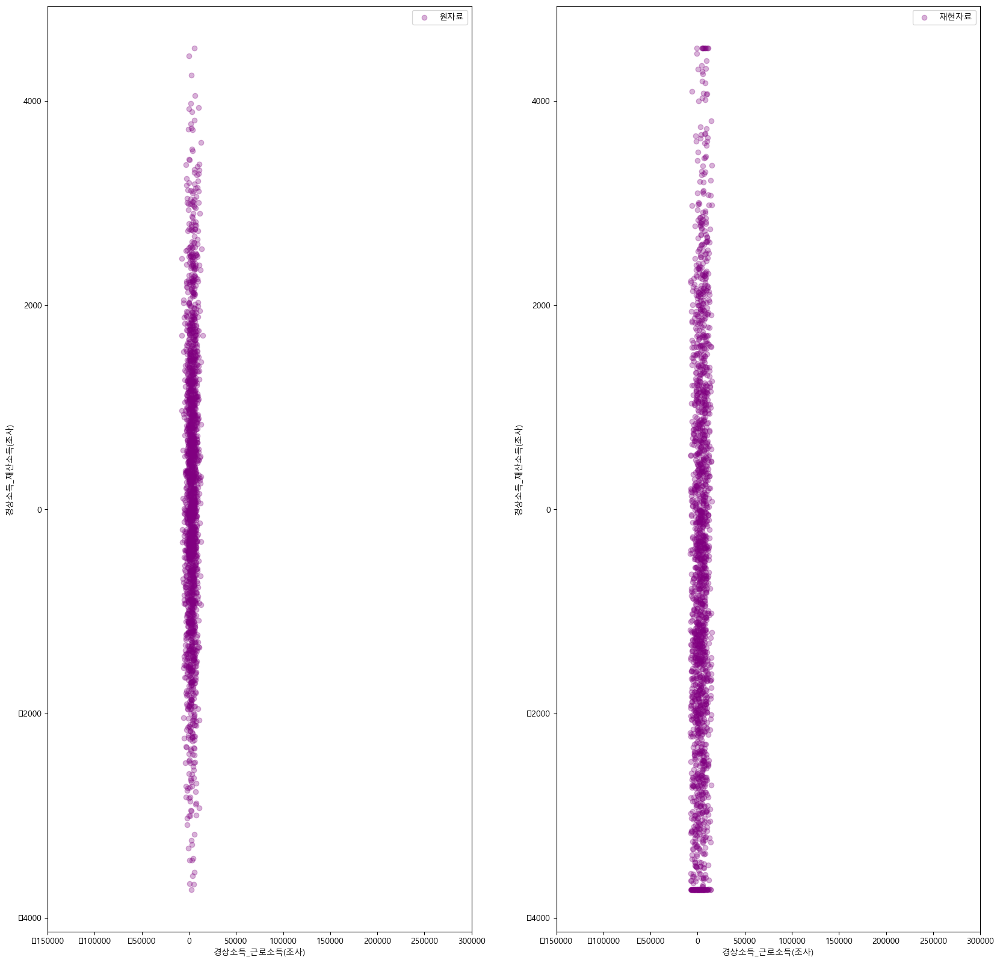

In [132]:
scatterplot(non_rho1_mvn , ori_non_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

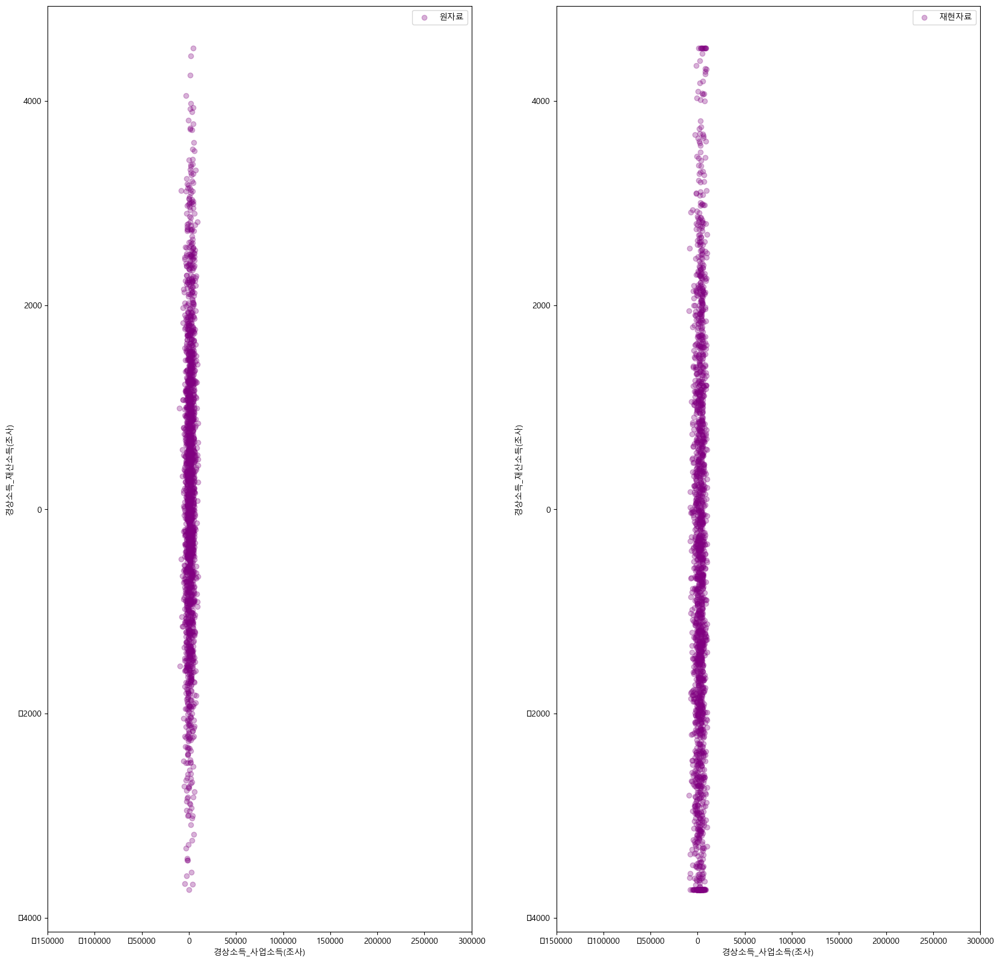

In [134]:
scatterplot(non_rho1_mvn , ori_non_rho1_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

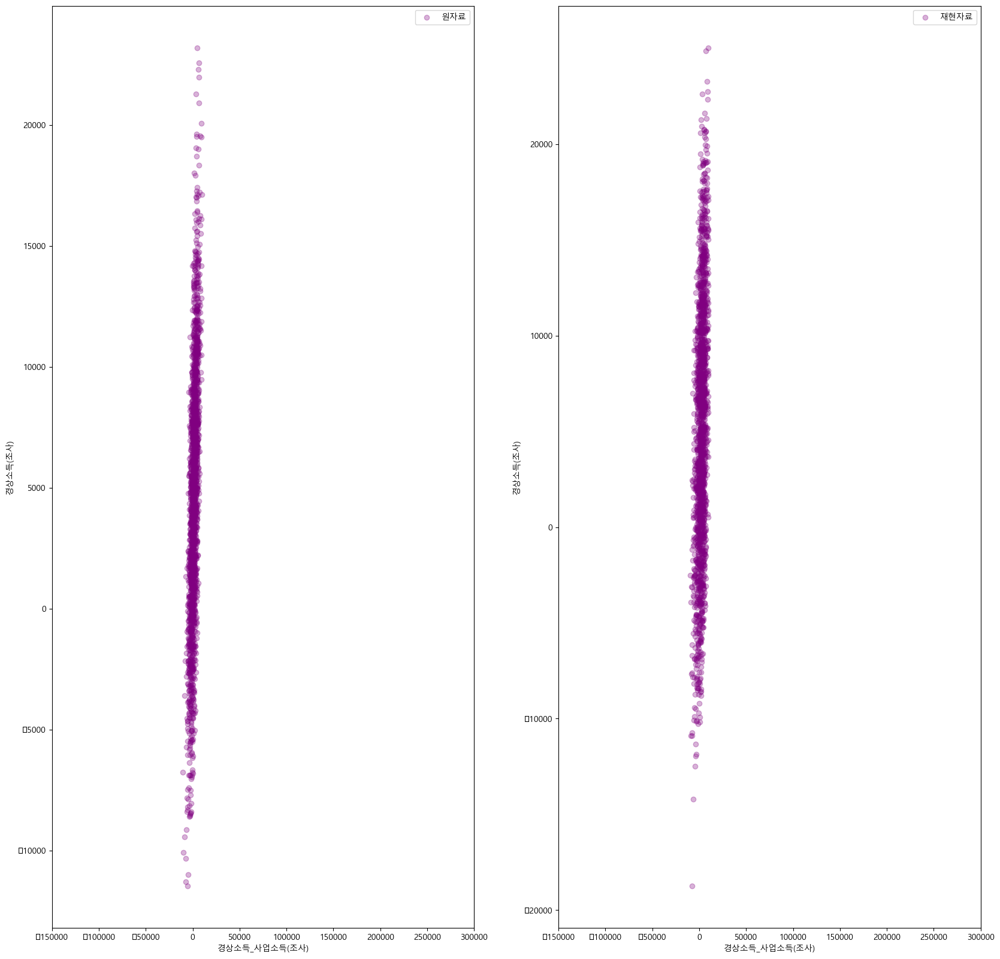

In [135]:
scatterplot(non_rho1_mvn , ori_non_rho1_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.3$에 대하여 첫번째 자료를 이용한 비교

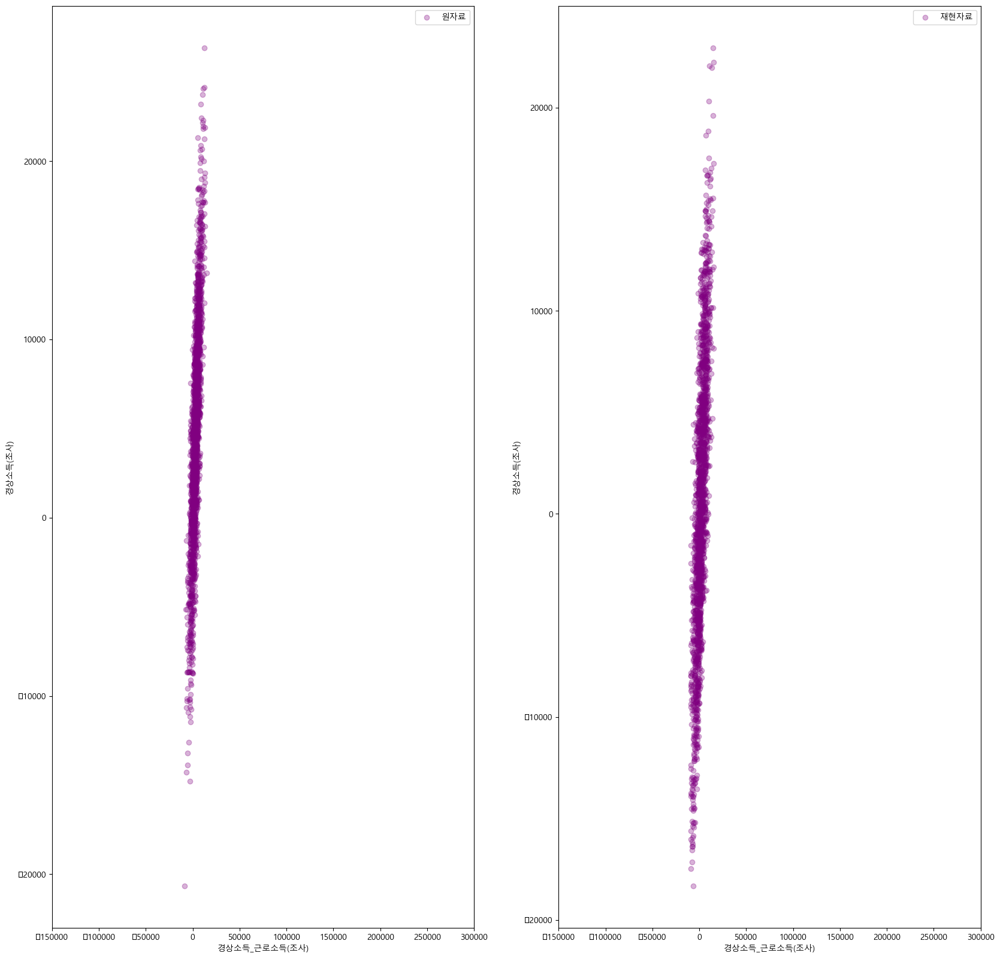

In [136]:
scatterplot(non_rho2_mvn , ori_non_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

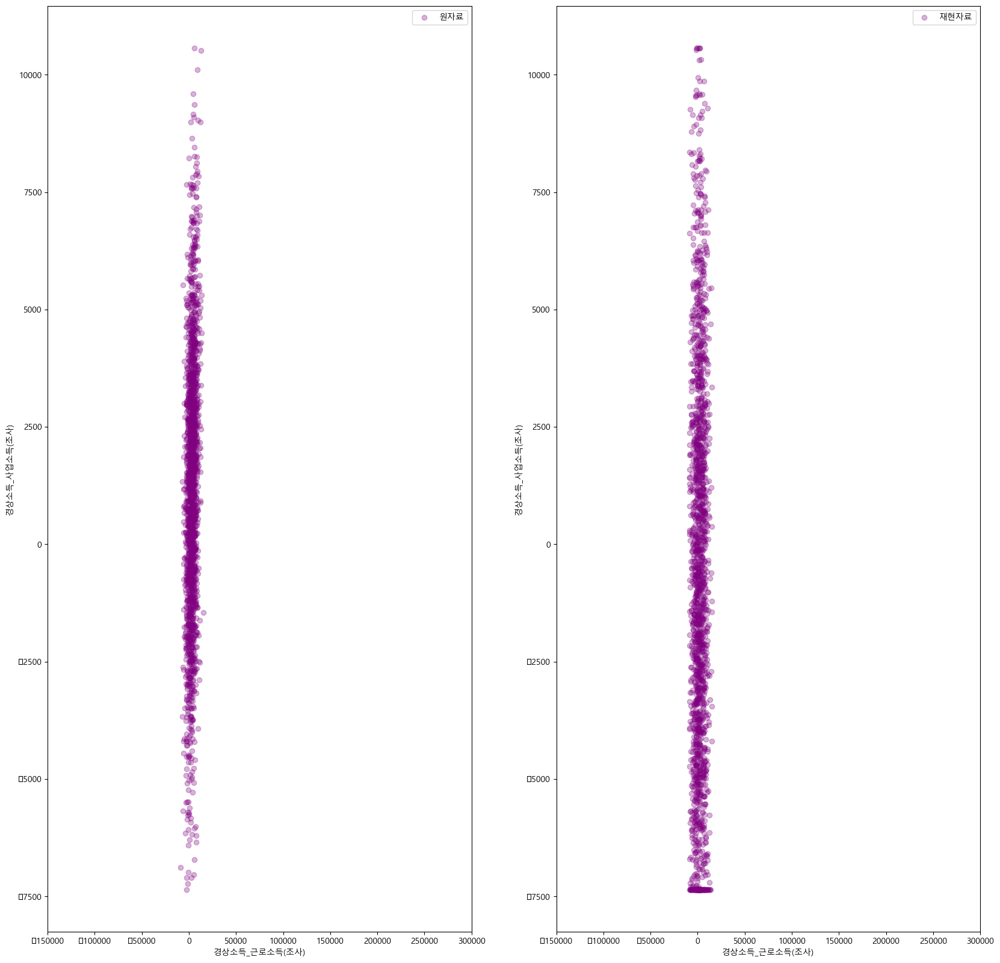

In [137]:
scatterplot(non_rho2_mvn , ori_non_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

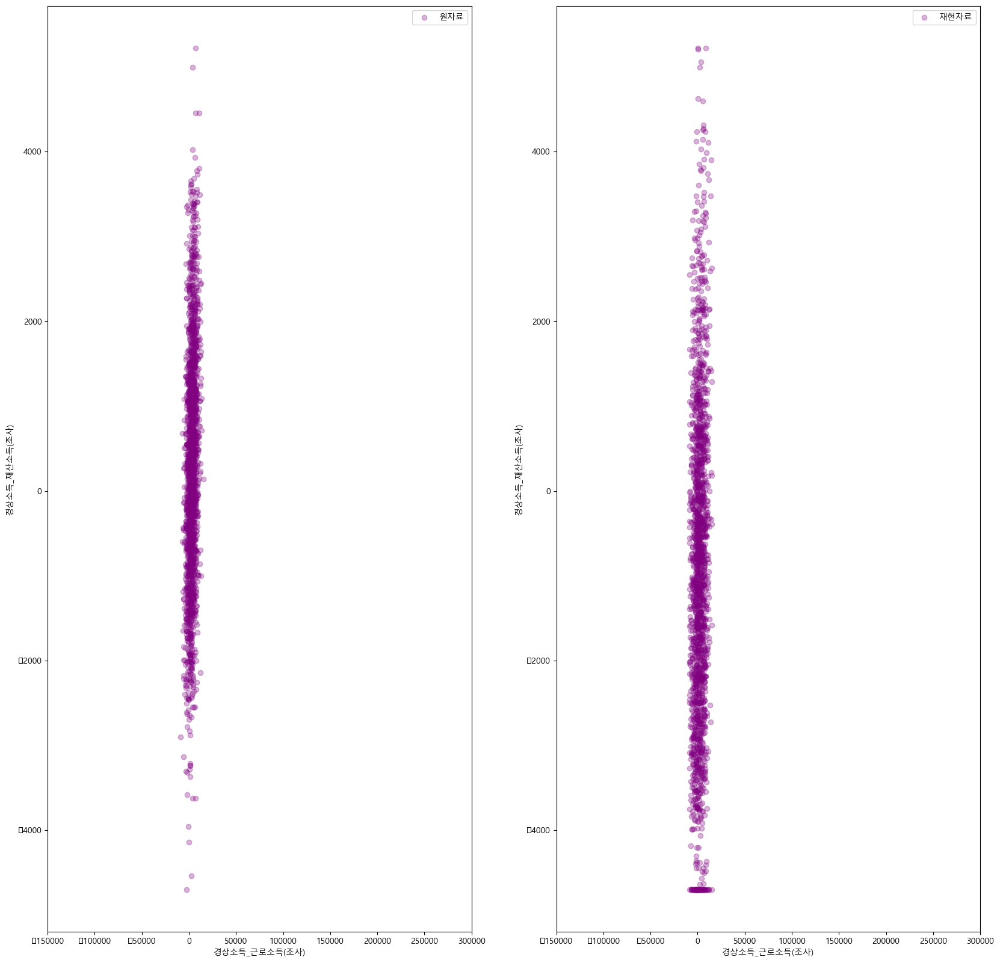

In [138]:
scatterplot(non_rho2_mvn , ori_non_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

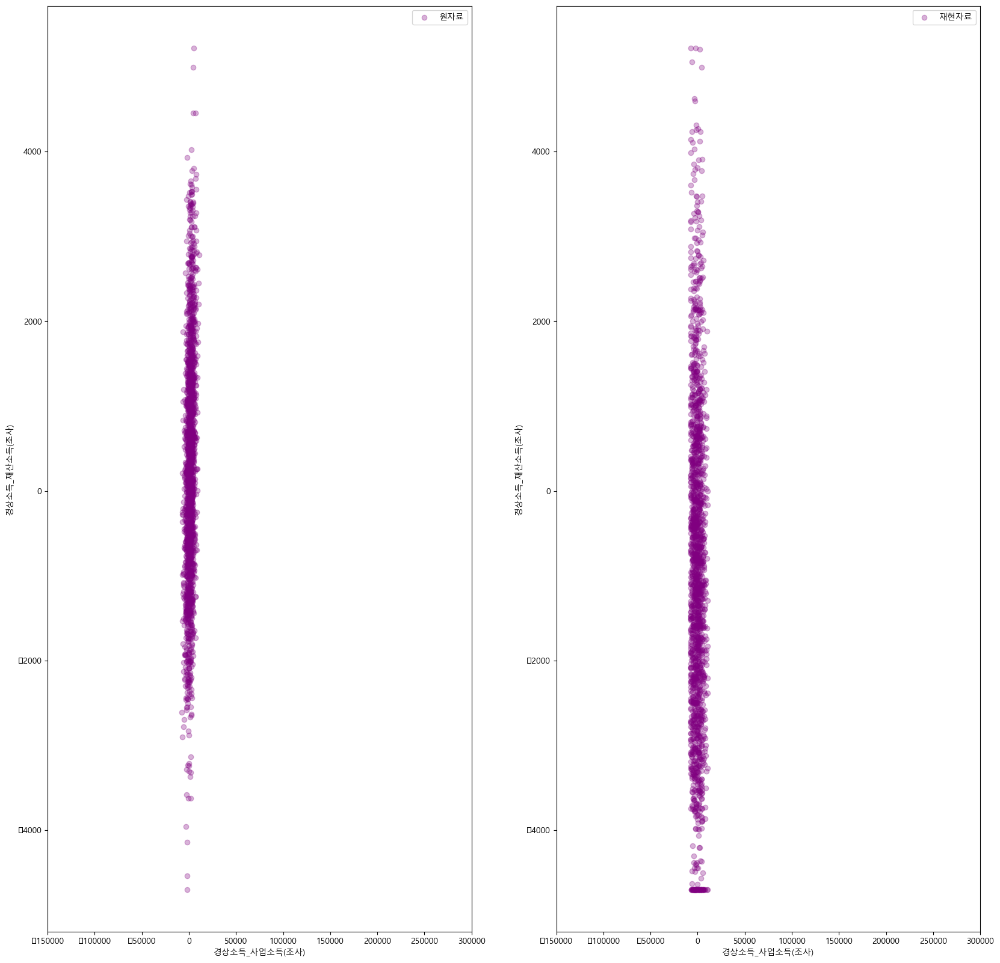

In [139]:
scatterplot(non_rho2_mvn , ori_non_rho2_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

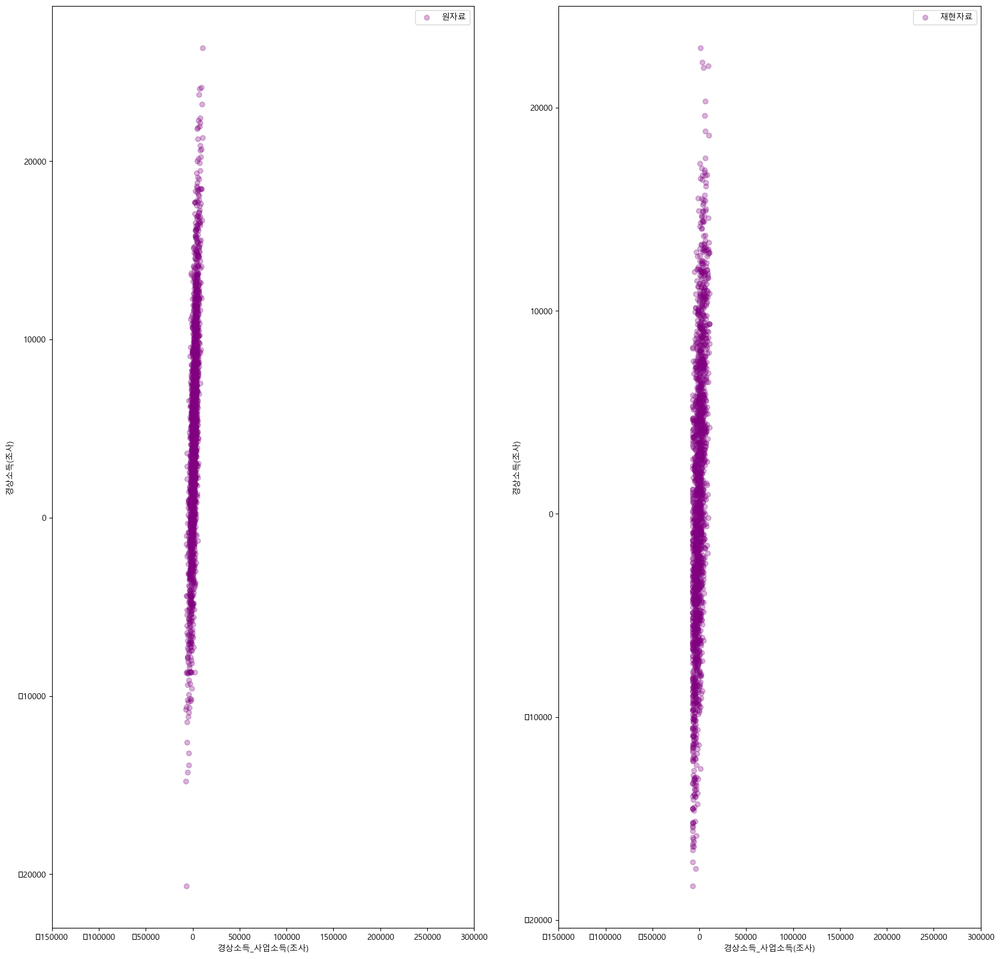

In [140]:
scatterplot(non_rho2_mvn , ori_non_rho2_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.5$에 대하여 첫번째 자료를 이용한 비교

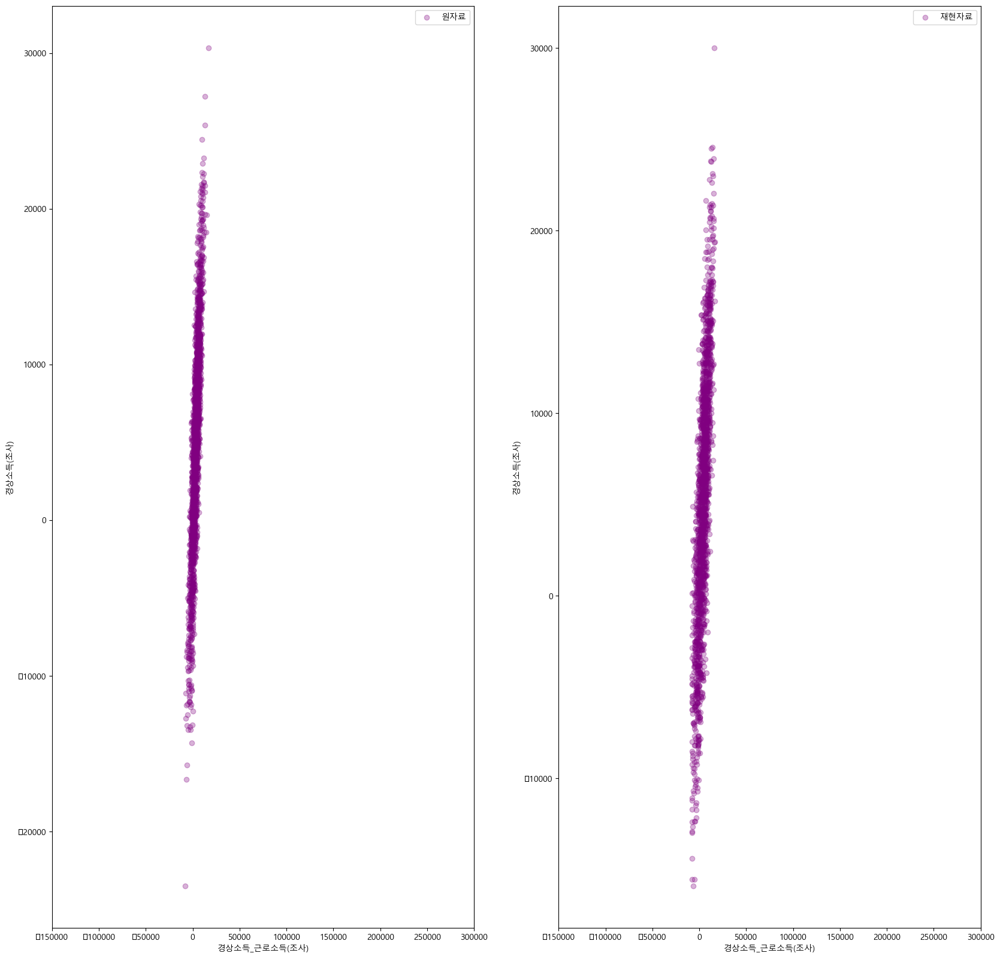

In [141]:
scatterplot(non_rho3_mvn , ori_non_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

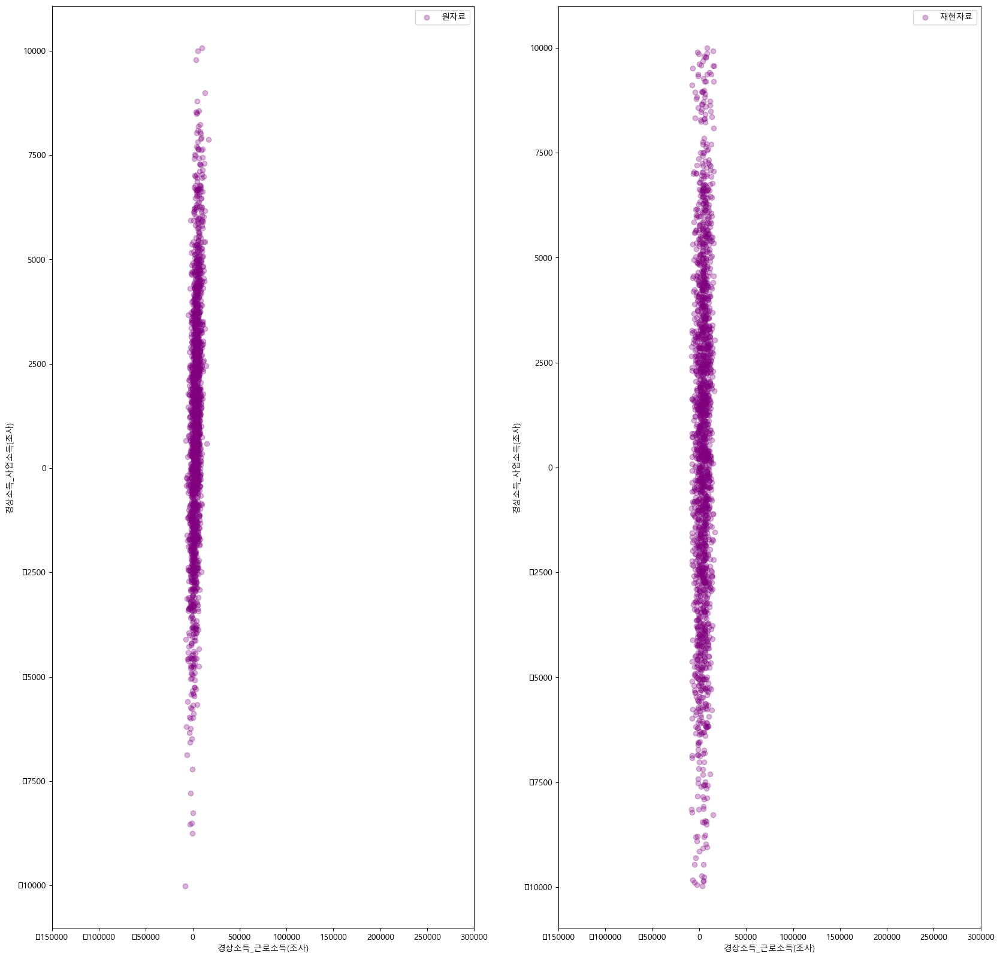

In [142]:
scatterplot(non_rho3_mvn , ori_non_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

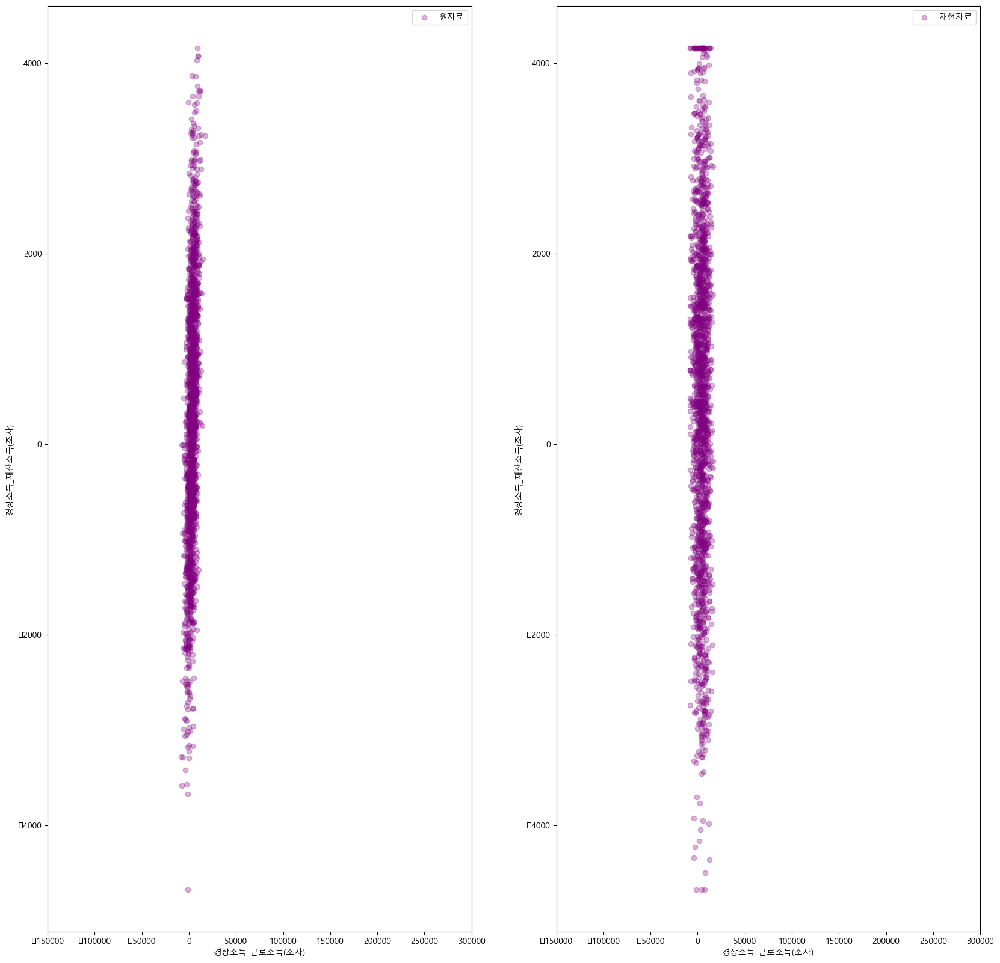

In [143]:
scatterplot(non_rho3_mvn , ori_non_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

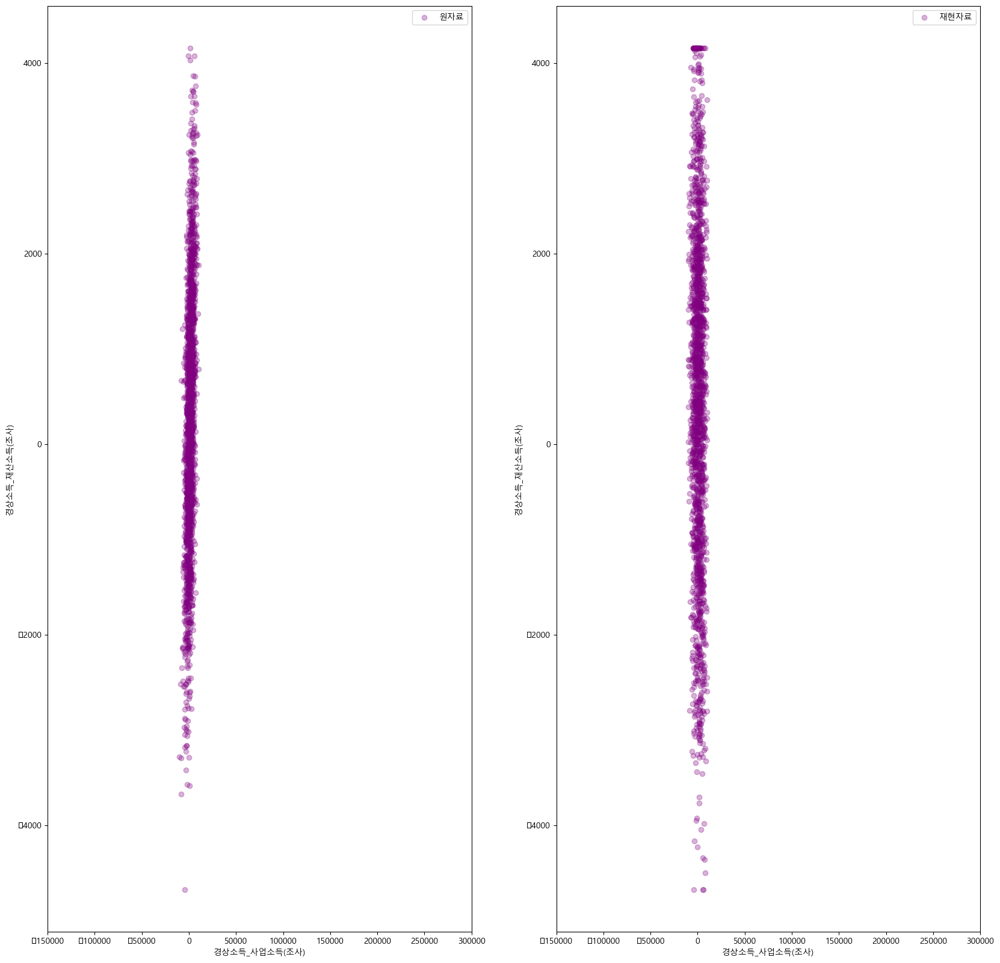

In [144]:
scatterplot(non_rho3_mvn , ori_non_rho3_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

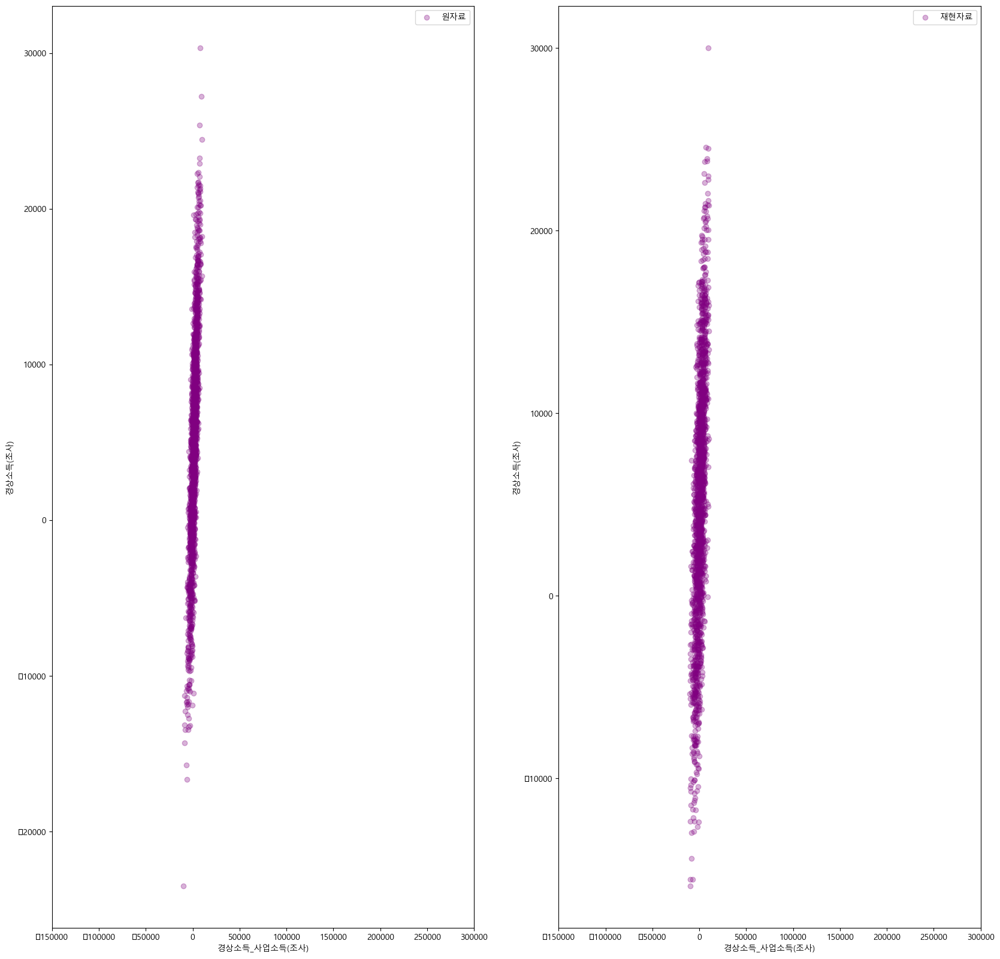

In [145]:
scatterplot(non_rho3_mvn , ori_non_rho3_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.7$에 대하여 첫번째 자료를 이용한 비교

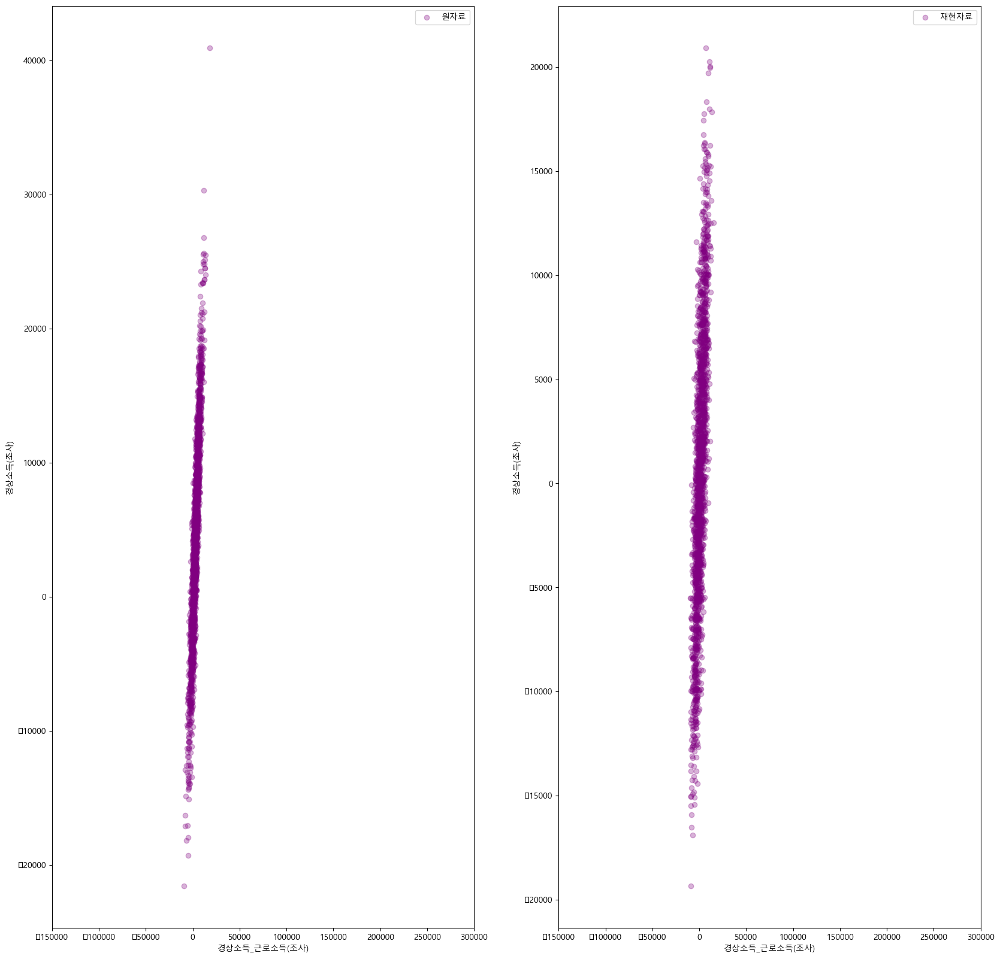

In [146]:
scatterplot(non_rho4_mvn , ori_non_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

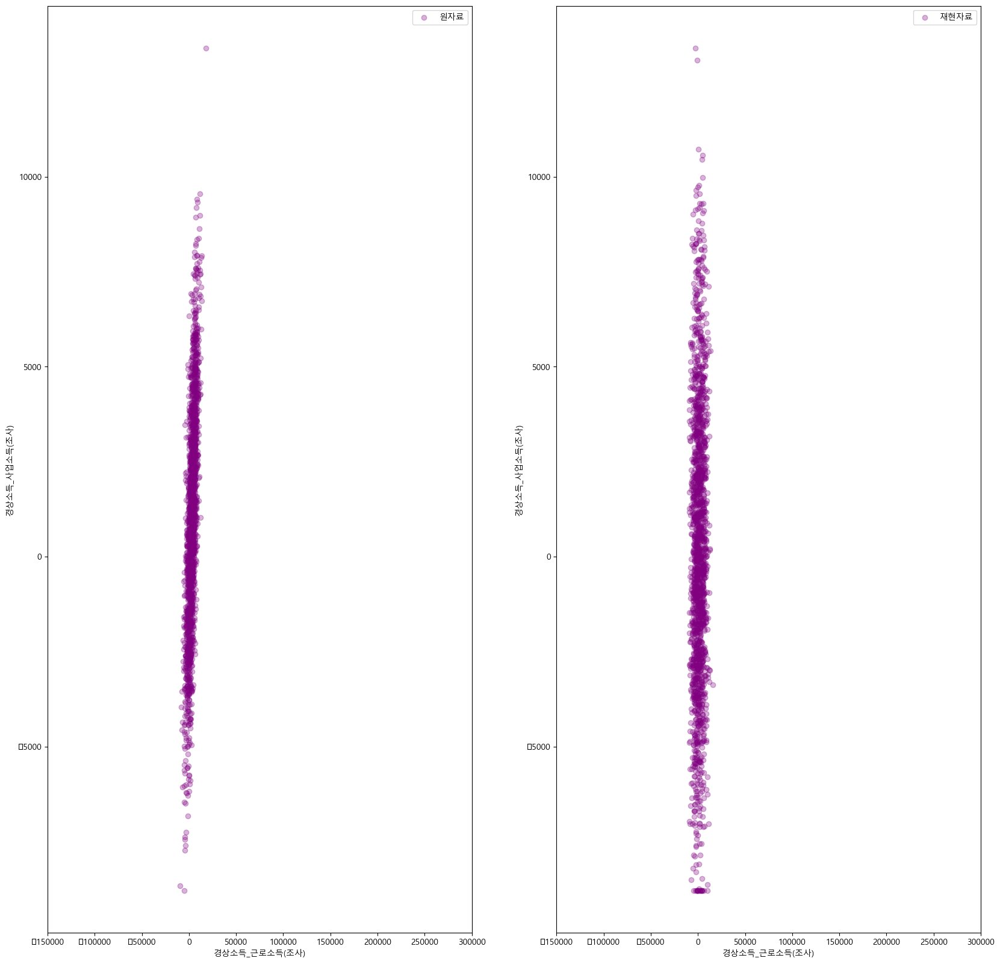

In [147]:
scatterplot(non_rho4_mvn , ori_non_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

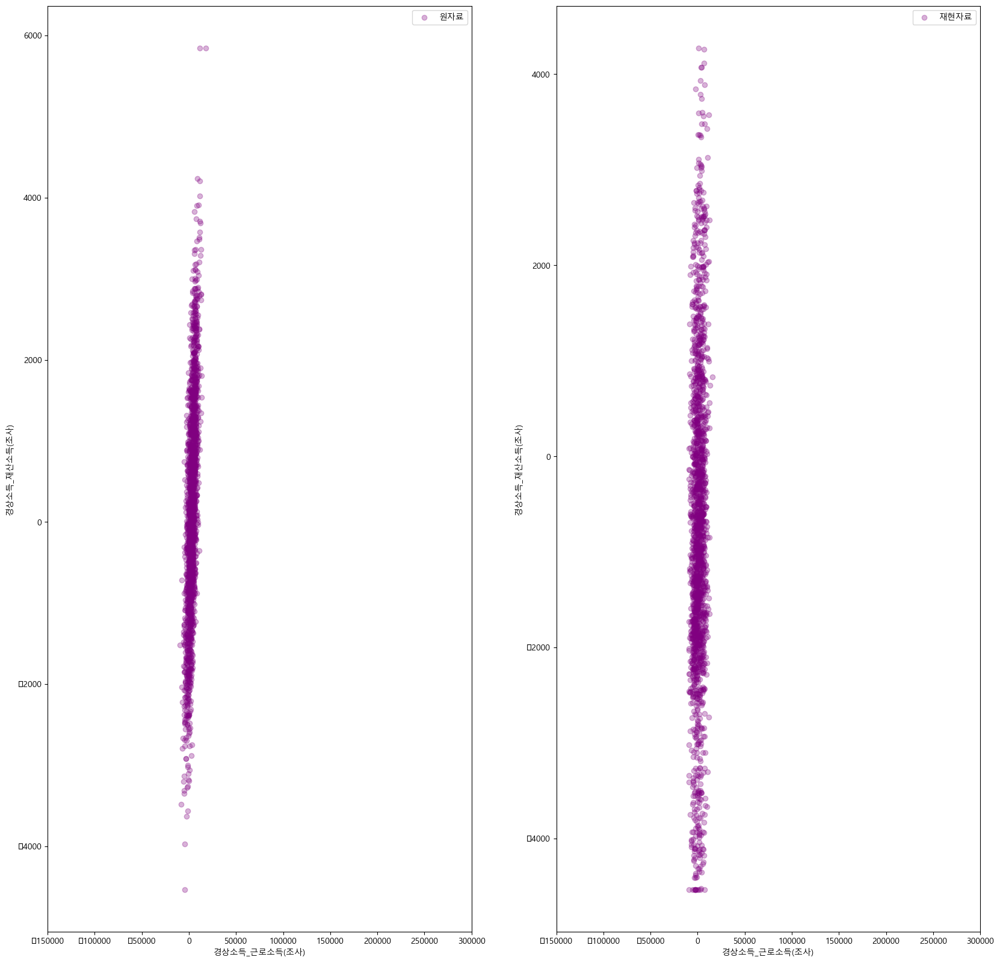

In [148]:
scatterplot(non_rho4_mvn , ori_non_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

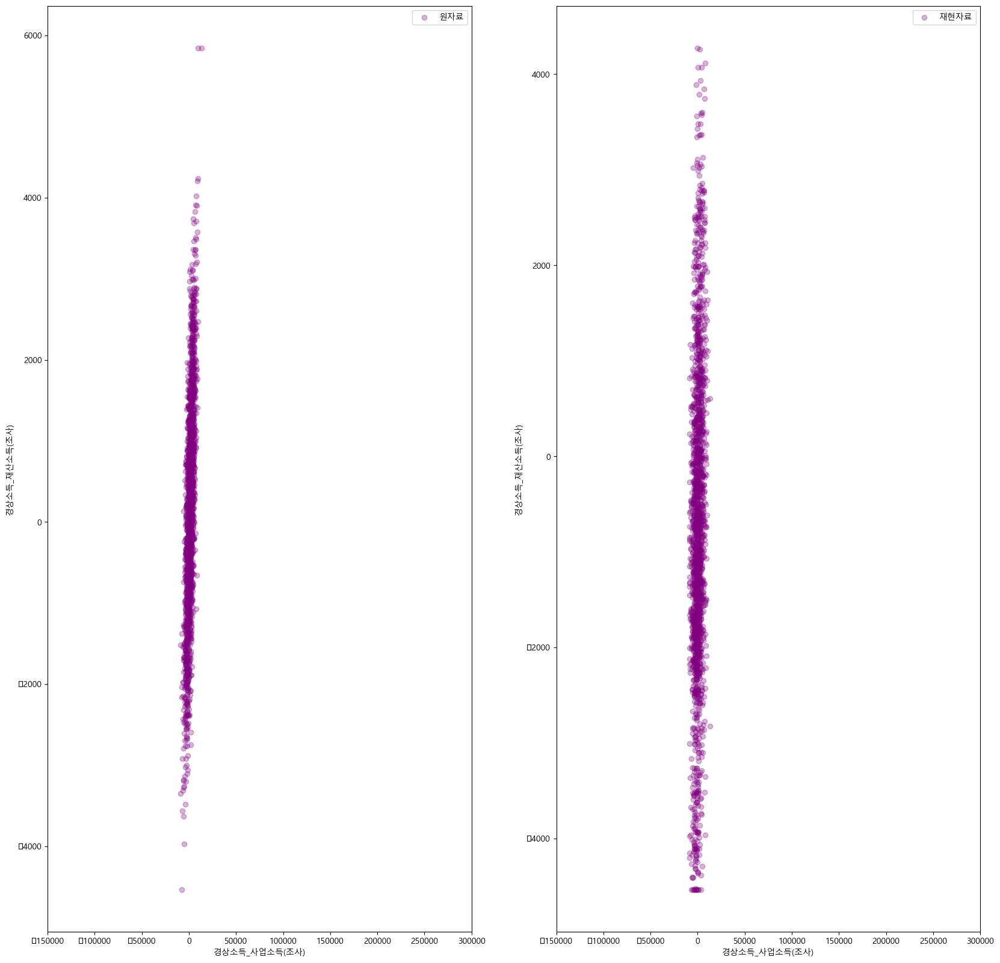

In [149]:
scatterplot(non_rho4_mvn , ori_non_rho4_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

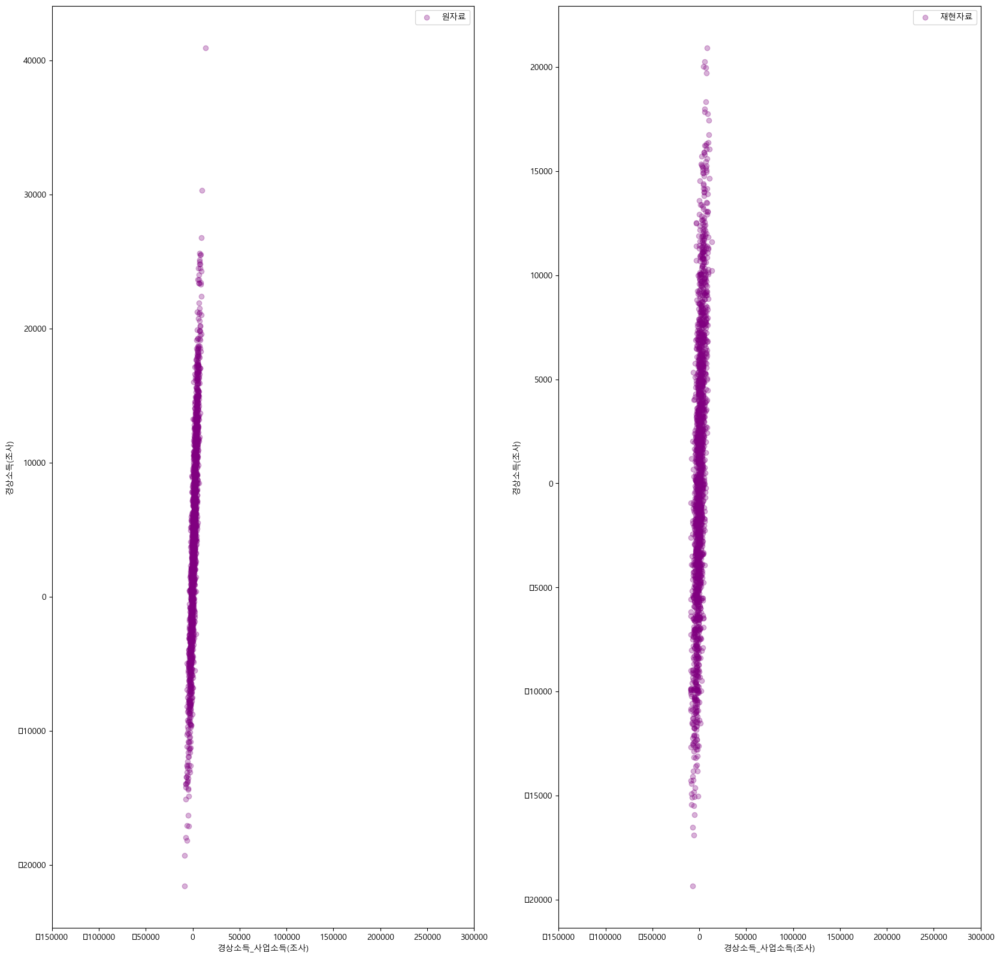

In [150]:
scatterplot(non_rho4_mvn , ori_non_rho4_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.9$에 대하여 첫번째 자료를 이용한 비교

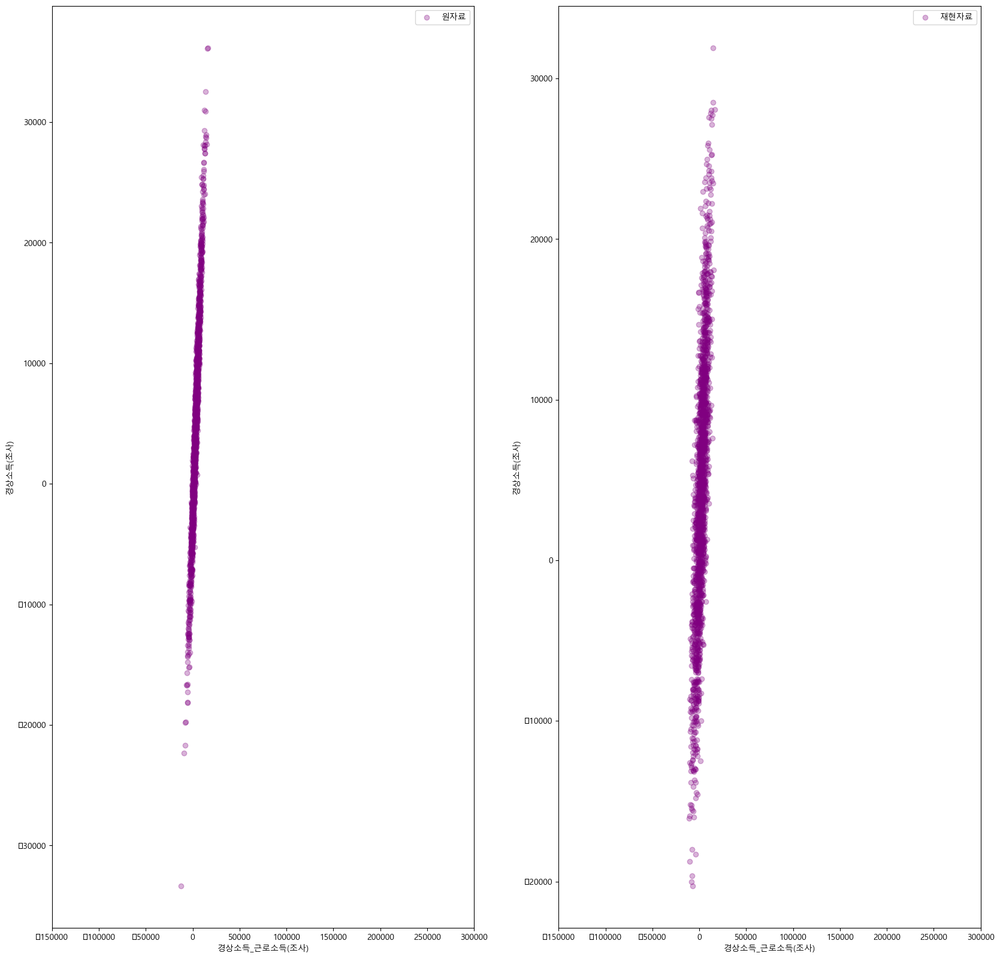

In [151]:
scatterplot(non_rho5_mvn , ori_non_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

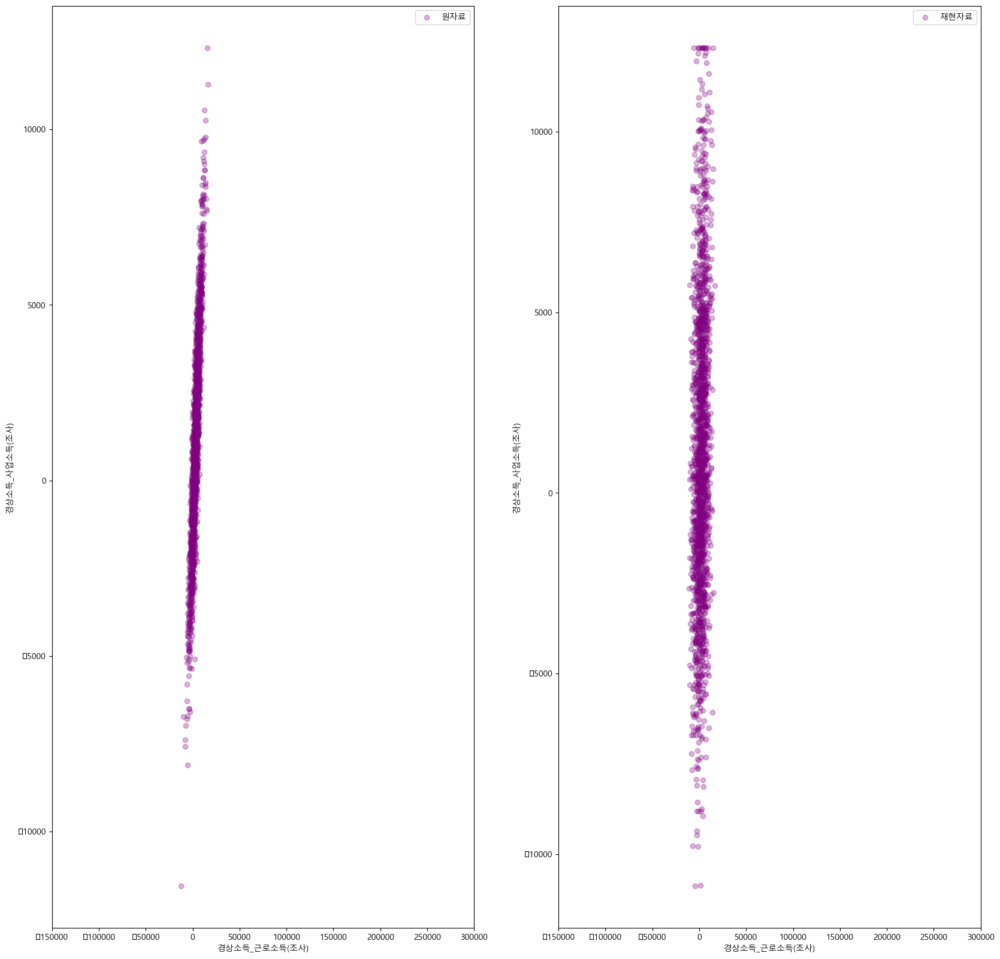

In [154]:
scatterplot(non_rho5_mvn , ori_non_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

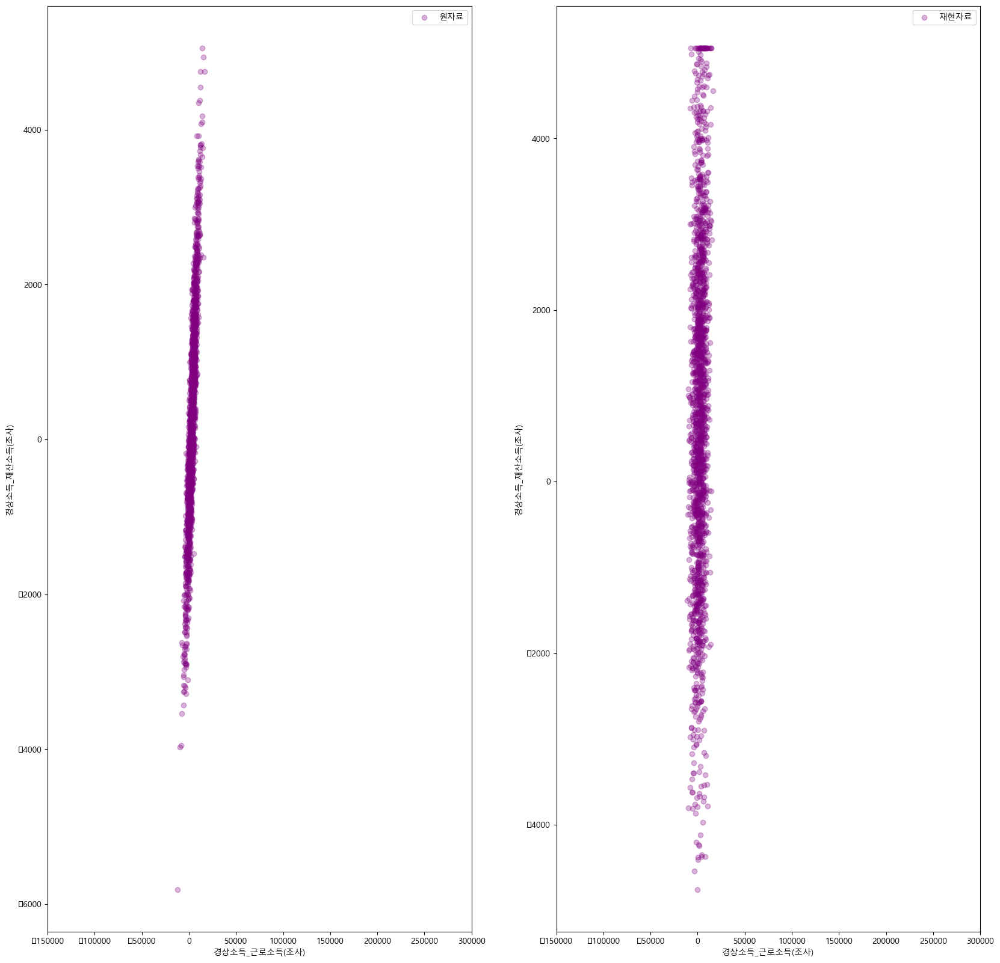

In [153]:
scatterplot(non_rho5_mvn , ori_non_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

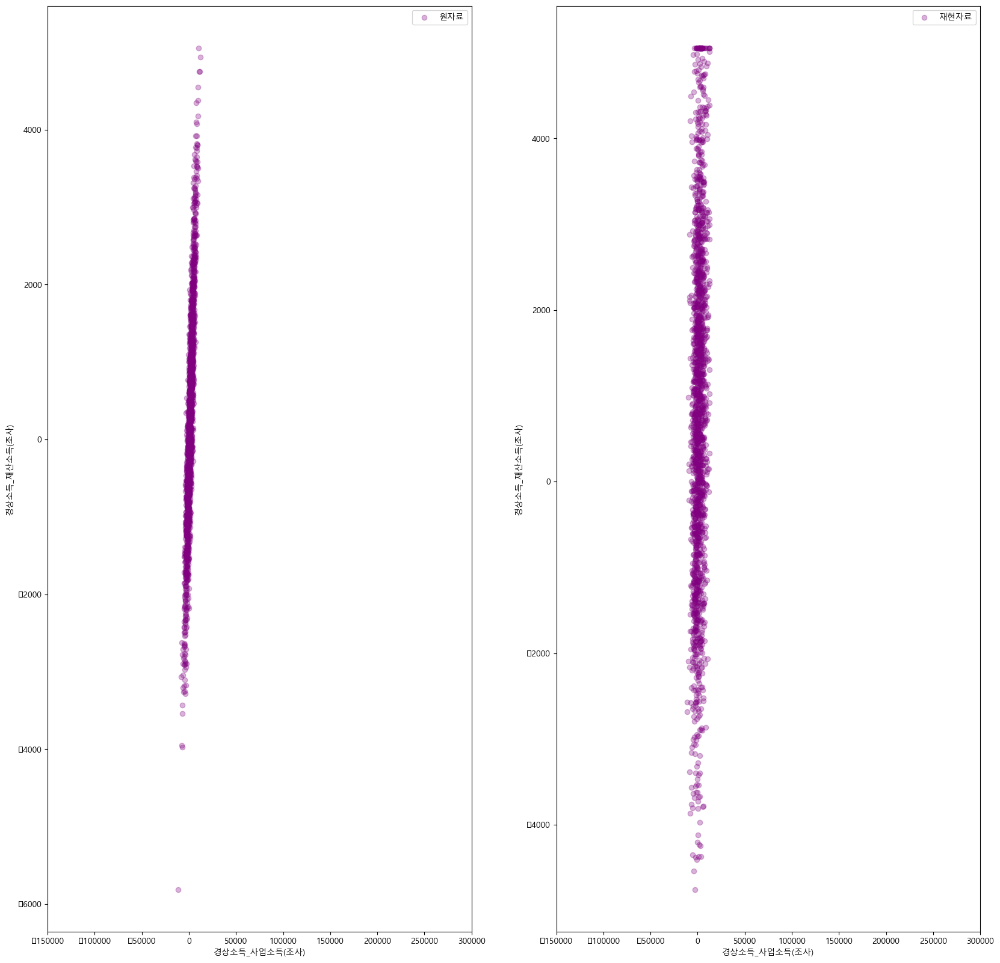

In [155]:
scatterplot(non_rho5_mvn , ori_non_rho5_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

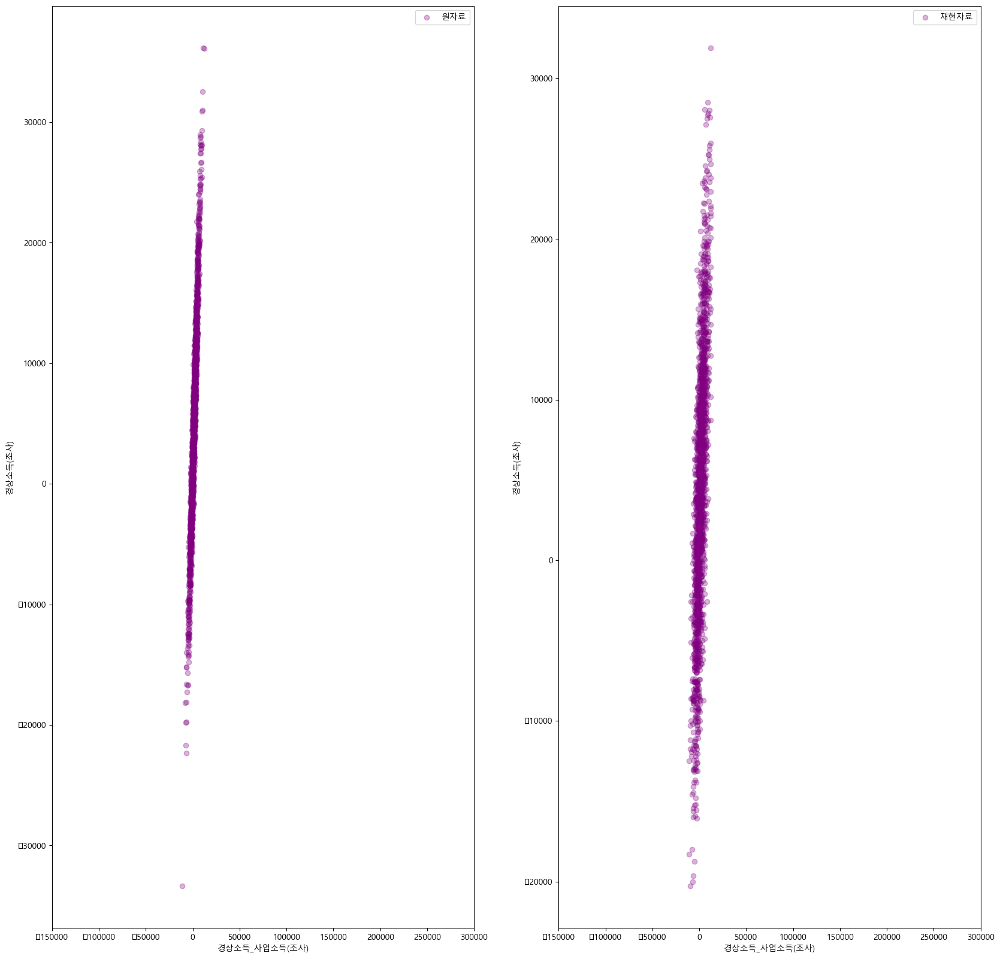

In [156]:
scatterplot(non_rho5_mvn , ori_non_rho5_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

# 경상소득이 포함된 자료

## $\rho = 0.1$에 대하여 첫번째 자료를 이용한 비교

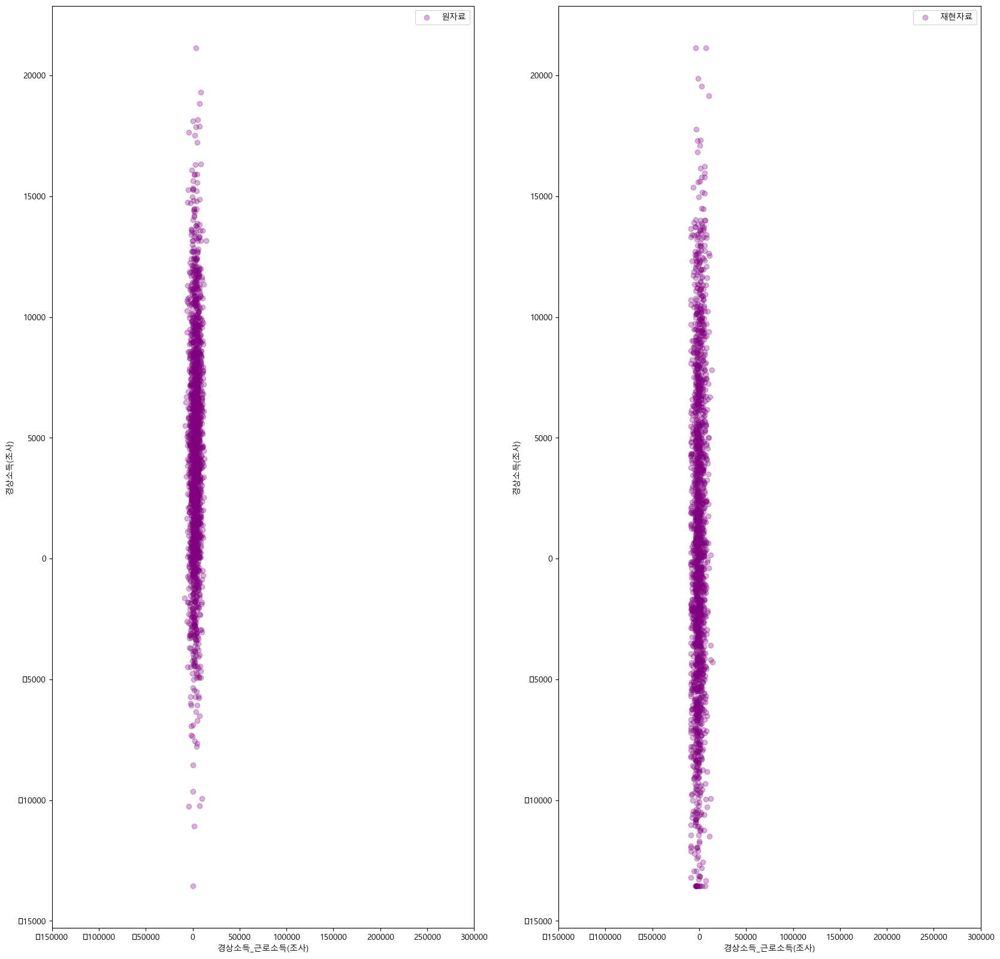

In [157]:
scatterplot(all_rho1_mvn , ori_all_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

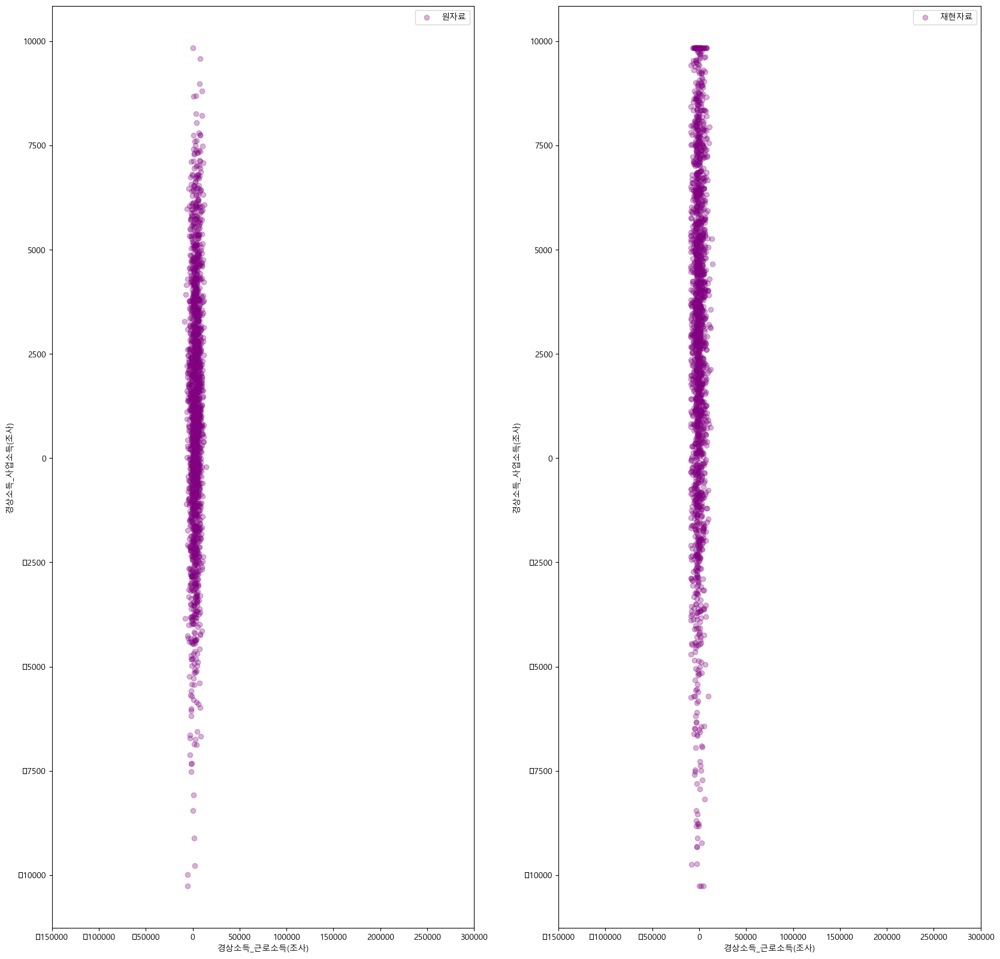

In [161]:
scatterplot(all_rho1_mvn , ori_all_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

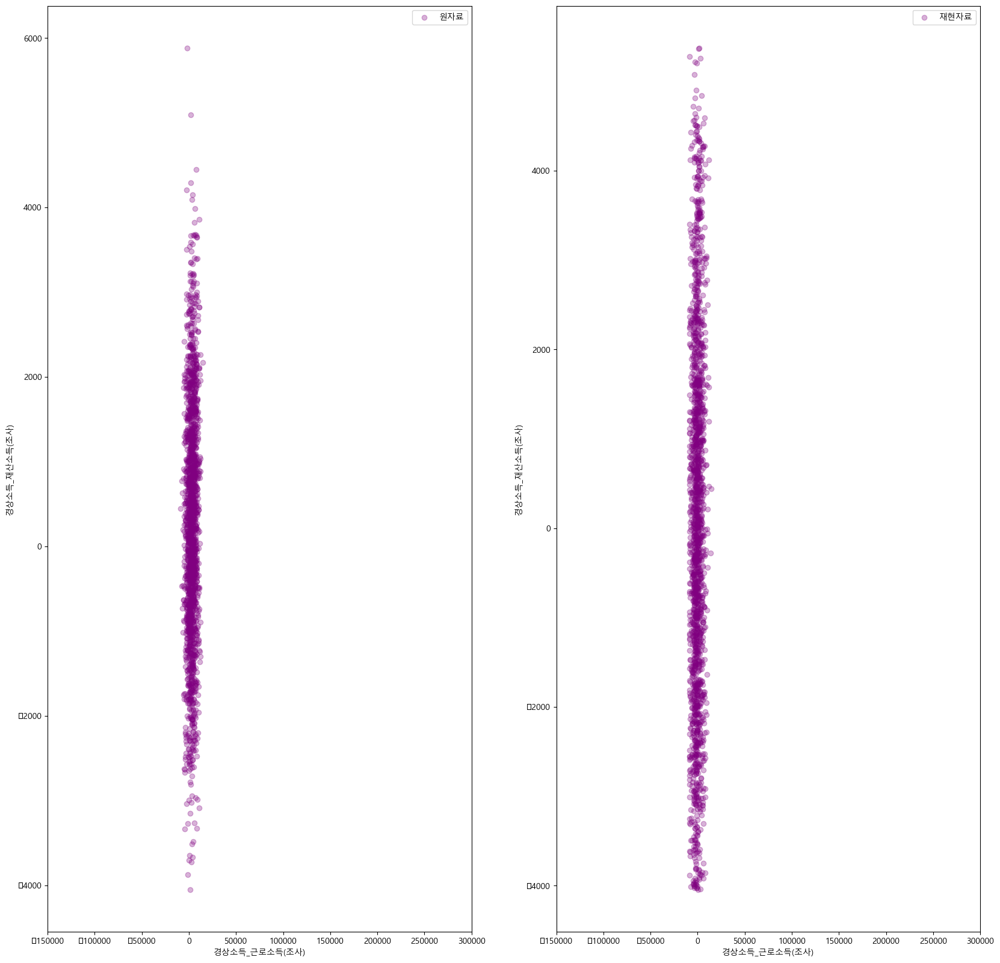

In [160]:
scatterplot(all_rho1_mvn , ori_all_rho1_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

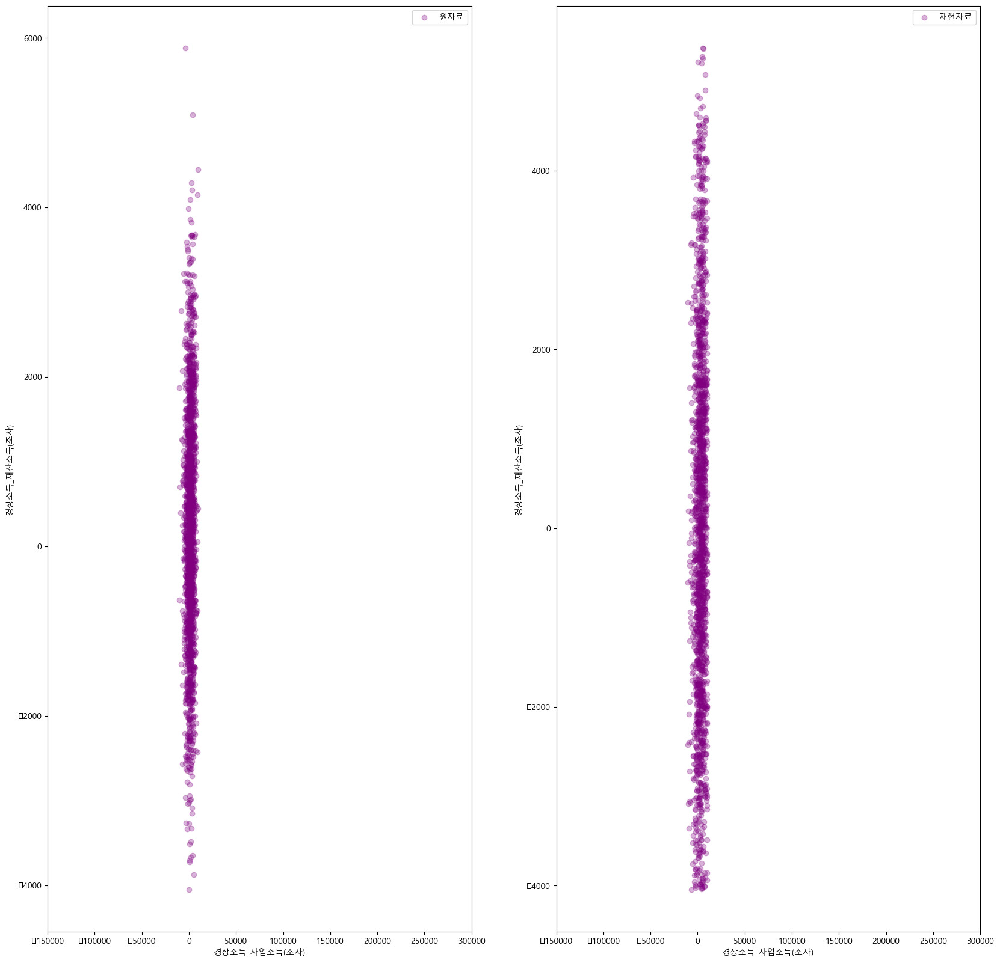

In [159]:
scatterplot(all_rho1_mvn , ori_all_rho1_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

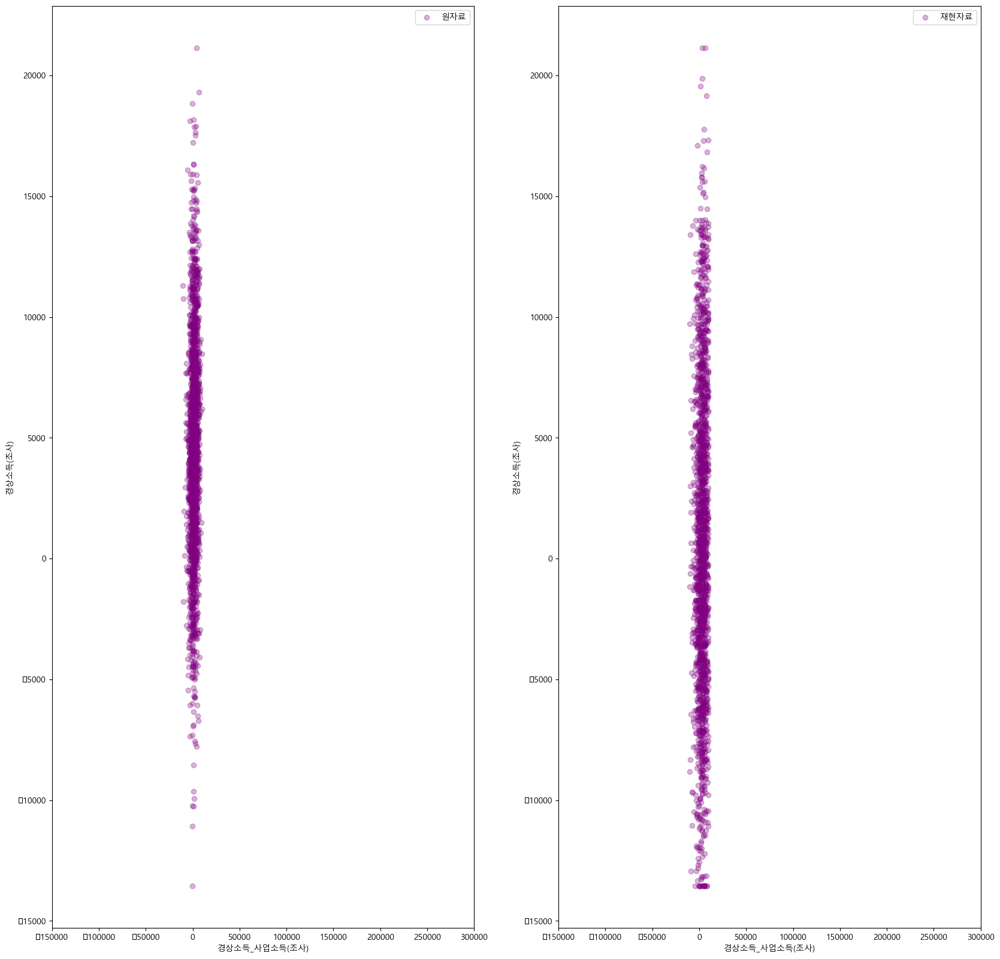

In [162]:
scatterplot(all_rho1_mvn , ori_all_rho1_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.3$에 대하여 첫번째 자료를 이용한 비교

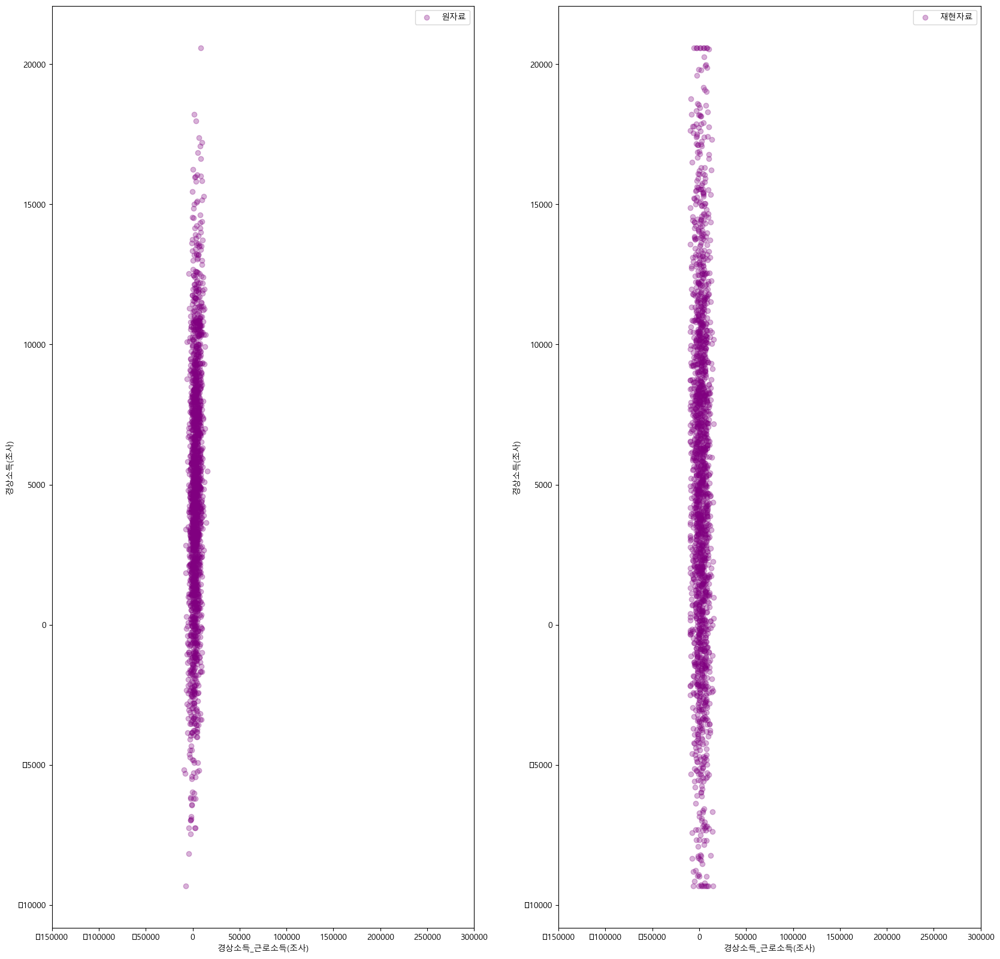

In [163]:
scatterplot(all_rho2_mvn , ori_all_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

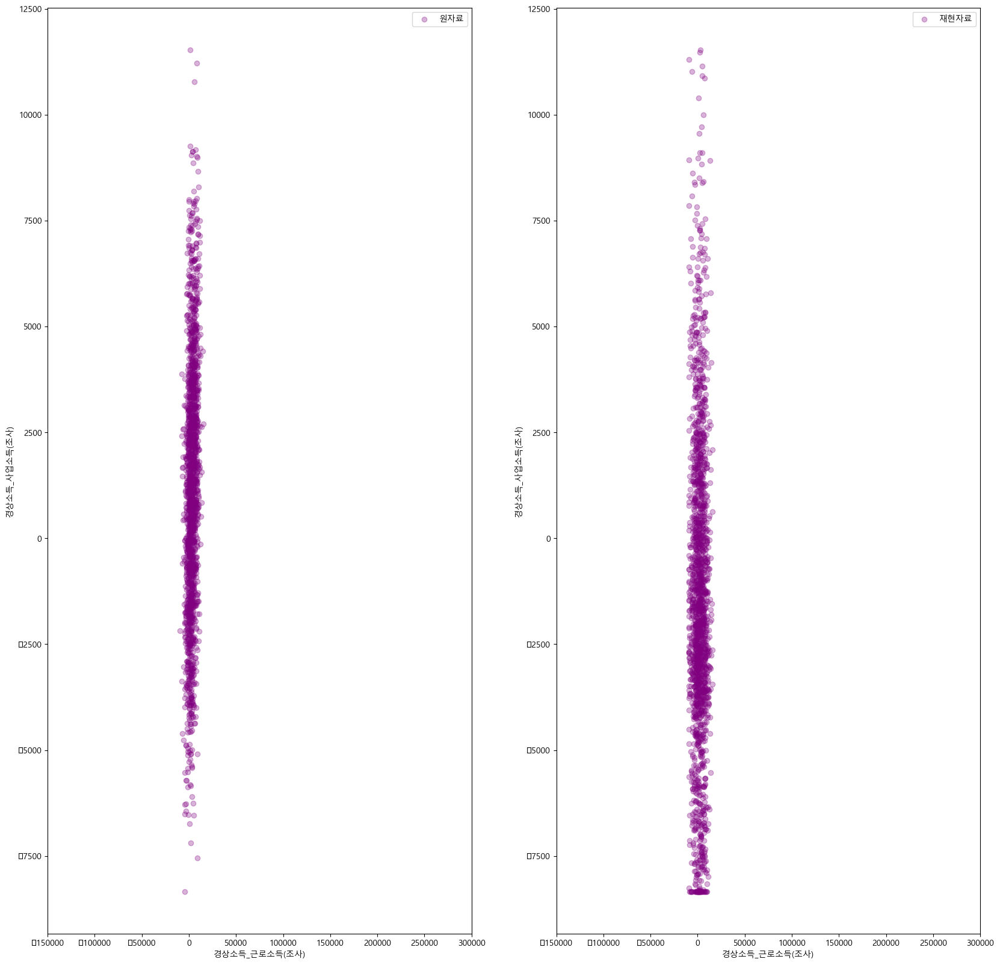

In [164]:
scatterplot(all_rho2_mvn , ori_all_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

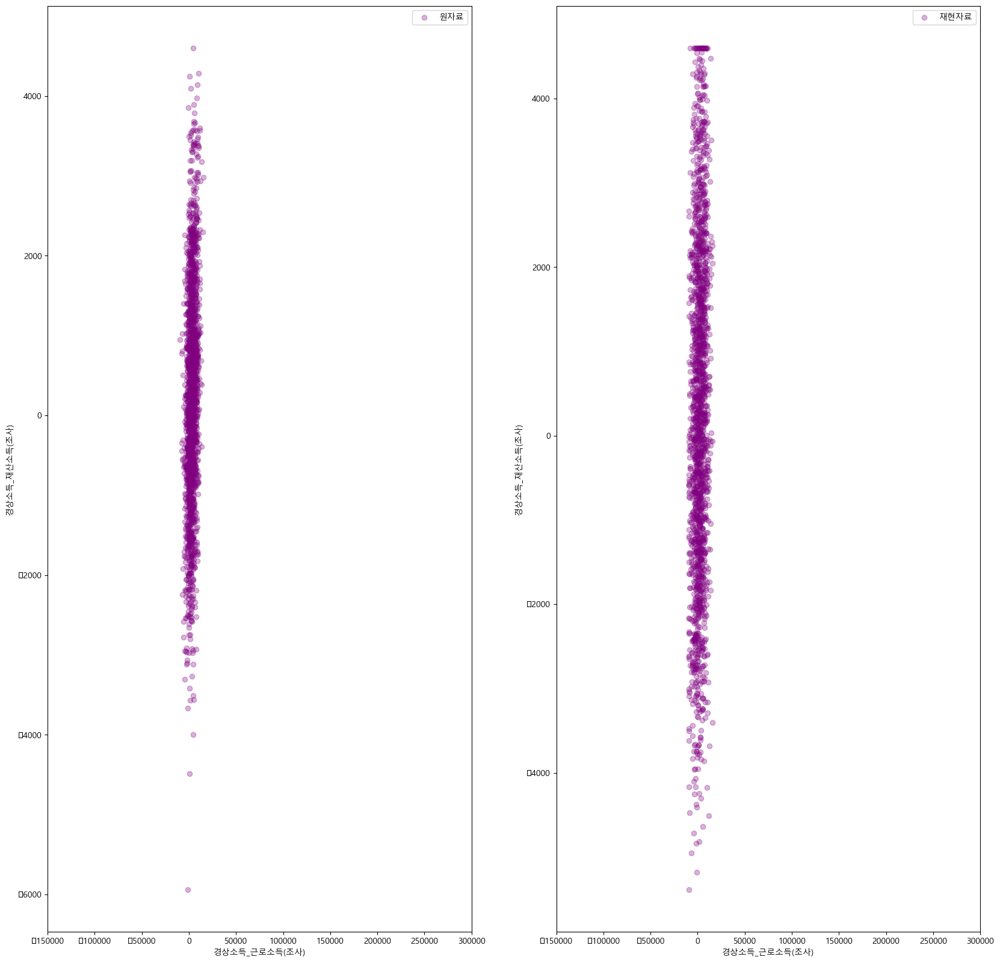

In [165]:
scatterplot(all_rho2_mvn , ori_all_rho2_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

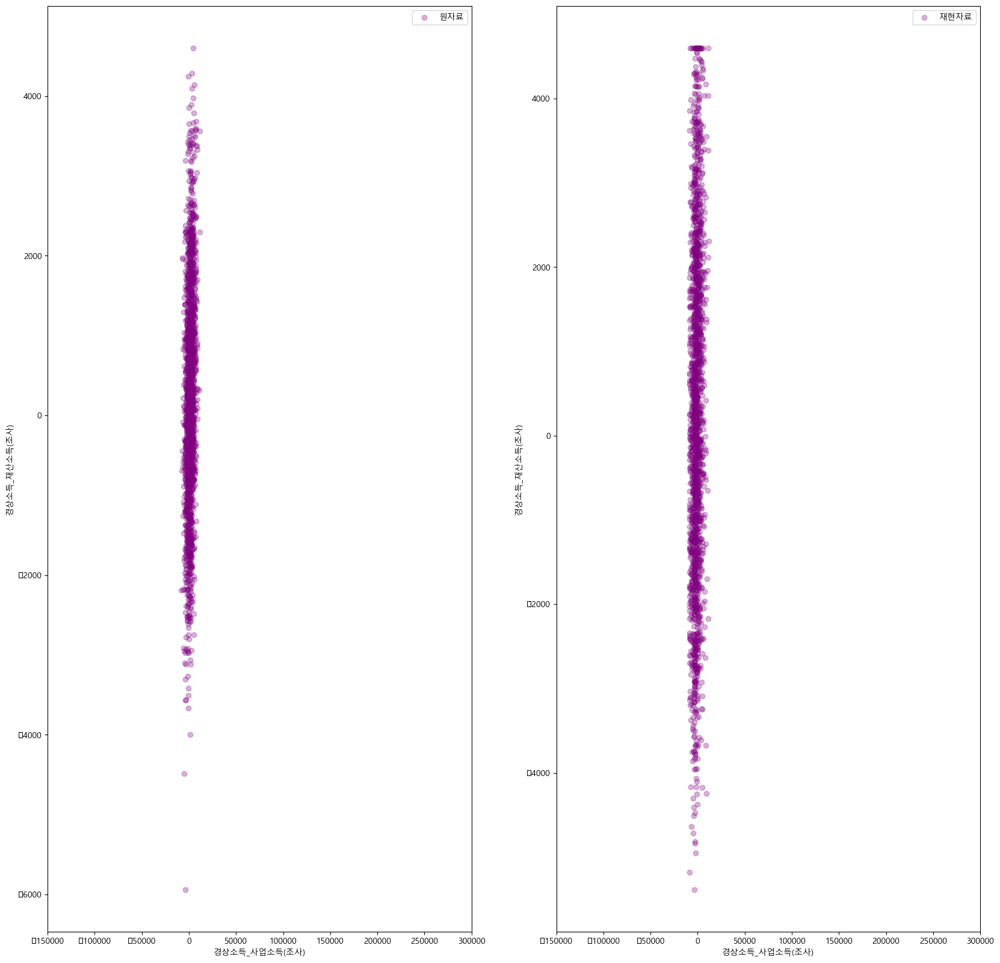

In [166]:
scatterplot(all_rho2_mvn , ori_all_rho2_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

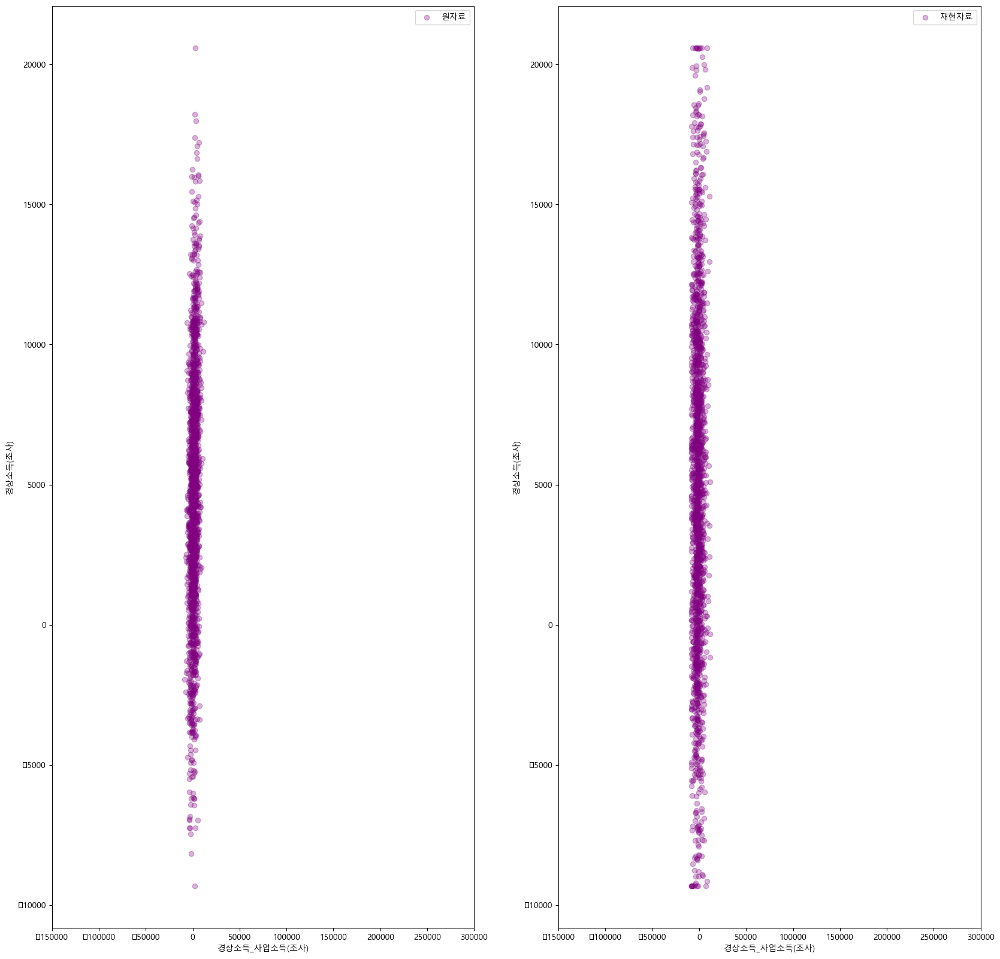

In [167]:
scatterplot(all_rho2_mvn , ori_all_rho2_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.5$에 대하여 첫번째 자료를 이용한 비교

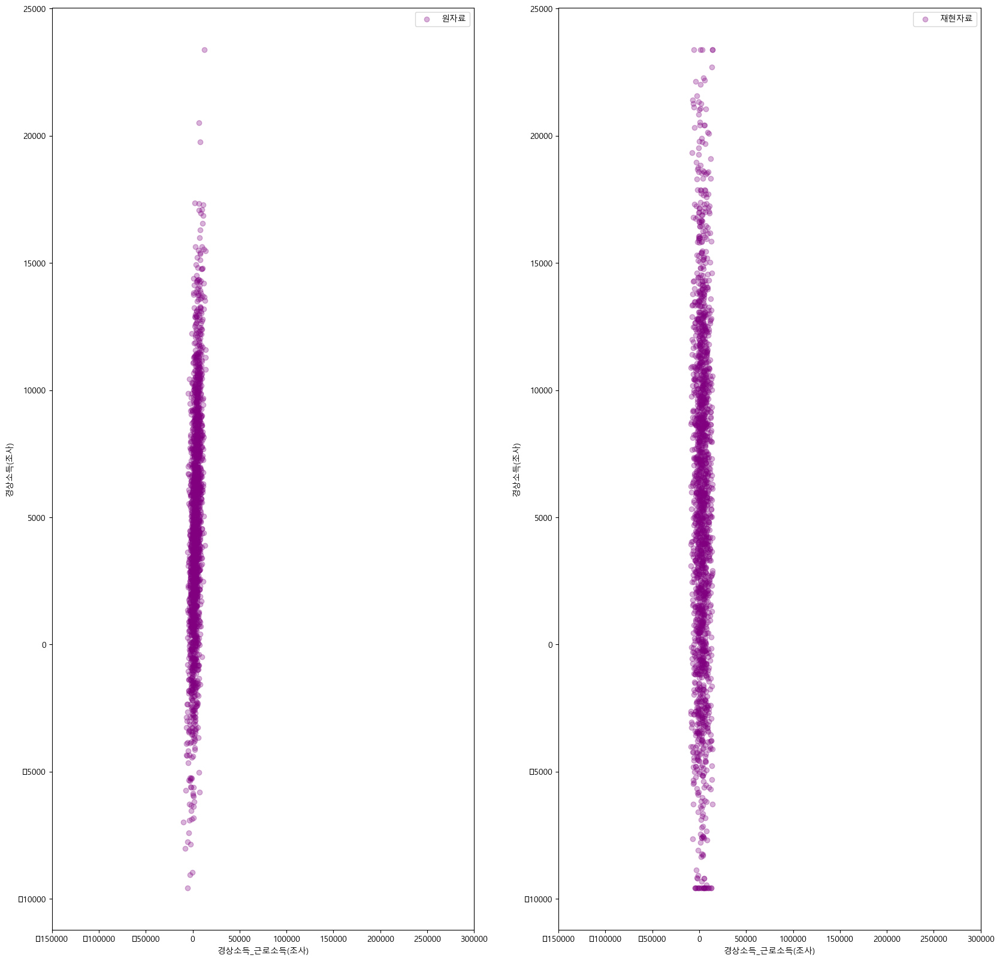

In [168]:
scatterplot(all_rho3_mvn , ori_all_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

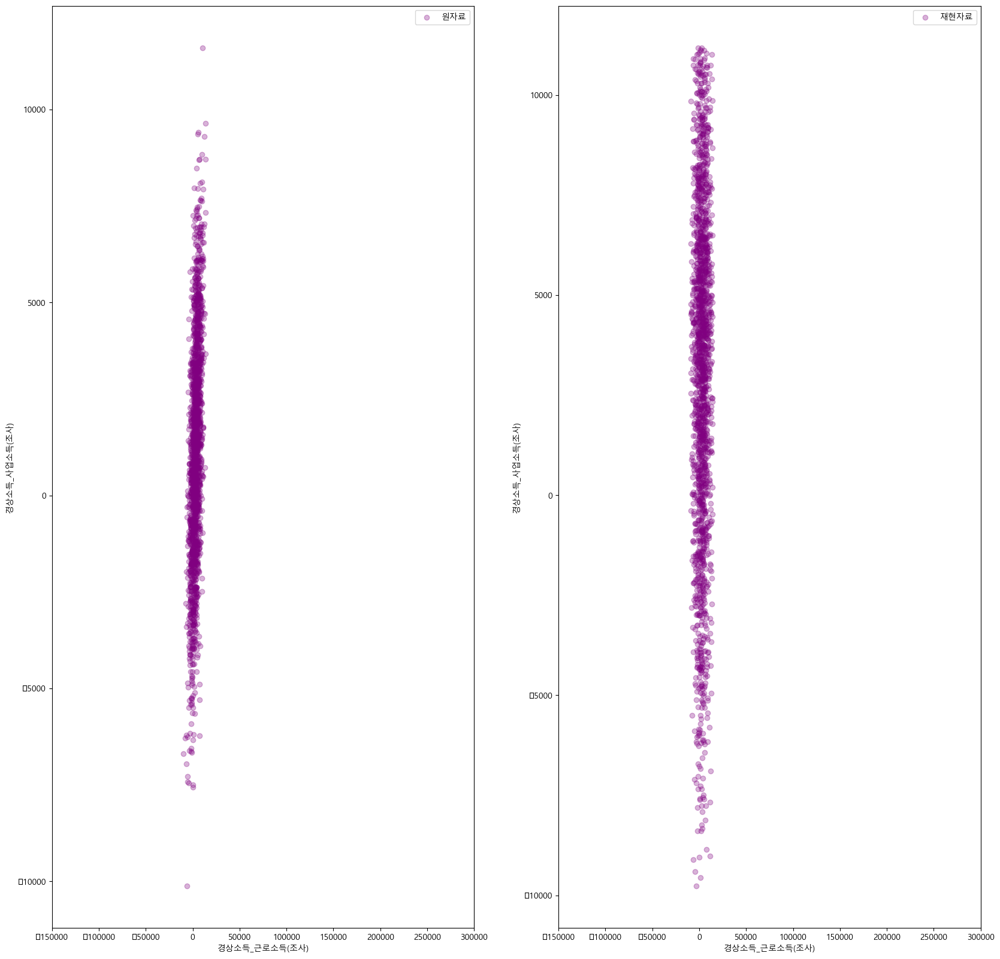

In [169]:
scatterplot(all_rho3_mvn , ori_all_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

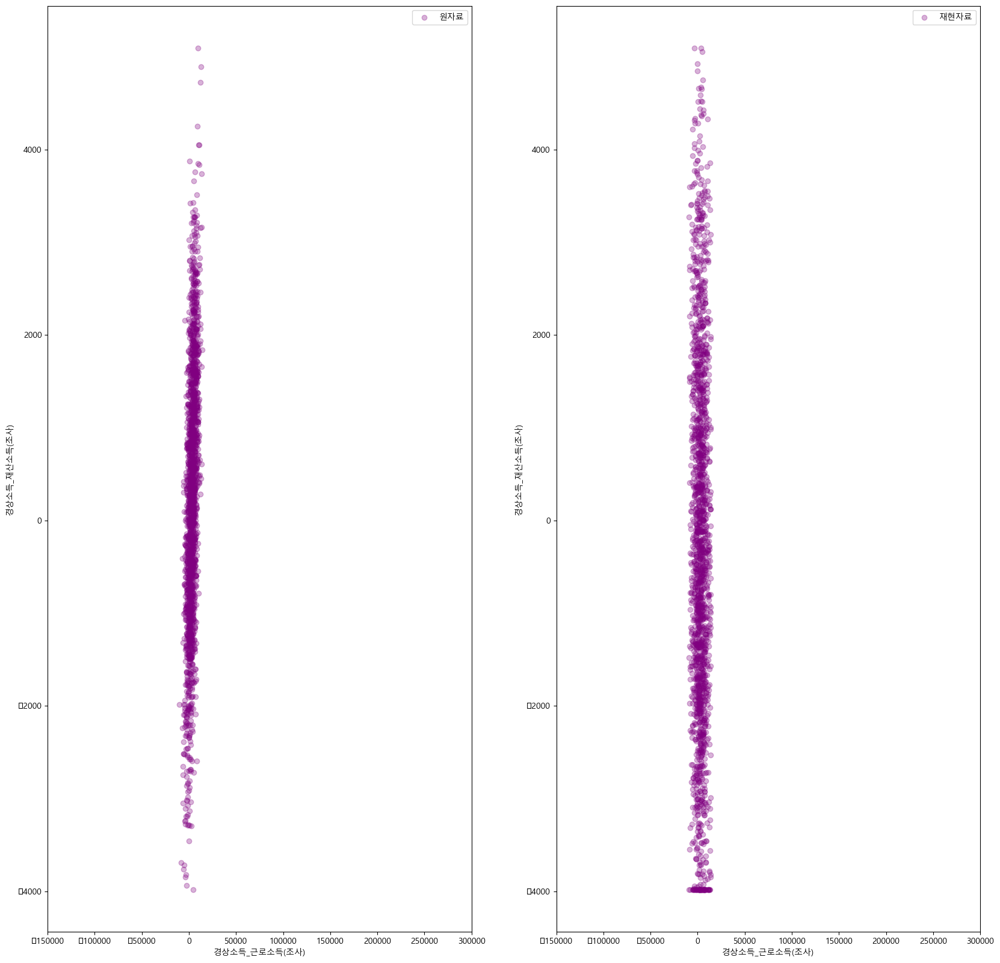

In [170]:
scatterplot(all_rho3_mvn , ori_all_rho3_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

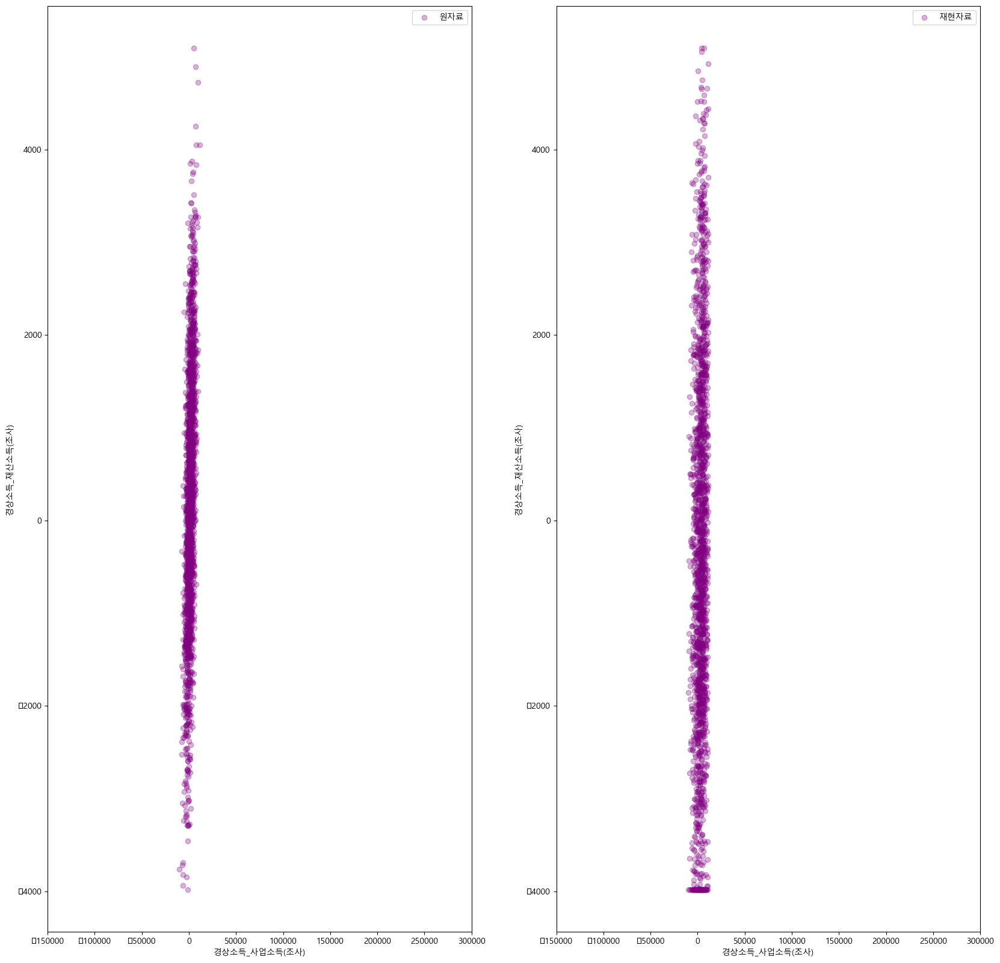

In [171]:
scatterplot(all_rho3_mvn , ori_all_rho3_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

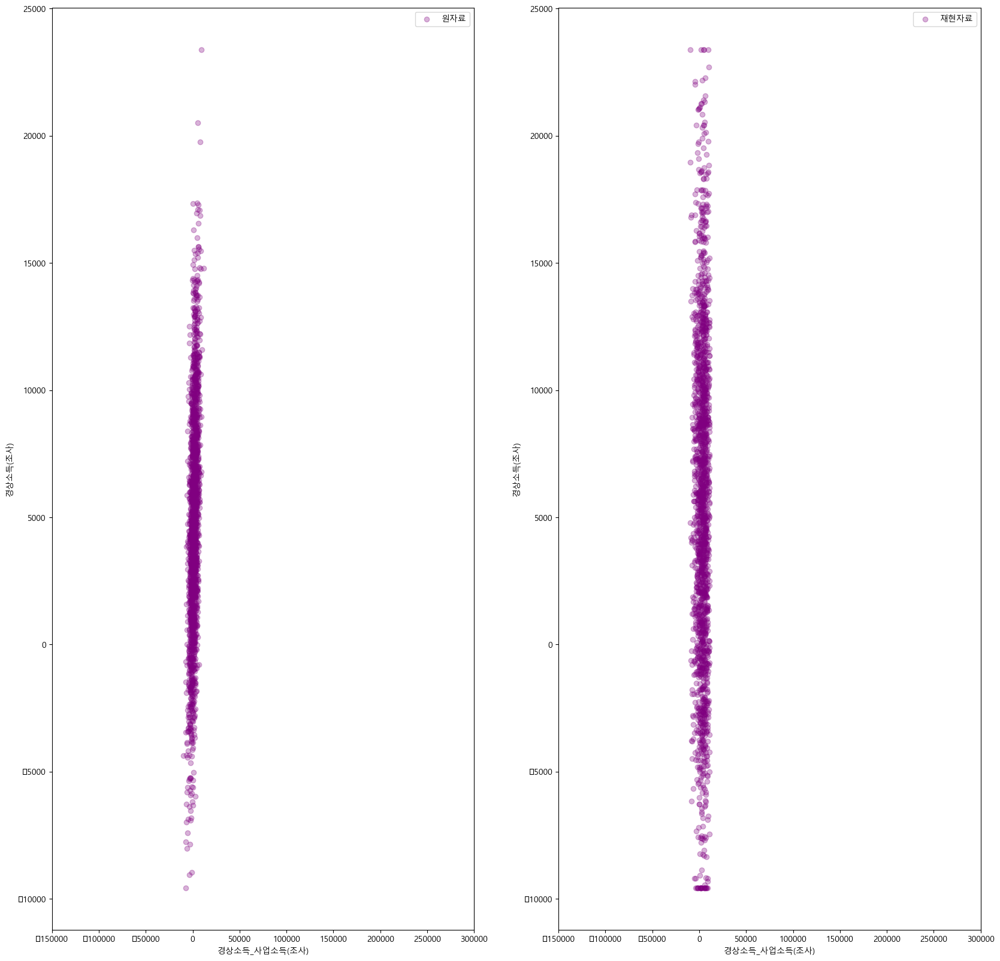

In [172]:
scatterplot(all_rho3_mvn , ori_all_rho3_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.7$에 대하여 첫번째 자료를 이용한 비교

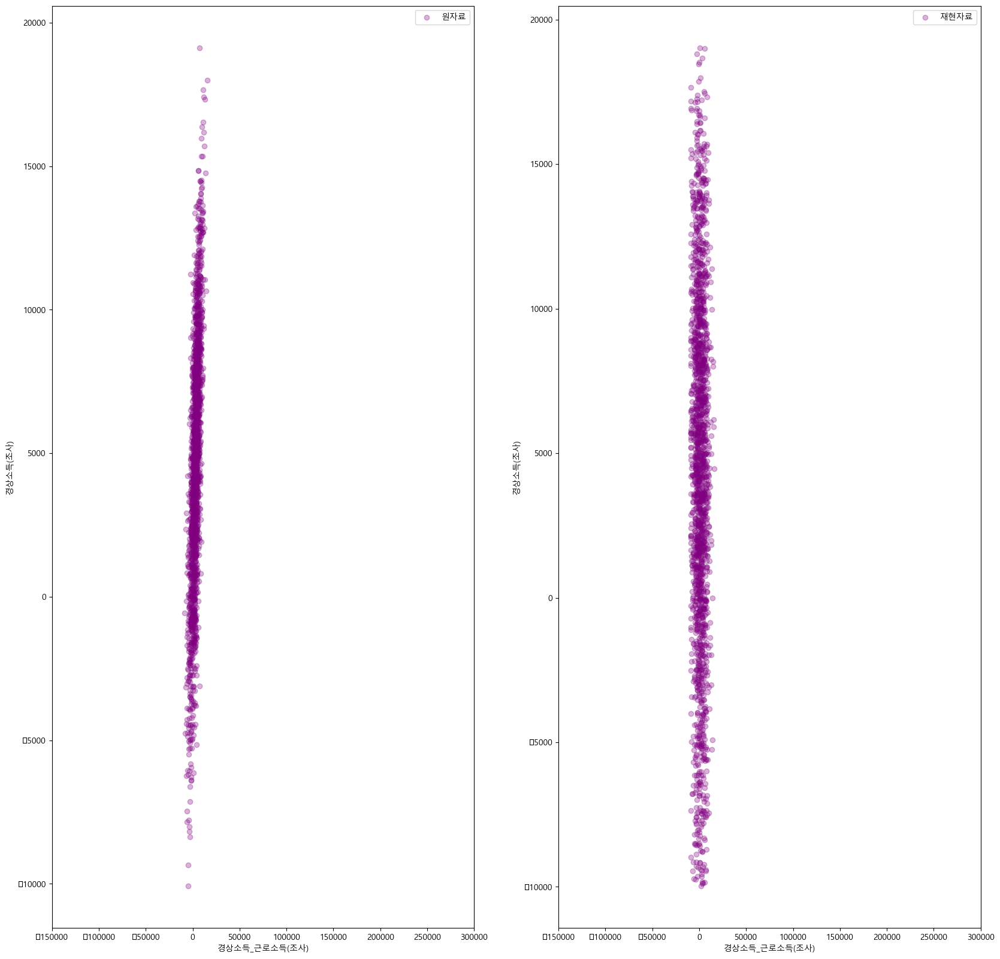

In [173]:
scatterplot(all_rho4_mvn , ori_all_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

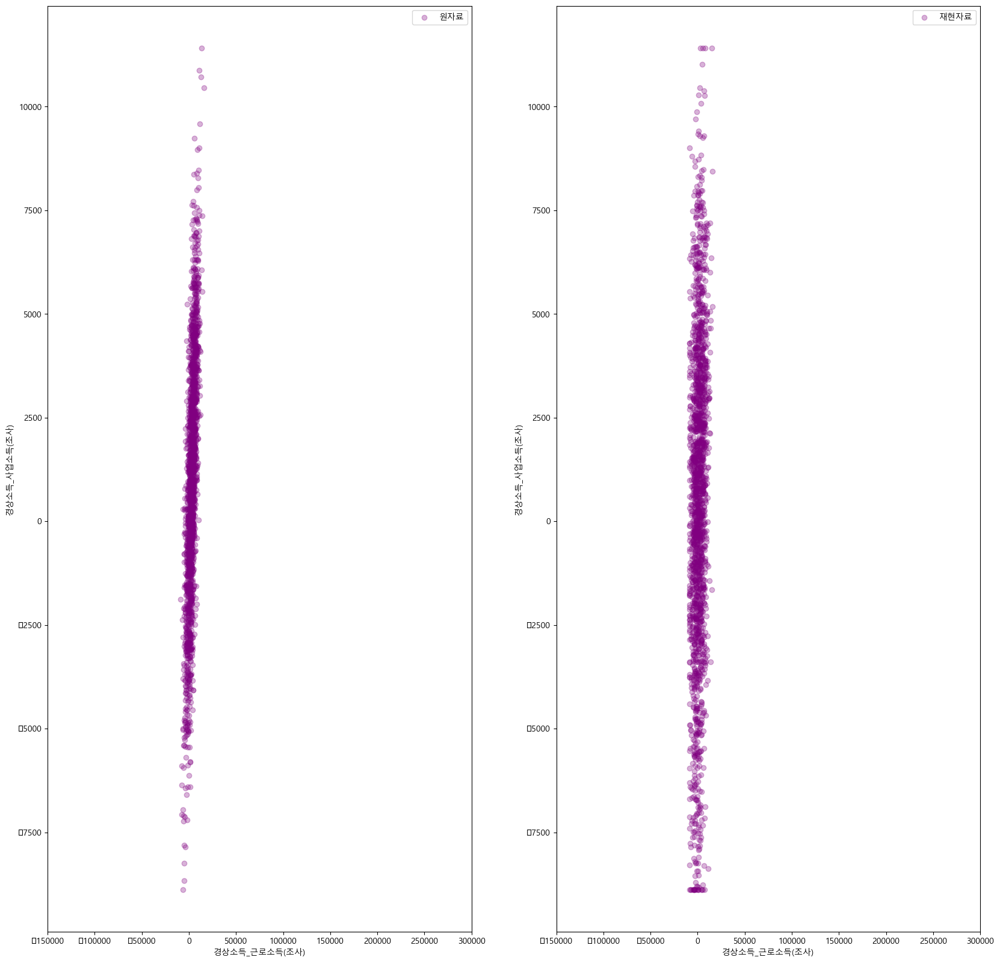

In [174]:
scatterplot(all_rho4_mvn , ori_all_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

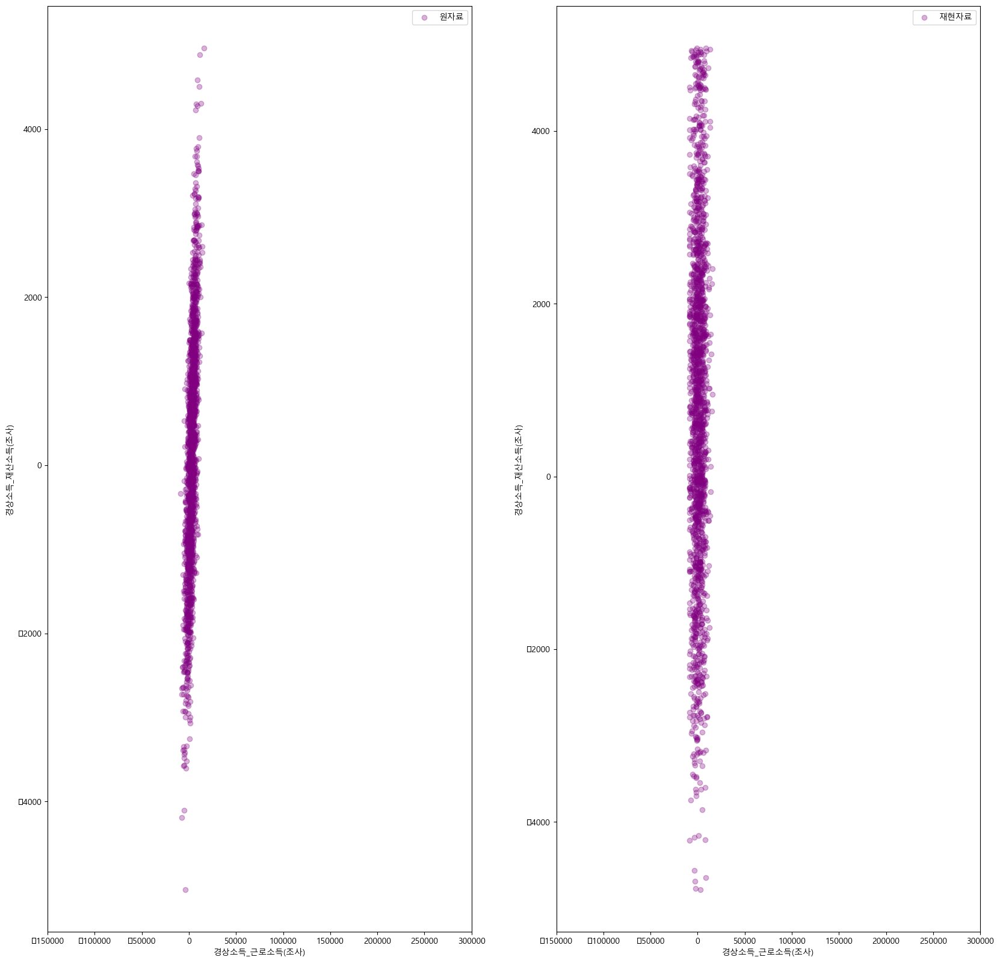

In [175]:
scatterplot(all_rho4_mvn , ori_all_rho4_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

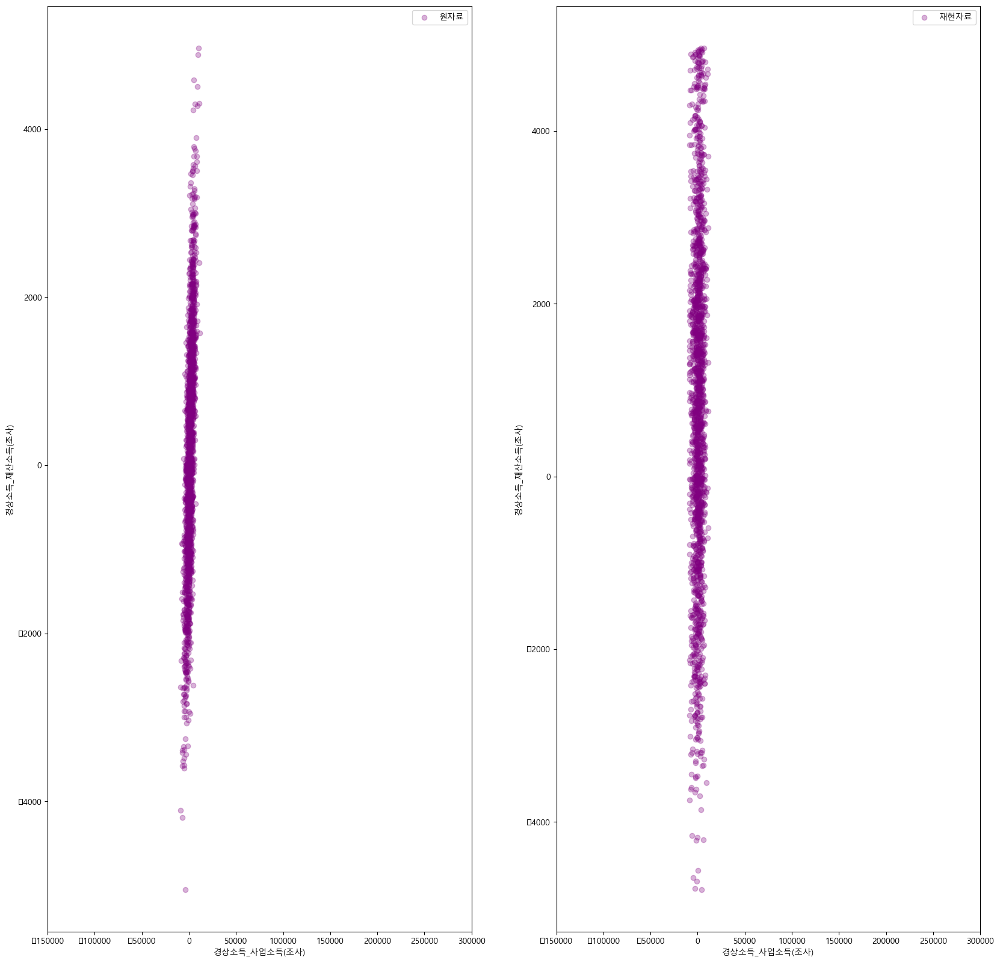

In [176]:
scatterplot(all_rho4_mvn , ori_all_rho4_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

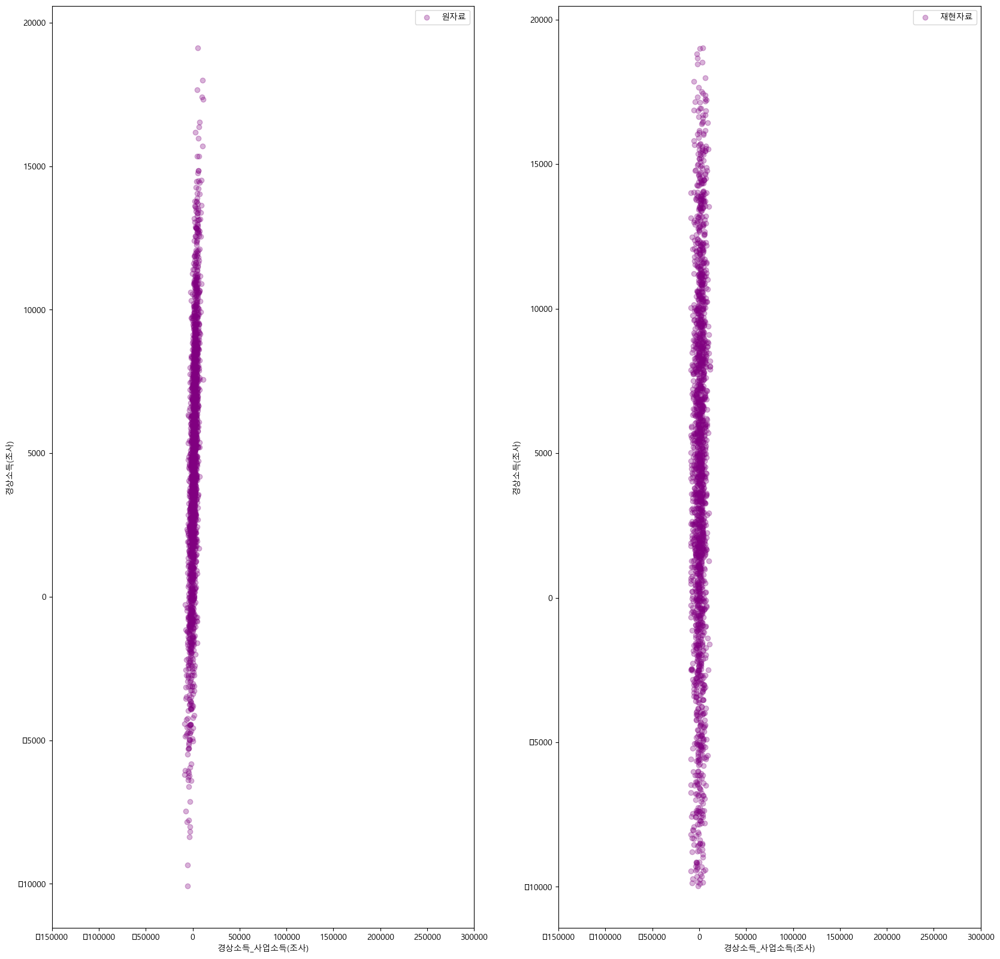

In [177]:
scatterplot(all_rho4_mvn , ori_all_rho4_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

## $\rho = 0.9$에 대하여 첫번째 자료를 이용한 비교

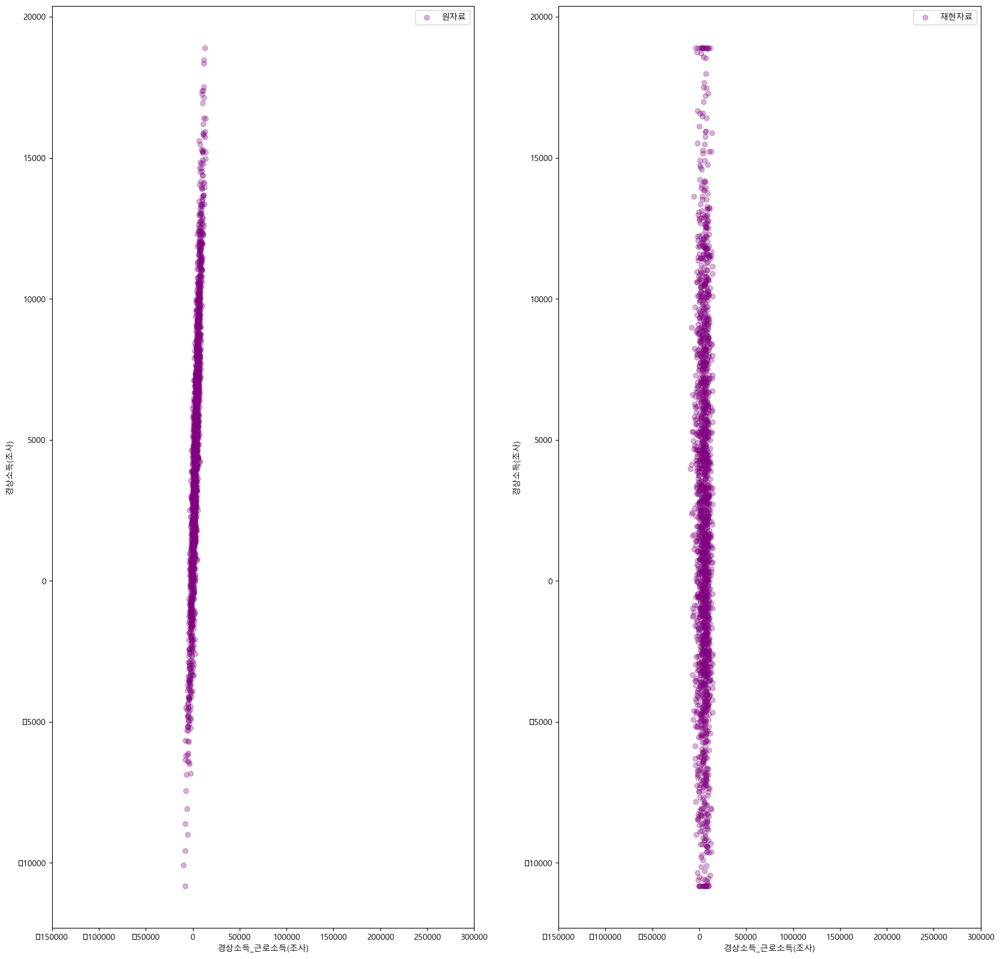

In [178]:
scatterplot(all_rho5_mvn , ori_all_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득(조사)')

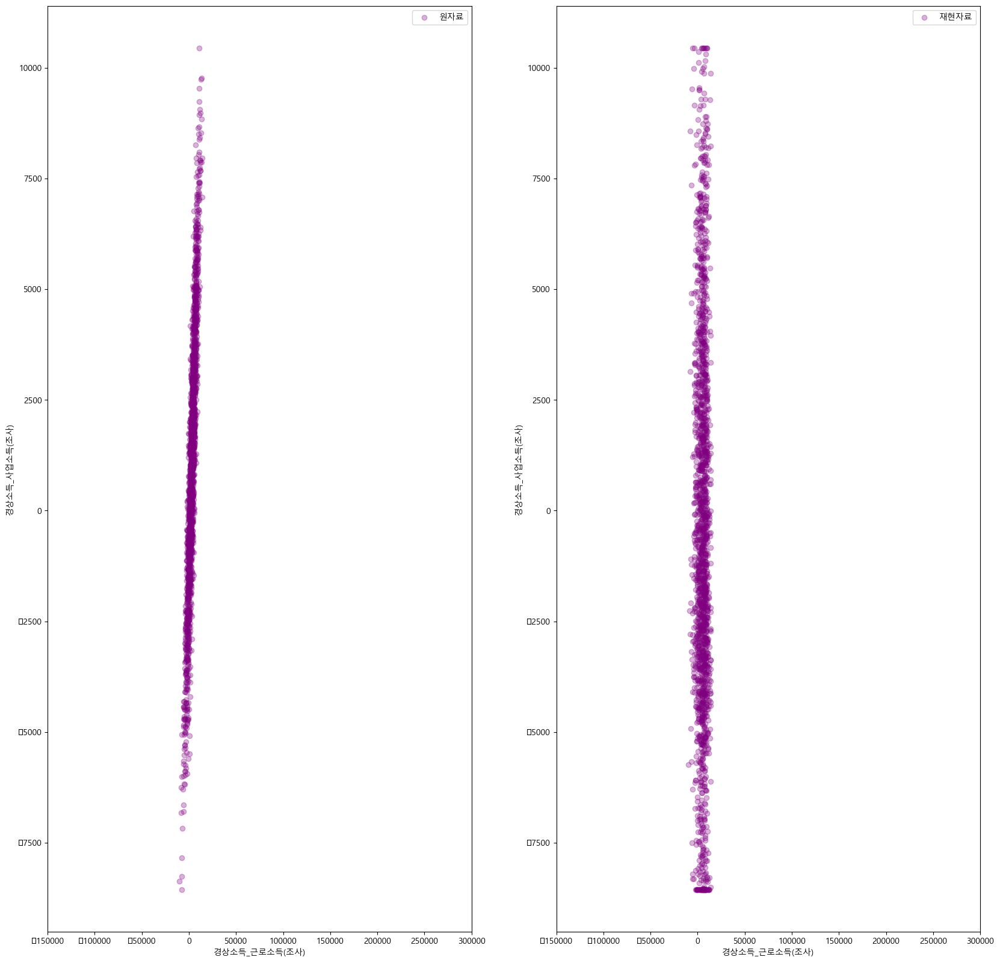

In [179]:
scatterplot(all_rho5_mvn , ori_all_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득_사업소득(조사)')

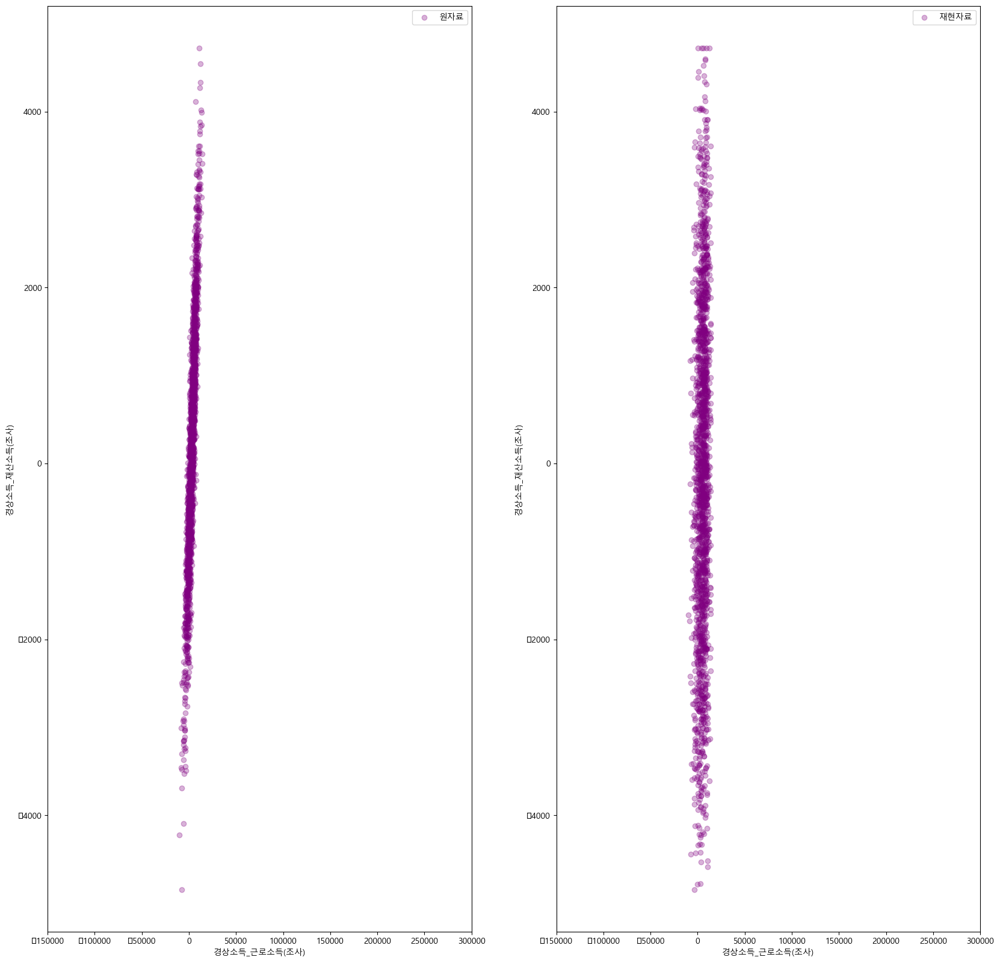

In [180]:
scatterplot(all_rho5_mvn , ori_all_rho5_data ,'경상소득_근로소득(조사)' ,  '경상소득_재산소득(조사)')

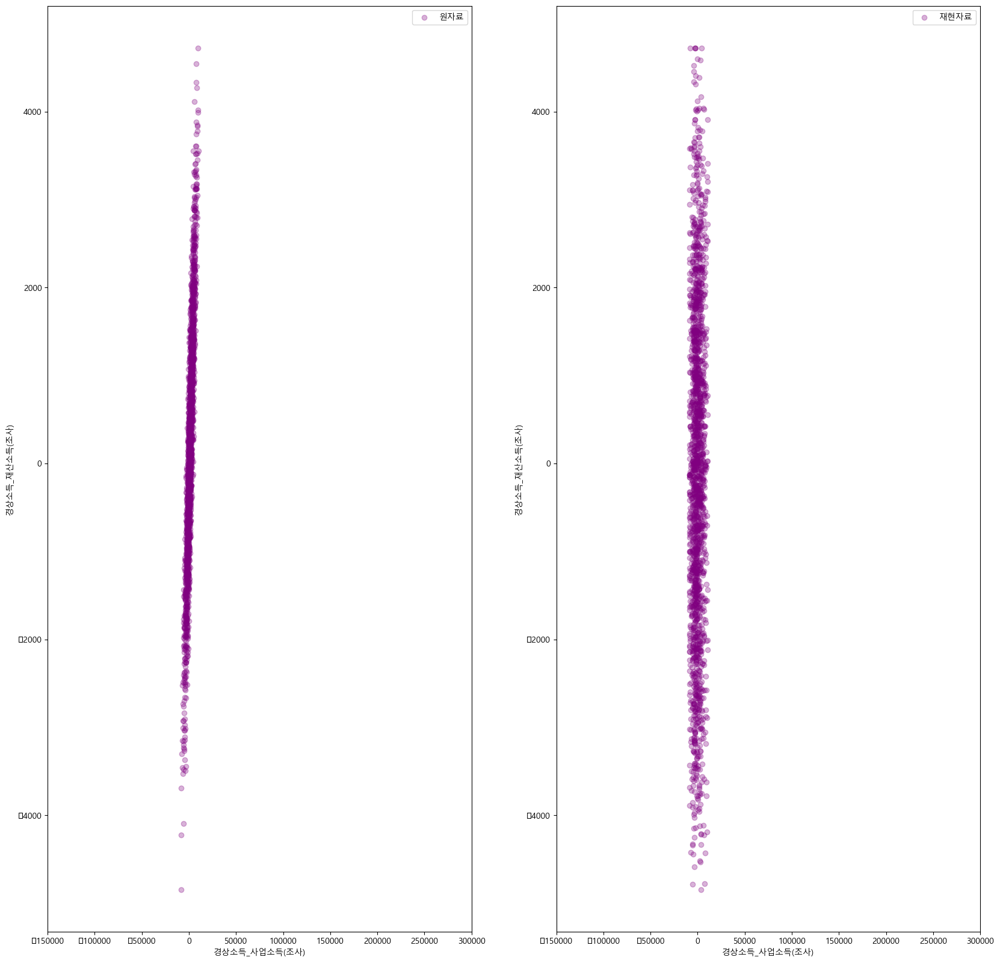

In [181]:
scatterplot(all_rho5_mvn , ori_all_rho5_data ,'경상소득_사업소득(조사)' ,  '경상소득_재산소득(조사)')

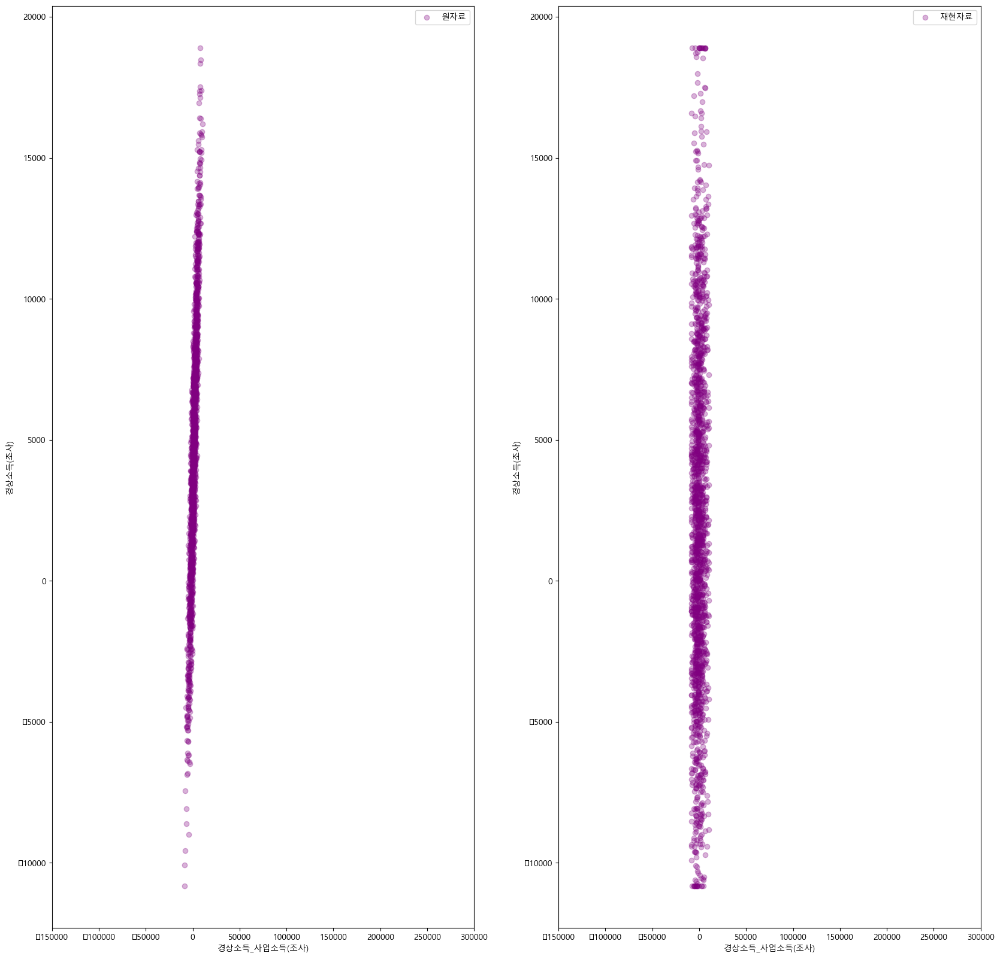

In [182]:
scatterplot(all_rho5_mvn , ori_all_rho5_data ,'경상소득_사업소득(조사)' ,  '경상소득(조사)')

### 경상소득이 포함되지 않은 자료에 대한 상관계수 그래프 

두개 같이 그렸을때 히트맵 크기가 일정하게 고정되서 나오지 않음 , 수정 필수

#### $\rho$ = 0.1

Text(0.5, 1.0, '전체재현자료')

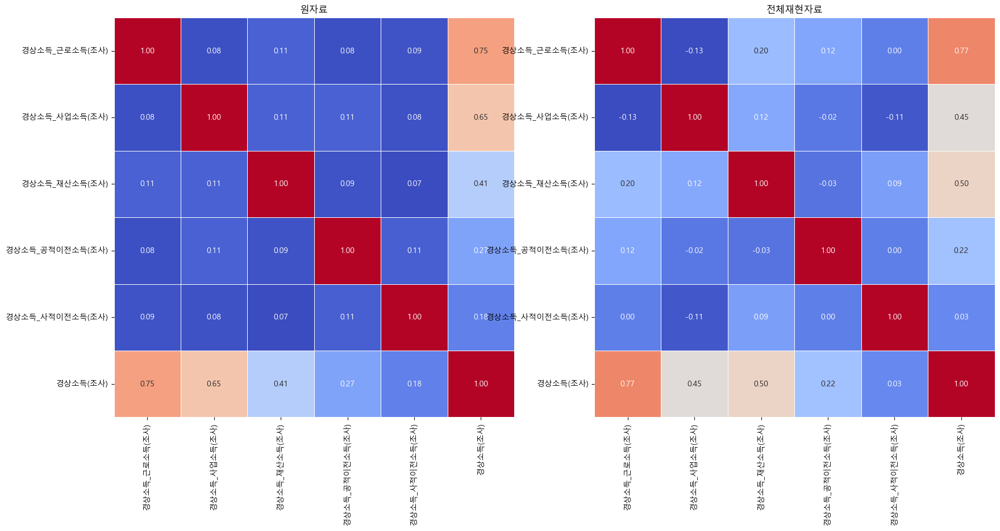

In [183]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,15)
sns.heatmap(non_rho1_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True , cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_non_rho1_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.3

Text(0.5, 1.0, '전체재현자료')

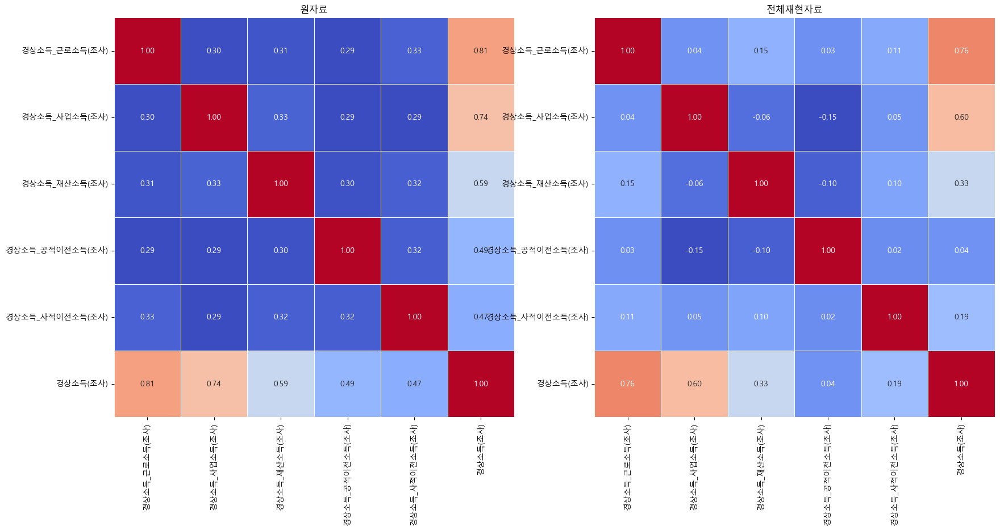

In [184]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (15,15)
sns.heatmap(non_rho2_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_non_rho2_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.5

Text(0.5, 1.0, '전체재현자료')

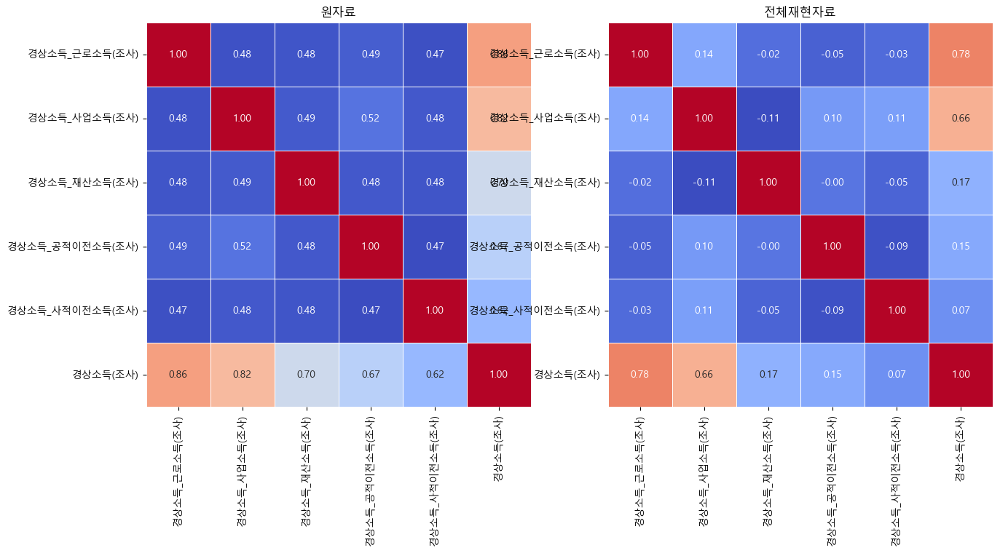

In [185]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,15)
sns.heatmap(non_rho3_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_non_rho3_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.7

Text(0.5, 1.0, '전체재현자료')

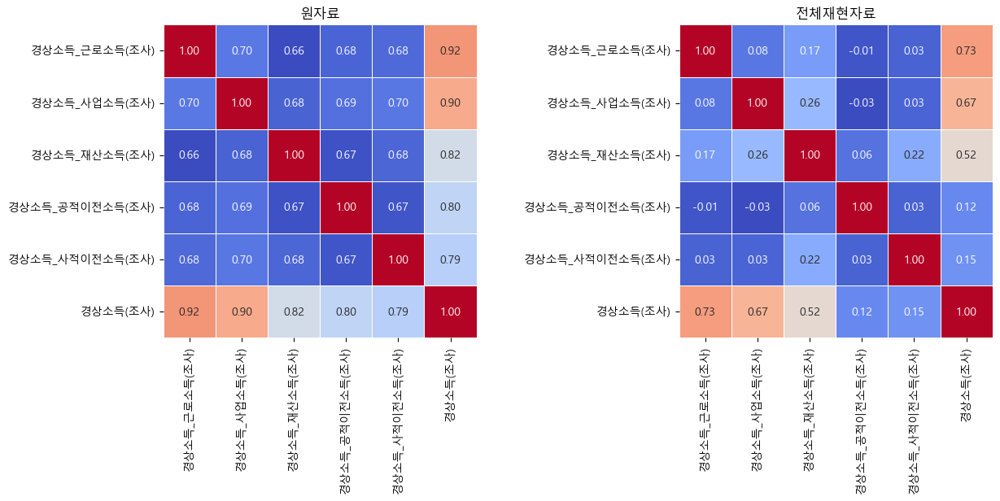

In [193]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (15,15)
sns.heatmap(non_rho4_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_non_rho4_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.9

Text(0.5, 1.0, '전체재현자료')

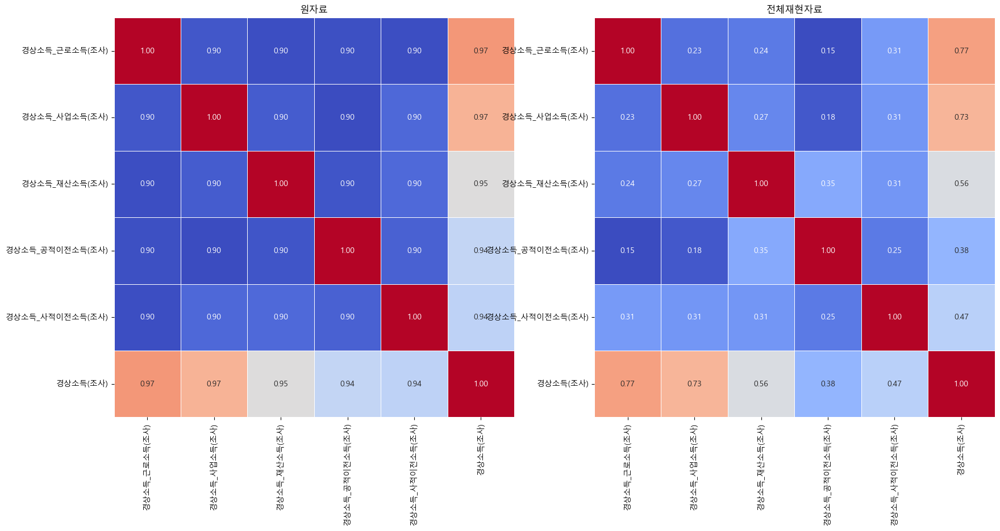

In [200]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,15)
sns.heatmap(non_rho5_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_non_rho5_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

### 경상소득이 포함된 자료에 대한 상관계수 그래프

#### $\rho$ = 0.1

Text(0.5, 1.0, '전체재현자료')

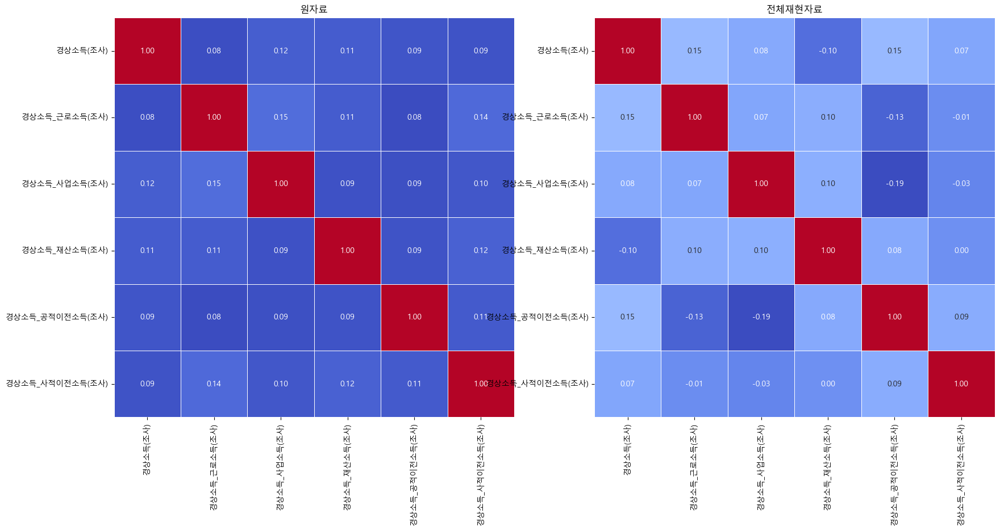

In [201]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,15)
sns.heatmap(all_rho1_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True , cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_all_rho1_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True , cbar = False)
plt.title("전체재현자료")

#### $\rho$ = 0.3

Text(0.5, 1.0, '전체재현자료')

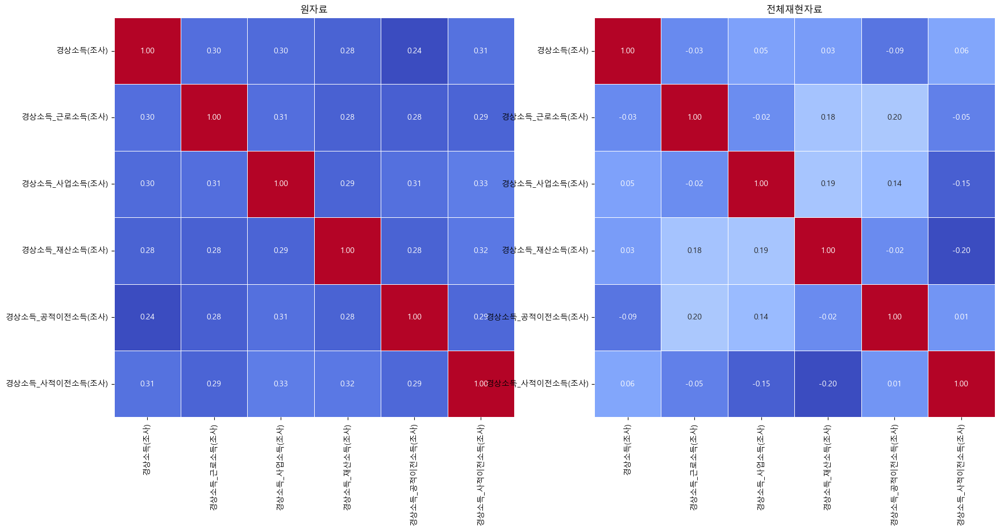

In [202]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,5)
sns.heatmap(all_rho2_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_all_rho2_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.5

Text(0.5, 1.0, '전체재현자료')

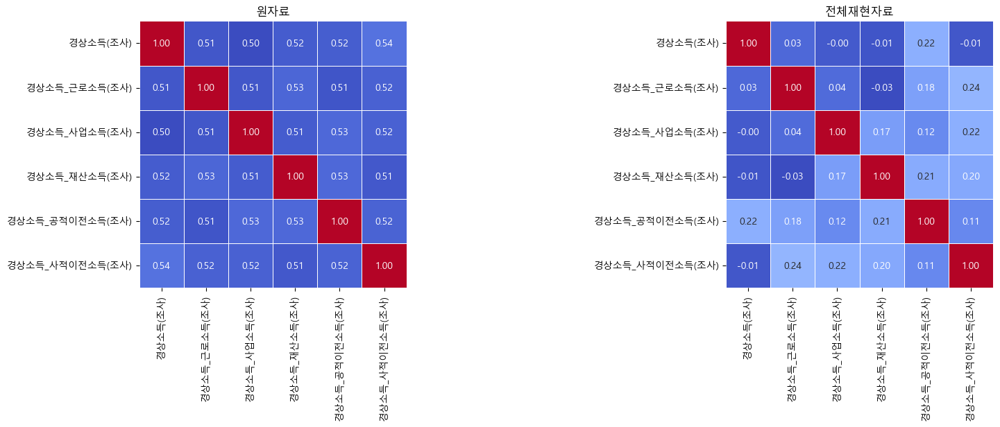

In [203]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,5)
sns.heatmap(all_rho3_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_all_rho3_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.7

Text(0.5, 1.0, '전체재현자료')

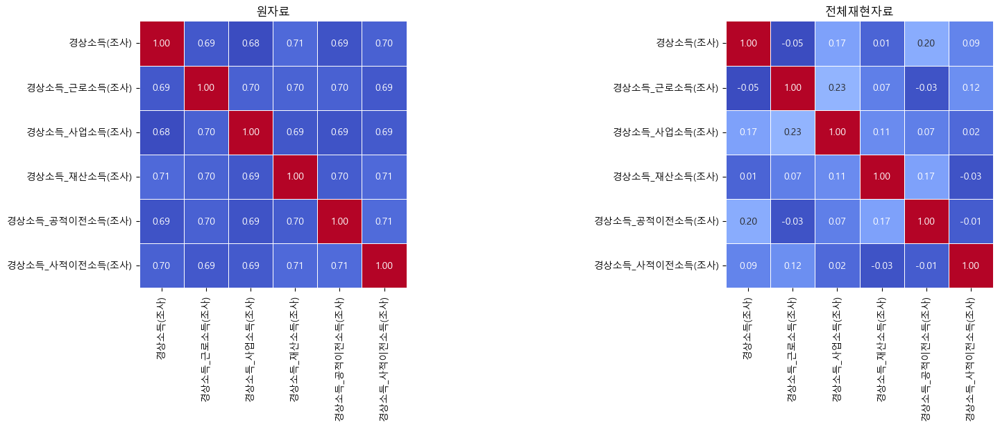

In [204]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,5)
sns.heatmap(all_rho4_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_all_rho4_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

#### $\rho$ = 0.9

Text(0.5, 1.0, '전체재현자료')

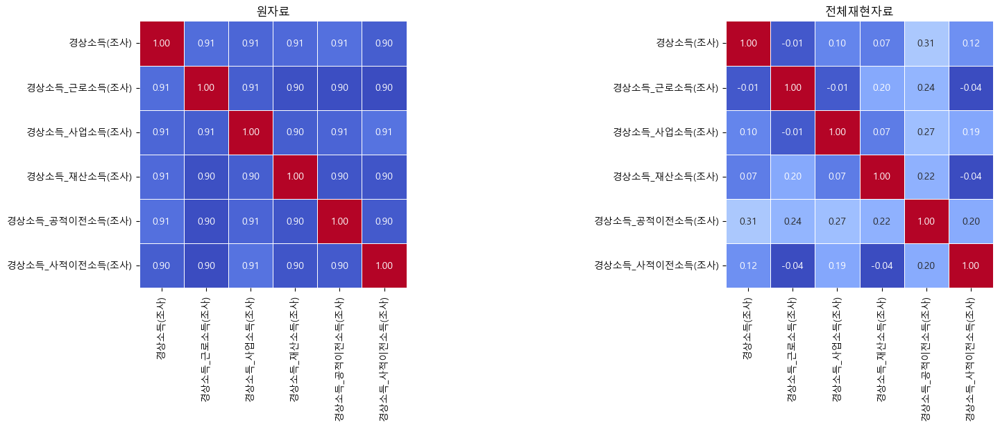

In [205]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (20,5)
sns.heatmap(all_rho5_mvn[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("원자료")

plt.subplot(1,2,2)
sns.heatmap(ori_all_rho5_data[0].iloc[:,1:7].corr(),annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, square=True, cbar=False)
plt.title("전체재현자료")

### KSComplement ( 원자료 , 재현자료 , 변수 , 반복횟수 ) - 실제자료와 재현자료간의 유사성 측정

SDMetrics 패키지에서 KSComplements라는 함수를 이용할 것인데, 원리는 콜모고로프 스미노프 통계량을 이용한 척도입니다.  
이표본 콜모고로프 스미노프 테스트를 이용해서 두 연속형 변수간의  누적분포를 비교하는 원리 

만약 값이 1에 가까우면 유사하다는 뜻이고 0에 가까우면 다르다는 뜻임

In [206]:
def KSComplements(oridata , synthetic_data , variable , iteration) : 
    
    KSComplement_Result = []       

    for i in range(iteration) : 
        KSComplement_Result.append(
            KSComplement.compute(
                real_data = oridata[i][variable],
                synthetic_data = synthetic_data[i][variable]))
        
    return KSComplement_Result 

In [207]:
KS1 = KSComplements(non_rho1_mvn , ori_non_rho1_data , '경상소득(조사)' , 500)
KS2 = KSComplements(non_rho2_mvn , ori_non_rho2_data , '경상소득(조사)' , 500)
KS3 = KSComplements(non_rho3_mvn , ori_non_rho3_data , '경상소득(조사)' , 500)
KS4 = KSComplements(non_rho4_mvn , ori_non_rho4_data , '경상소득(조사)' , 500)
KS5 = KSComplements(non_rho5_mvn , ori_non_rho5_data , '경상소득(조사)' , 500)

In [208]:
AKS1 = KSComplements(all_rho1_mvn , ori_all_rho1_data , '경상소득(조사)' , 500)
AKS2 = KSComplements(all_rho2_mvn , ori_all_rho2_data , '경상소득(조사)' , 500)
AKS3 = KSComplements(all_rho3_mvn , ori_all_rho3_data , '경상소득(조사)' , 500)
AKS4 = KSComplements(all_rho4_mvn , ori_all_rho4_data , '경상소득(조사)' , 500)
AKS5 = KSComplements(all_rho5_mvn , ori_all_rho5_data , '경상소득(조사)' , 500)

In [209]:
def calculate_statistics(data):
    results = {
        'mean': np.array(np.mean(data)),
        'std': np.array(np.std(data))}
    return results

In [210]:
def measure_dataframe(data1 , data2 , data3 , data4 ,data5):
    
    result = np.array([[np.mean(data1) , np.std(data1)] , [np.mean(data2) , np.std(data2)] , [np.mean(data3) , np.std(data3)] , [np.mean(data4) , np.std(data4)] , [np.mean(data5) , np.std(data5)]])
    frame = pd.DataFrame(result)
    frame.columns = ["척도의 평균" , "척도의 표준편차"]
    frame.index = ['0.1','0.3','0.5','0.7','0.9']
    
    return pd.DataFrame(frame )


경상소득(조사) 미포함

In [211]:
measure_dataframe(KS1 , KS2 , KS3 , KS4 , KS5)

,척도의 평균,척도의 표준편차
0.1,0.834262,0.082778
0.3,0.856253,0.079346
0.5,0.869587,0.073371
0.7,0.886808,0.068283
0.9,0.901663,0.052487


경상소득(조사) 포함

In [212]:
measure_dataframe(AKS1 , AKS2 , AKS3 , AKS4 , AKS5)

,척도의 평균,척도의 표준편차
0.1,0.773690,0.089589
0.3,0.771355,0.092280
0.5,0.783094,0.082714
0.7,0.795248,0.082744
0.9,0.810816,0.076413


### CorrelationSimilarity ( 원자료 , 재현자료 , 변수1 , 변수2 , 피어슨 OR 스피어만 , 반복횟수 ) - 상관관계 측정 및 유사성 계산

In [213]:
def CorrelationSimilaritys(oridata , synthetic_data , variable1 , variable2 , method , iteration) : 
    
    CorrelationSimilarity_Result = [] 

    for i in range(iteration) : 
        CorrelationSimilarity_Result.append(
            CorrelationSimilarity.compute(
                real_data = oridata[i][[variable1 , variable2]],
                synthetic_data = synthetic_data[i][[variable1 , variable2]],
                coefficient = method))
        
    return CorrelationSimilarity_Result 

In [214]:
CS1 = CorrelationSimilaritys(non_rho1_mvn , ori_non_rho1_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
CS2 = CorrelationSimilaritys(non_rho2_mvn , ori_non_rho2_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
CS3 = CorrelationSimilaritys(non_rho3_mvn , ori_non_rho3_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
CS4 = CorrelationSimilaritys(non_rho4_mvn , ori_non_rho4_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
CS5 = CorrelationSimilaritys(non_rho5_mvn , ori_non_rho5_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)

In [215]:
ACS1 = CorrelationSimilaritys(all_rho1_mvn , ori_all_rho1_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
ACS2 = CorrelationSimilaritys(all_rho2_mvn , ori_all_rho2_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
ACS3 = CorrelationSimilaritys(all_rho3_mvn , ori_all_rho3_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
ACS4 = CorrelationSimilaritys(all_rho4_mvn , ori_all_rho4_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)
ACS5 = CorrelationSimilaritys(all_rho5_mvn , ori_all_rho5_data , '경상소득_근로소득(조사)' , '경상소득_사업소득(조사)' , 'Pearson' , 500)

경상소득(조사) 미포함

In [216]:
measure_dataframe(CS1 , CS2 , CS3 , CS4 , CS5)

,척도의 평균,척도의 표준편차
0.1,0.941160,0.042542
0.3,0.872738,0.052728
0.5,0.788279,0.053978
0.7,0.716378,0.054058
0.9,0.657002,0.050541


경상소득(조사) 포함

In [217]:
measure_dataframe(ACS1 , ACS2 , ACS3 , ACS4 , ACS5)

,척도의 평균,척도의 표준편차
0.1,0.942177,0.038944
0.3,0.862898,0.053334
0.5,0.781967,0.052261
0.7,0.706464,0.054446
0.9,0.650802,0.055293


### RangeCoverage ( 원자료 , 재현자료 , 변수 , 반복횟수 ) - 재현자료의 열이 실제 데이터의 열의 모든범위의 값을 포함하는지 여부

In [218]:
def RangeCoverages(oridata , synthetic_data , variable , iteration) : 
    
    RangeCoverage_Result = [] 
    
    for i in range(iteration) :
        RangeCoverage_Result.append(
            RangeCoverage.compute(
                real_data = oridata[i][variable],
                synthetic_data = synthetic_data[i][variable]))
        
    return RangeCoverage_Result
    

In [219]:
RC1 = RangeCoverages(non_rho1_mvn , ori_non_rho1_data , '경상소득(조사)' , 500)
RC2 = RangeCoverages(non_rho2_mvn , ori_non_rho2_data , '경상소득(조사)' , 500)
RC3 = RangeCoverages(non_rho3_mvn , ori_non_rho3_data , '경상소득(조사)' , 500)
RC4 = RangeCoverages(non_rho4_mvn , ori_non_rho4_data , '경상소득(조사)' , 500)
RC5 = RangeCoverages(non_rho5_mvn , ori_non_rho5_data , '경상소득(조사)' , 500)

In [220]:
ARC1 = RangeCoverages(all_rho1_mvn , ori_all_rho1_data , '경상소득(조사)' , 500)
ARC2 = RangeCoverages(all_rho2_mvn , ori_all_rho2_data , '경상소득(조사)' , 500)
ARC3 = RangeCoverages(all_rho3_mvn , ori_all_rho3_data , '경상소득(조사)' , 500)
ARC4 = RangeCoverages(all_rho4_mvn , ori_all_rho4_data , '경상소득(조사)' , 500)
ARC5 = RangeCoverages(all_rho5_mvn , ori_all_rho5_data , '경상소득(조사)' , 500)

경상소득(조사) 미포함

In [221]:
measure_dataframe(RC1 , RC2 , RC3 , RC4 , RC5)

,척도의 평균,척도의 표준편차
0.1,0.983337,0.032164
0.3,0.939868,0.056883
0.5,0.888183,0.068627
0.7,0.846715,0.066840
0.9,0.822196,0.064436


경상소득(조사) 포함

In [222]:
measure_dataframe(ARC1 , ARC2 , ARC3 , ARC4 , ARC5)

,척도의 평균,척도의 표준편차
0.1,0.986189,0.027473
0.3,0.984950,0.027512
0.5,0.987935,0.026919
0.7,0.987248,0.023764
0.9,0.987960,0.024636


### BoundaryAdherence ( 원자료 , 재현자료 , 변수 , 반복횟수) - 재현자료가 실제자료의 최소값과 최대값을 준수하는지 여부를 결정

In [223]:
def BoundaryAdherences(oridata , synthetic_data , variable , iteration): 
    
    BoundaryAdherence_Result = []
    
    for i in range(iteration) : 
        BoundaryAdherence_Result.append(
            BoundaryAdherence.compute(
                real_data = oridata[i][variable],
                synthetic_data = synthetic_data[i][variable]))
        
    return BoundaryAdherence_Result

In [224]:
BA1 = BoundaryAdherences(non_rho1_mvn , ori_non_rho1_data , '경상소득(조사)' , 500)
BA2 = BoundaryAdherences(non_rho2_mvn , ori_non_rho2_data , '경상소득(조사)' , 500)
BA3 = BoundaryAdherences(non_rho3_mvn , ori_non_rho3_data , '경상소득(조사)' , 500)
BA4 = BoundaryAdherences(non_rho4_mvn , ori_non_rho4_data , '경상소득(조사)' , 500)
BA5 = BoundaryAdherences(non_rho5_mvn , ori_non_rho5_data , '경상소득(조사)' , 500)

In [225]:
ABA1 = BoundaryAdherences(all_rho1_mvn , ori_all_rho1_data , '경상소득(조사)' , 500)
ABA2 = BoundaryAdherences(all_rho2_mvn , ori_all_rho2_data , '경상소득(조사)' , 500)
ABA3 = BoundaryAdherences(all_rho3_mvn , ori_all_rho3_data , '경상소득(조사)' , 500)
ABA4 = BoundaryAdherences(all_rho4_mvn , ori_all_rho4_data , '경상소득(조사)' , 500)
ABA5 = BoundaryAdherences(all_rho5_mvn , ori_all_rho5_data , '경상소득(조사)' , 500)

경상소득(조사) 미포함

In [226]:
measure_dataframe(BA1 , BA2 , BA3 , BA4 , BA5)

,척도의 평균,척도의 표준편차
0.1,0.991077,0.008544
0.3,0.997517,0.003733
0.5,0.999275,0.001502
0.7,0.999840,0.000463
0.9,0.999967,0.000187


경상소득(조사) 포함

In [227]:
measure_dataframe(ABA1 , ABA2 , ABA3 , ABA4 , ABA5)

,척도의 평균,척도의 표준편차
0.1,1.0,0.0
0.3,1.0,0.0
0.5,1.0,0.0
0.7,1.0,0.0
0.9,1.0,0.0


### KL DIVERGENCE ( 원자료 , 재현자료 , 변수 , 반복횟수 ) 

In [228]:
"""ColumnPair metrics based on Kullback–Leibler Divergence."""

import numpy as np
import pandas as pd
from scipy.special import kl_div

from sdmetrics.column_pairs.base import ColumnPairsMetric
from sdmetrics.goal import Goal
from sdmetrics.utils import get_frequencies


class ContinuousKLDivergence(ColumnPairsMetric):
    """Continuous Kullback–Leibler Divergence based metric.

    This approximates the KL divergence by binning the continuous values
    to turn them into categorical values and then computing the relative
    entropy. Afterwards normalizes the value applying ``1 / (1 + KLD)``.

    Attributes:
        name (str):
            Name to use when reports about this metric are printed.
        goal (sdmetrics.goal.Goal):
            The goal of this metric.
        min_value (Union[float, tuple[float]]):
            Minimum value or values that this metric can take.
        max_value (Union[float, tuple[float]]):
            Maximum value or values that this metric can take.
    """

    name = 'Continuous Kullback–Leibler Divergence'
    goal = Goal.MAXIMIZE
    min_value = 0.0
    max_value = 1.0

    @staticmethod
    def compute(real_data, synthetic_data):
        """Compare two pairs of continuous columns using Kullback–Leibler Divergence.

        Args:
            real_data (pandas.DataFrame):
                The values from the real dataset, passed as pandas.DataFrame
                with 2 columns.
            synthetic_data (pandas.DataFrame):
                The values from the synthetic dataset, passed as a
                pandas.DataFrame with 2 columns.

        Returns:
            Union[float, tuple[float]]:
                Metric output.
        """
        real_data[pd.isna(real_data)] = 0.0
        synthetic_data[pd.isna(synthetic_data)] = 0.0
        column1 = '경상소득_근로소득(조사)'
        column2 = '경상소득(조사)'
        
        real, xedges, yedges = np.histogram2d(real_data[column1], real_data[column2])
        synthetic, _, _ = np.histogram2d(
            synthetic_data[column1], synthetic_data[column2], bins=[xedges, yedges])

        f_obs, f_exp = synthetic.flatten() + 1e-5, real.flatten() + 1e-5
        f_obs, f_exp = f_obs / np.sum(f_obs), f_exp / np.sum(f_exp)

        return 1 / (1 + np.sum(kl_div(f_obs, f_exp)))

    @classmethod
    def normalize(cls, raw_score):
        """Return the `raw_score` as is, since it is already normalized.

        Args:
            raw_score (float):
                The value of the metric from `compute`.

        Returns:
            float:
                The normalized value of the metric
        """
        return super().normalize(raw_score)

In [229]:
continous_k1_metric = ContinuousKLDivergence()

In [230]:
def KLD(oridata, synthetic_data , iteration) : # 이용 변수 : 경상소득(조사) , 경상소득_근로소득(조사)
    
    KLD_Result = [] 
    
    for i in range(iteration) : 
        KLD_Result.append(
            continous_k1_metric.compute(oridata[i] , synthetic_data[i]))
    
    return KLD_Result

In [234]:
KL1 = KLD(non_rho1_mvn ,  ori_non_rho1_data , 500)
KL2 = KLD(non_rho2_mvn ,  ori_non_rho2_data , 500)
KL3 = KLD(non_rho3_mvn ,  ori_non_rho3_data , 500)
KL4 = KLD(non_rho4_mvn ,  ori_non_rho4_data , 500)
KL5 = KLD(non_rho5_mvn ,  ori_non_rho5_data , 500)

In [236]:
AKL1 = KLD(all_rho1_mvn , ori_all_rho1_data , 500)
AKL2 = KLD(all_rho2_mvn , ori_all_rho2_data , 500)
AKL3 = KLD(all_rho3_mvn , ori_all_rho3_data , 500)
AKL4 = KLD(all_rho4_mvn , ori_all_rho4_data , 500)
AKL5 = KLD(all_rho5_mvn , ori_all_rho5_data , 500)

TypeError: Cannot do inplace boolean setting on mixed-types with a non np.nan value

경상소득(조사) 미포함

In [235]:
measure_dataframe(KL1 , KL2 , KL3 , KL4 , KL5)

,척도의 평균,척도의 표준편차
0.1,0.573137,0.095720
0.3,0.544121,0.088244
0.5,0.463437,0.083341
0.7,0.357966,0.067089
0.9,0.222698,0.036571


경상소득(조사) 포함

In [ ]:
measure_dataframe(AKL1 , AKL2 , AKL3 , AKL4 , AKL5)

## CAP algorithm

In [420]:
from sdmetrics.single_table import CategoricalCAP

score = CategoricalCAP.compute(
    real_data = non_rho1_mvn[1],
    synthetic_data = ori_non_rho1_data[1],
    key_fields=['경상소득_근로소득(조사)', '경상소득_사업소득(조사)'],
    sensitive_fields=['경상소득(조사)']
)

In [421]:
score

0

## 커널 밀도 함수

경상소득(조사) 미포함 첫번째 시뮬레이션 예시

$\rho = 0.1$

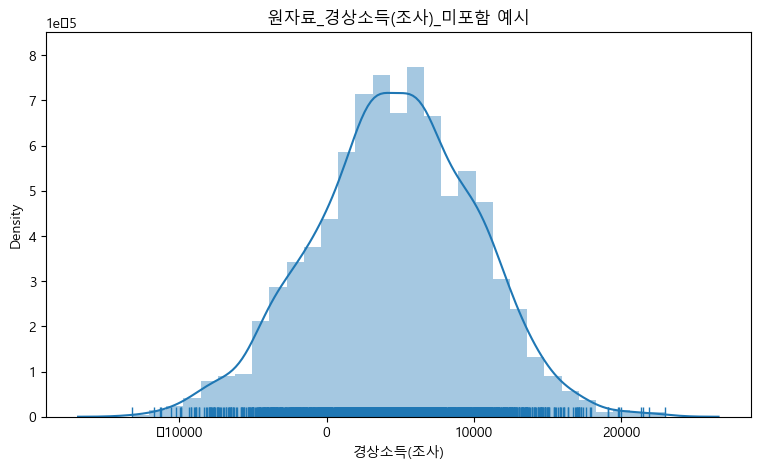

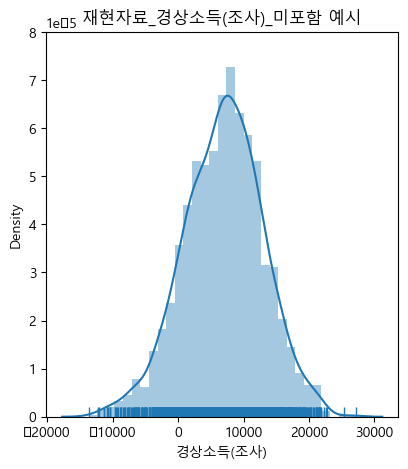

In [237]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = non_rho1_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_미포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_non_rho1_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_미포함 예시")
plt.show()

$\rho = 0.3$

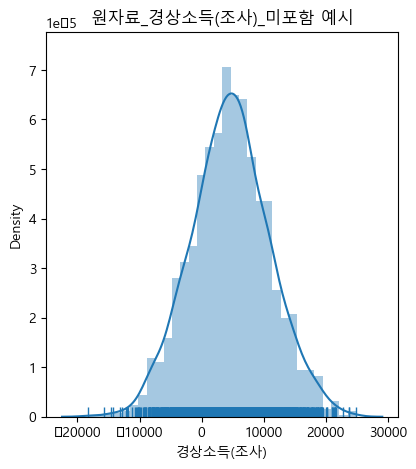

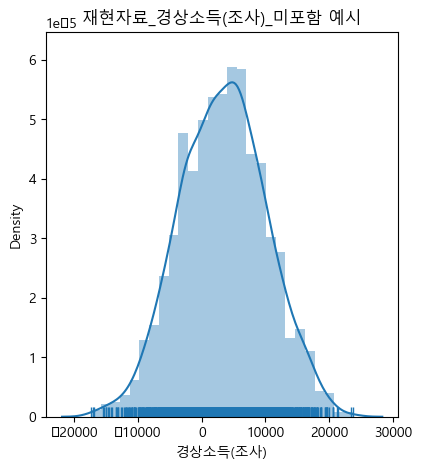

In [238]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = non_rho2_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_미포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_non_rho2_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_미포함 예시")
plt.show()

$\rho = 0.5$

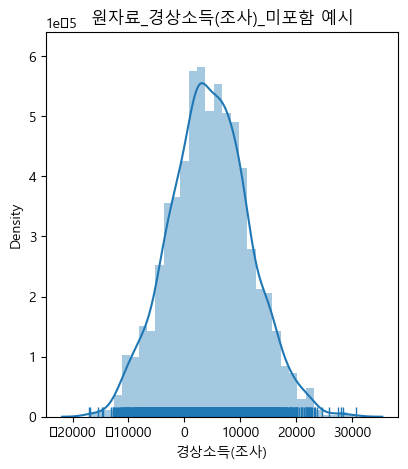

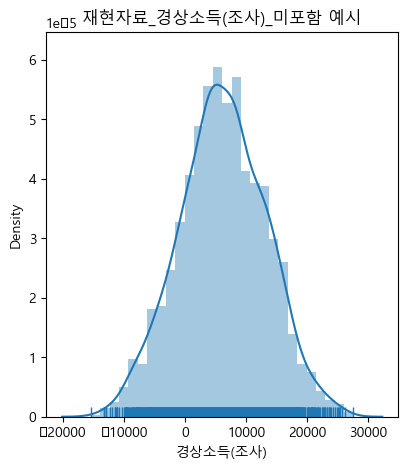

In [239]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = non_rho3_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_미포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_non_rho3_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_미포함 예시")
plt.show()

$\rho = 0.7$

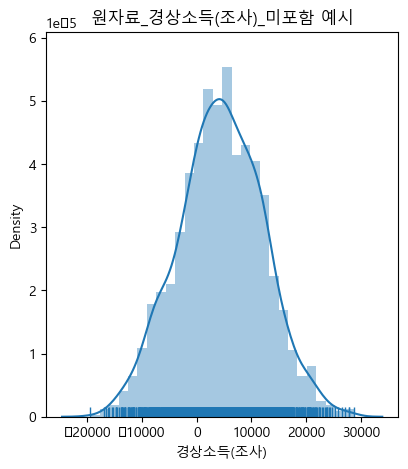

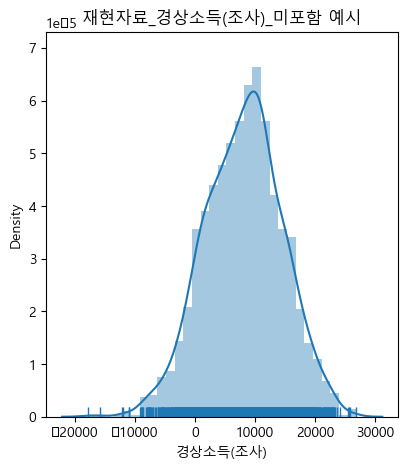

In [240]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = non_rho4_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_미포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_non_rho4_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_미포함 예시")
plt.show()

$\rho = 0.9$

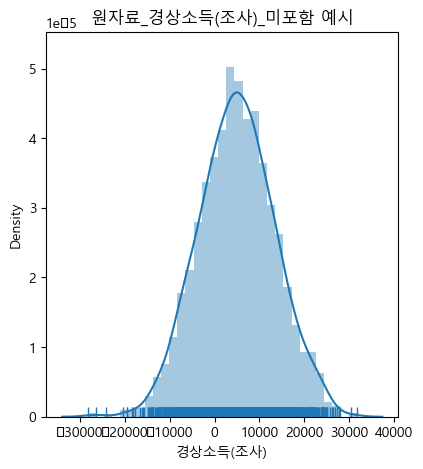

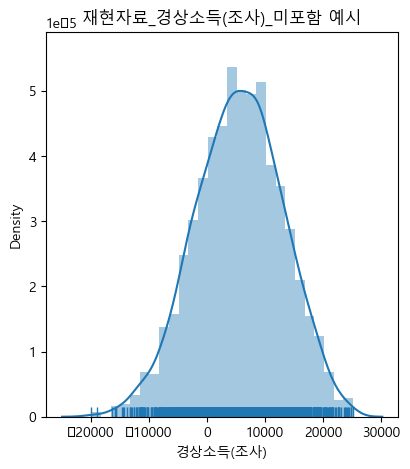

In [241]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = non_rho5_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_미포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_non_rho5_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_미포함 예시")
plt.show()

경상소득(조사) 포함 첫번째 시뮬레이션 예시

$\rho = 0.1$

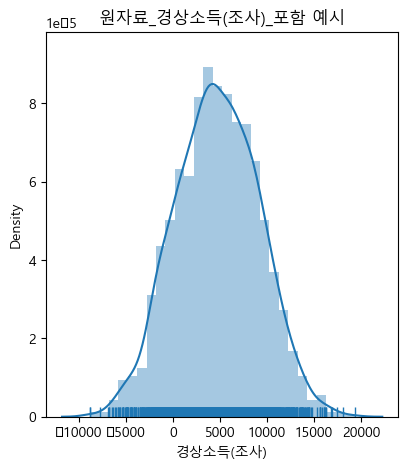

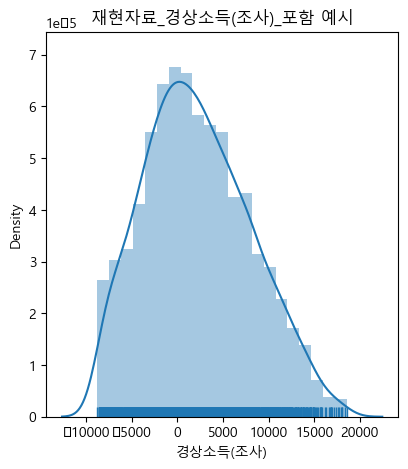

In [242]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = all_rho1_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_all_rho1_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_포함 예시")
plt.show()

$\rho = 0.3$

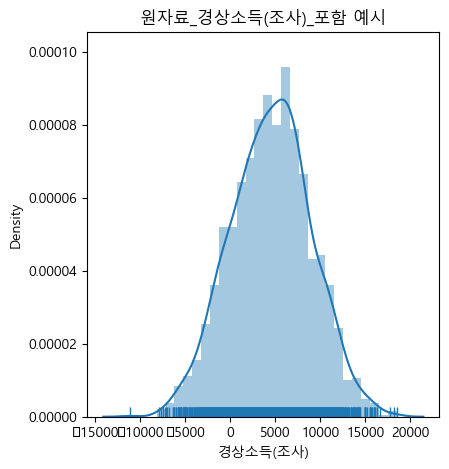

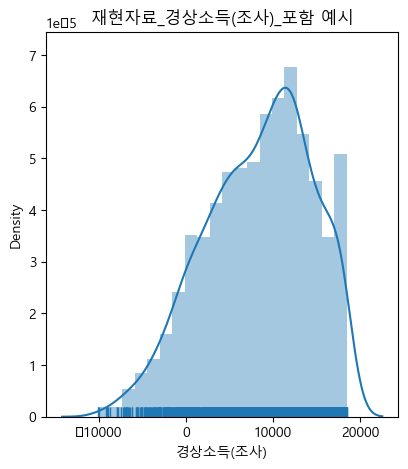

In [243]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = all_rho2_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_all_rho2_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_포함 예시")
plt.show()

$\rho = 0.5$

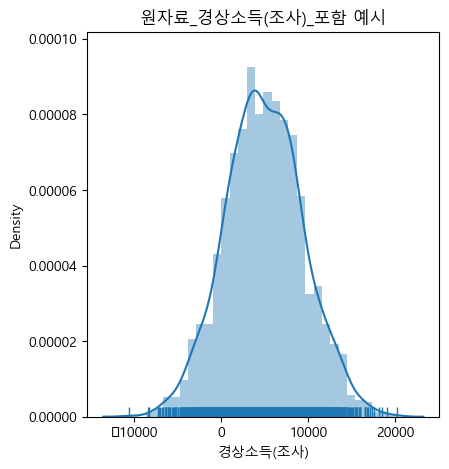

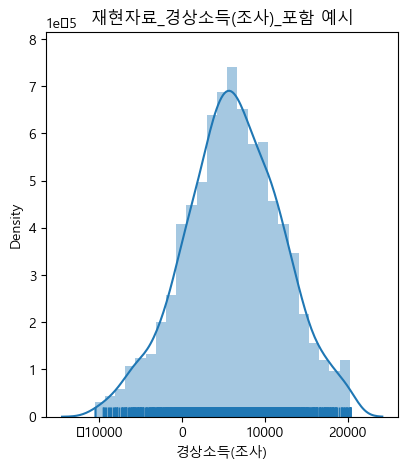

In [244]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = all_rho3_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_all_rho3_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_포함 예시")
plt.show()

$\rho = 0.7$

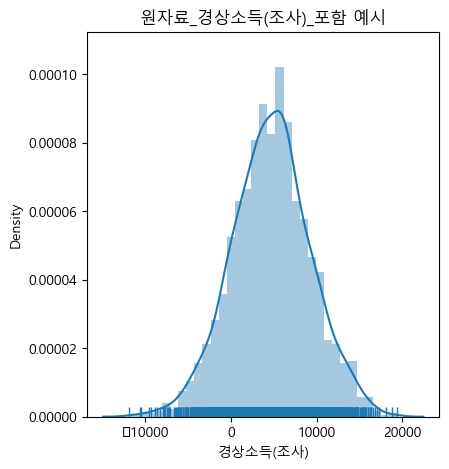

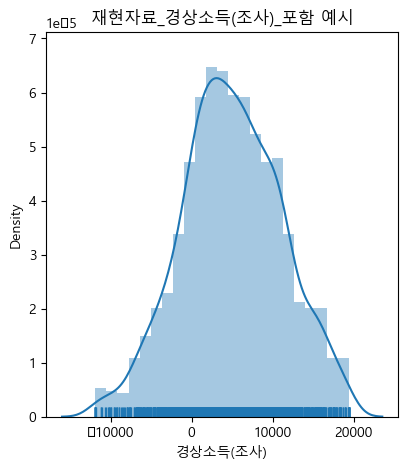

In [245]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = all_rho4_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_all_rho4_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_포함 예시")
plt.show()

$\rho = 0.9$

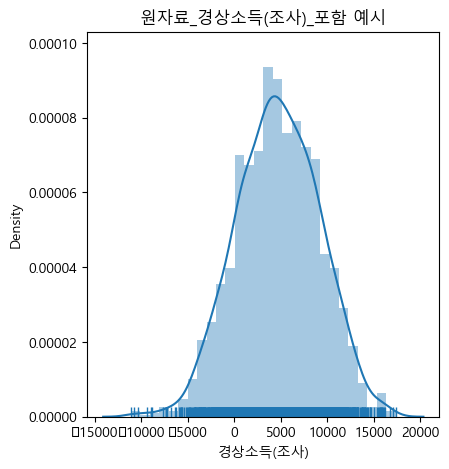

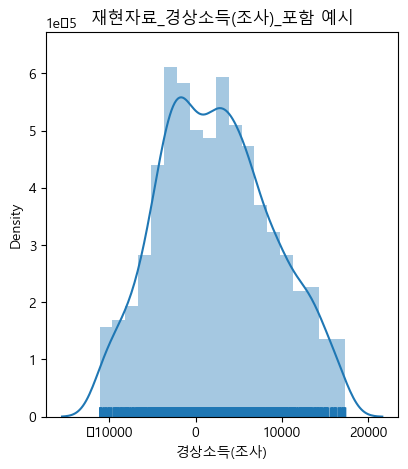

In [246]:
plt.subplot(1,2,1)
plt.rcParams["figure.figsize"] = (10,5)
x = all_rho5_mvn[1]['경상소득(조사)']
sns.distplot(x, kde=True, rug=True)
plt.title("원자료_경상소득(조사)_포함 예시")
plt.show()

plt.subplot(1,2,2)
plt.rcParams["figure.figsize"] = (10,5)
y = ori_all_rho5_data[1]['경상소득(조사)']
sns.distplot(y, kde=True, rug=True)
plt.title("재현자료_경상소득(조사)_포함 예시")
plt.show()

In [ ]:
sns.pairplot(ori_non_rho1_data[0].iloc[:,1:7])
plt.title("Iris Data의 Pair Plot")
plt.show()